<a href="https://colab.research.google.com/github/xaldoxxx/traderman/blob/main/ccxt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

CCXT

Acceso a múltiples intercambios: CCXT proporciona acceso a una amplia gama de intercambios de criptomonedas, lo que permite a los desarrolladores acceder a datos de mercado y realizar operaciones en diferentes plataformas de intercambio.

Interfaz unificada: CCXT ofrece una interfaz unificada para interactuar con los intercambios, lo que facilita el desarrollo de aplicaciones que funcionan con múltiples plataformas de intercambio sin necesidad de aprender las API específicas de cada uno.

Obtención de datos de mercado: Permite acceder a datos en tiempo real y históricos sobre precios, volumen, órdenes, operaciones recientes y otros indicadores de mercado en los intercambios compatibles.

Realización de operaciones comerciales: CCXT permite enviar órdenes de compra, venta, cancelación y modificación a los intercambios compatibles, lo que facilita la implementación de estrategias de trading automatizadas.

Manejo de cuentas: Permite acceder a información sobre el saldo de la cuenta, el historial de operaciones y otras métricas relacionadas con la cuenta en los intercambios compatibles.

In [1]:
# instalacion  de talib
url = 'https://anaconda.org/conda-forge/libta-lib/0.4.0/download/linux-64/libta-lib-0.4.0-h166bdaf_1.tar.bz2'
!curl -L $url | tar xj -C /usr/lib/x86_64-linux-gnu/ lib --strip-components=1
url = 'https://anaconda.org/conda-forge/ta-lib/0.4.19/download/linux-64/ta-lib-0.4.19-py310hde88566_4.tar.bz2'
!curl -L $url | tar xj -C /usr/local/lib/python3.10/dist-packages/ lib/python3.10/site-packages/talib --strip-components=3
import talib

#instalacion de ccxt
!pip install ccxt #https://github.com/ccxt/ccxt/wiki https://github.com/ccxt/ccxt

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  4087    0  4087    0     0   9071      0 --:--:-- --:--:-- --:--:--  9062
100  517k  100  517k    0     0   478k      0  0:00:01  0:00:01 --:--:--  478k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  4043    0  4043    0     0   8429      0 --:--:-- --:--:-- --:--:--  8422
100  392k  100  392k    0     0   338k      0  0:00:01  0:00:01 --:--:--  338k
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.7/288.7 kB 11.1 MB/s eta 0:00:00


In [ ]:
import ccxt
import pandas as pd

In [ ]:
print(ccxt.exchanges) # devuelve una lista de mercados que ccxt trabaja

['ace', 'alpaca', 'ascendex', 'bequant', 'bigone', 'binance', 'binancecoinm', 'binanceus', 'binanceusdm', 'bingx', 'bit2c', 'bitbank', 'bitbay', 'bitbns', 'bitcoincom', 'bitfinex', 'bitfinex2', 'bitflyer', 'bitget', 'bithumb', 'bitmart', 'bitmex', 'bitopro', 'bitpanda', 'bitrue', 'bitso', 'bitstamp', 'bitteam', 'bitvavo', 'bl3p', 'blockchaincom', 'blofin', 'btcalpha', 'btcbox', 'btcmarkets', 'btcturk', 'bybit', 'cex', 'coinbase', 'coinbaseinternational', 'coinbasepro', 'coincheck', 'coinex', 'coinlist', 'coinmate', 'coinmetro', 'coinone', 'coinsph', 'coinspot', 'cryptocom', 'currencycom', 'delta', 'deribit', 'digifinex', 'exmo', 'fmfwio', 'gate', 'gateio', 'gemini', 'hitbtc', 'hitbtc3', 'hollaex', 'htx', 'huobi', 'huobijp', 'hyperliquid', 'idex', 'independentreserve', 'indodax', 'kraken', 'krakenfutures', 'kucoin', 'kucoinfutures', 'kuna', 'latoken', 'lbank', 'luno', 'lykke', 'mercado', 'mexc', 'ndax', 'novadax', 'oceanex', 'okcoin', 'okx', 'onetrading', 'p2b', 'paymium', 'phemex', 'po

trabajamos con la billetera ascendex con su api publica

In [ ]:
exchanges = ccxt.bequant() # creamos una instancia

In [ ]:
markets = exchanges.fetchMarkets()

In [ ]:
print(exchanges.fetchMarkets()) # mostrar pares y otras funcionalidades en una lista

[{'id': 'XDCUSDT', 'symbol': 'XDC/USDT', 'base': 'XDC', 'quote': 'USDT', 'settle': None, 'baseId': 'XDC', 'quoteId': 'USDT', 'settleId': None, 'type': 'spot', 'spot': True, 'margin': False, 'swap': False, 'future': False, 'option': False, 'active': True, 'contract': False, 'linear': None, 'inverse': None, 'taker': 0.001, 'maker': 0.0001, 'contractSize': None, 'expiry': None, 'expiryDatetime': None, 'strike': None, 'optionType': None, 'feeCurrency': 'USDT', 'precision': {'amount': 0.1, 'price': 1e-06}, 'limits': {'leverage': {'min': 1.0, 'max': 1}, 'amount': {'min': 0.1, 'max': None}, 'price': {'min': 1e-06, 'max': None}, 'cost': {'min': 1e-07, 'max': None}}, 'created': None, 'info': {'type': 'spot', 'base_currency': 'XDC', 'quote_currency': 'USDT', 'status': 'working', 'quantity_increment': '0.1', 'tick_size': '0.000001', 'take_rate': '0.001', 'make_rate': '0.0001', 'fee_currency': 'USDT'}}, {'id': 'ETHTUSD', 'symbol': 'ETH/TUSD', 'base': 'ETH', 'quote': 'TUSD', 'settle': None, 'baseId

In [ ]:
markets_df = pd.DataFrame(markets)

In [ ]:
markets_df

,id,symbol,base,quote,settle,baseId,quoteId,settleId,type,spot,...,contractSize,expiry,expiryDatetime,strike,optionType,feeCurrency,precision,limits,created,info
0,XDCUSDT,XDC/USDT,XDC,USDT,None,XDC,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 0.1, 'price': 1e-06}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'XDC', 'quot..."
1,ETHTUSD,ETH/TUSD,ETH,TUSD,None,ETH,TUSD,None,spot,True,...,NaN,None,None,None,None,TUSD,"{'amount': 0.0001, 'price': 0.001}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'ETH', 'quot..."
2,NEOETH,NEO/ETH,NEO,ETH,None,NEO,ETH,None,spot,True,...,NaN,None,None,None,None,ETH,"{'amount': 0.01, 'price': 1e-07}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'NEO', 'quot..."
3,CRVBTC,CRV/BTC,CRV,BTC,None,CRV,BTC,None,spot,True,...,NaN,None,None,None,None,BTC,"{'amount': 0.1, 'price': 1e-09}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'CRV', 'quot..."
4,YFIBTC,YFI/BTC,YFI,BTC,None,YFI,BTC,None,spot,True,...,NaN,None,None,None,None,BTC,"{'amount': 1e-06, 'price': 0.0001}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'YFI', 'quot..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231,ETHEUR,ETH/EUR,ETH,EUR,None,ETH,EUR,None,spot,True,...,NaN,None,None,None,None,EUR,"{'amount': 0.0001, 'price': 0.001}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'ETH', 'quot..."
232,ETCETH,ETC/ETH,ETC,ETH,None,ETC,ETH,None,spot,True,...,NaN,None,None,None,None,ETH,"{'amount': 0.01, 'price': 1e-07}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'ETC', 'quot..."
233,CHZUSDT,CHZ/USDT,CHZ,USDT,None,CHZ,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 1.0, 'price': 1e-07}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'CHZ', 'quot..."
234,ENJBTC,ENJ/BTC,ENJ,BTC,None,ENJ,BTC,None,spot,True,...,NaN,None,None,None,None,BTC,"{'amount': 0.1, 'price': 1e-09}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'ENJ', 'quot..."


busco solo pares usdt

In [ ]:
markets_usdt = markets_df[markets_df['id'].str.contains('USDT')] # busco solo pares usdt

In [ ]:
markets_usdt # hay 978 rows × 29 columns

,id,symbol,base,quote,settle,baseId,quoteId,settleId,type,spot,...,contractSize,expiry,expiryDatetime,strike,optionType,feeCurrency,precision,limits,created,info
0,XDCUSDT,XDC/USDT,XDC,USDT,None,XDC,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 0.1, 'price': 1e-06}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'XDC', 'quot..."
5,ZRXUSDT,ZRX/USDT,ZRX,USDT,None,ZRX,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 0.1, 'price': 1e-06}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'ZRX', 'quot..."
6,LTCUSDT_PERP,LTC/USDT:USDT,LTC,USDT,USDT,LTC,USDT,USDT,swap,False,...,1.0,None,None,None,None,USDT,"{'amount': 0.01, 'price': 0.001}","{'leverage': {'min': 1.0, 'max': 50.0}, 'amoun...",None,"{'type': 'futures', 'contract_type': 'perpetua..."
8,WAVESUSDT,WAVES/USDT,WAVES,USDT,None,WAVES,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 0.01, 'price': 1e-05}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'WAVES', 'qu..."
11,XTZUSDT,XTZ/USDT,XTZ,USDT,None,XTZ,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 0.1, 'price': 1e-06}","{'leverage': {'min': 1.0, 'max': 5.0}, 'amount...",None,"{'type': 'spot', 'base_currency': 'XTZ', 'quot..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221,XEMUSDT,XEM/USDT,XEM,USDT,None,XEM,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 1.0, 'price': 1e-07}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'XEM', 'quot..."
222,TRXUSDT_PERP,TRX/USDT:USDT,TRX,USDT,USDT,TRX,USDT,USDT,swap,False,...,1.0,None,None,None,None,USDT,"{'amount': 1.0, 'price': 1e-07}","{'leverage': {'min': 1.0, 'max': 50.0}, 'amoun...",None,"{'type': 'futures', 'contract_type': 'perpetua..."
228,ZILUSDT,ZIL/USDT,ZIL,USDT,None,ZIL,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 1.0, 'price': 1e-07}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'ZIL', 'quot..."
230,DYDXUSDT,DYDX/USDT,DYDX,USDT,None,DYDX,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 0.001, 'price': 0.0001}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'DYDX', 'quo..."


In [ ]:
markets_usdt.dtypes

id                 object
symbol             object
base               object
quote              object
settle             object
baseId             object
quoteId            object
settleId           object
type               object
spot                 bool
margin               bool
swap                 bool
future               bool
option               bool
active               bool
contract             bool
linear             object
inverse            object
taker             float64
maker             float64
contractSize      float64
expiry             object
expiryDatetime     object
strike             object
optionType         object
feeCurrency        object
precision          object
limits             object
created            object
info               object
dtype: object

In [ ]:
markets_usdt = markets_df[(markets_df['quote'].str.contains('USDT')) & (markets_df['spot'])] # busco solo pares usdt y que esten en spot o estan prendidos

In [ ]:
markets_df.info

<bound method DataFrame.info of           id    symbol base quote settle baseId quoteId settleId  type  spot  \
0    XDCUSDT  XDC/USDT  XDC  USDT   None    XDC    USDT     None  spot  True   
1    ETHTUSD  ETH/TUSD  ETH  TUSD   None    ETH    TUSD     None  spot  True   
2     NEOETH   NEO/ETH  NEO   ETH   None    NEO     ETH     None  spot  True   
3     CRVBTC   CRV/BTC  CRV   BTC   None    CRV     BTC     None  spot  True   
4     YFIBTC   YFI/BTC  YFI   BTC   None    YFI     BTC     None  spot  True   
..       ...       ...  ...   ...    ...    ...     ...      ...   ...   ...   
231   ETHEUR   ETH/EUR  ETH   EUR   None    ETH     EUR     None  spot  True   
232   ETCETH   ETC/ETH  ETC   ETH   None    ETC     ETH     None  spot  True   
233  CHZUSDT  CHZ/USDT  CHZ  USDT   None    CHZ    USDT     None  spot  True   
234   ENJBTC   ENJ/BTC  ENJ   BTC   None    ENJ     BTC     None  spot  True   
235   NEODAI   NEO/DAI  NEO   DAI   None    NEO     DAI     None  spot  True   

     ...  contractSize  expiry  expiryDatetime  strike  optionType  \
0    ...           NaN    None            None    None        None   
1    ...           NaN    None            None    None        None   
2    ...           NaN    None            None    None        None   
3    ...           NaN    None            None    None        None   
4    ...           NaN    None            None    None        None   
..   ...           ...     ...             ...     ...         ...   
231  ...           NaN    None            None    None        None   
232  ...           NaN    None            None    None        None   
233  ...           NaN    None            None    None        None   
234  ...           NaN    None            None    None        None   
235  ...           NaN    None            None    None        None   

     feeCurrency                           precision  \
0           USDT     {'amount': 0.1, 'price': 1e-06}   
1           TUSD  {'amount': 0.0001, 'price': 0.001}   
2            ETH    {'amount': 0.01, 'price': 1e-07}   
3            BTC     {'amount': 0.1, 'price': 1e-09}   
4            BTC  {'amount': 1e-06, 'price': 0.0001}   
..           ...                                 ...   
231          EUR  {'amount': 0.0001, 'price': 0.001}   
232          ETH    {'amount': 0.01, 'price': 1e-07}   
233         USDT     {'amount': 1.0, 'price': 1e-07}   
234          BTC     {'amount': 0.1, 'price': 1e-09}   
235          DAI    {'amount': 0.01, 'price': 1e-05}   

                                                limits  created  \
0    {'leverage': {'min': 1.0, 'max': 1}, 'amount':...     None   
1    {'leverage': {'min': 1.0, 'max': 1}, 'amount':...     None   
2    {'leverage': {'min': 1.0, 'max': 1}, 'amount':...     None   
3    {'leverage': {'min': 1.0, 'max': 1}, 'amount':...     None   
4    {'leverage': {'min': 1.0, 'max': 1}, 'amount':...     None   
..                                                 ...      ...   
231  {'leverage': {'min': 1.0, 'max': 1}, 'amount':...     None   
232  {'leverage': {'min': 1.0, 'max': 1}, 'amount':...     None   
233  {'leverage': {'min': 1.0, 'max': 1}, 'amount':...     None   
234  {'leverage': {'min': 1.0, 'max': 1}, 'amount':...     None   
235  {'leverage': {'min': 1.0, 'max': 1}, 'amount':...     None   

                                                  info  
0    {'type': 'spot', 'base_currency': 'XDC', 'quot...  
1    {'type': 'spot', 'base_currency': 'ETH', 'quot...  
2    {'type': 'spot', 'base_currency': 'NEO', 'quot...  
3    {'type': 'spot', 'base_currency': 'CRV', 'quot...  
4    {'type': 'spot', 'base_currency': 'YFI', 'quot...  
..                                                 ...  
231  {'type': 'spot', 'base_currency': 'ETH', 'quot...  
232  {'type': 'spot', 'base_currency': 'ETC', 'quot...  
233  {'type': 'spot', 'base_currency': 'CHZ', 'quot...  
234  {'type': 'spot', 'base_currency': 'ENJ', 'quot...  
235  {'type': 'spot', 'base_currency': 'NEO', 'quot...  

[23

In [ ]:
markets_usdt

,id,symbol,base,quote,settle,baseId,quoteId,settleId,type,spot,...,contractSize,expiry,expiryDatetime,strike,optionType,feeCurrency,precision,limits,created,info
0,XDCUSDT,XDC/USDT,XDC,USDT,None,XDC,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 0.1, 'price': 1e-06}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'XDC', 'quot..."
5,ZRXUSDT,ZRX/USDT,ZRX,USDT,None,ZRX,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 0.1, 'price': 1e-06}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'ZRX', 'quot..."
8,WAVESUSDT,WAVES/USDT,WAVES,USDT,None,WAVES,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 0.01, 'price': 1e-05}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'WAVES', 'qu..."
11,XTZUSDT,XTZ/USDT,XTZ,USDT,None,XTZ,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 0.1, 'price': 1e-06}","{'leverage': {'min': 1.0, 'max': 5.0}, 'amount...",None,"{'type': 'spot', 'base_currency': 'XTZ', 'quot..."
12,BNBUSDT,BNB/USDT,BNB,USDT,None,BNB,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 0.01, 'price': 1e-05}","{'leverage': {'min': 1.0, 'max': 5.0}, 'amount...",None,"{'type': 'spot', 'base_currency': 'BNB', 'quot..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,FTMUSDT,FTM/USDT,FTM,USDT,None,FTM,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 1.0, 'price': 1e-07}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'FTM', 'quot..."
221,XEMUSDT,XEM/USDT,XEM,USDT,None,XEM,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 1.0, 'price': 1e-07}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'XEM', 'quot..."
228,ZILUSDT,ZIL/USDT,ZIL,USDT,None,ZIL,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 1.0, 'price': 1e-07}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'ZIL', 'quot..."
230,DYDXUSDT,DYDX/USDT,DYDX,USDT,None,DYDX,USDT,None,spot,True,...,NaN,None,None,None,None,USDT,"{'amount': 0.001, 'price': 0.0001}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'DYDX', 'quo..."


In [ ]:
markets_usdt.columns

Index(['id', 'symbol', 'base', 'quote', 'settle', 'baseId', 'quoteId',
       'settleId', 'type', 'spot', 'margin', 'swap', 'future', 'option',
       'active', 'contract', 'linear', 'inverse', 'taker', 'maker',
       'contractSize', 'expiry', 'expiryDatetime', 'strike', 'optionType',
       'feeCurrency', 'precision', 'limits', 'created', 'info'],
      dtype='object')

In [ ]:
markets_usdt.set_index('id', inplace=True)

In [ ]:
markets_usdt

,symbol,base,quote,settle,baseId,quoteId,settleId,type,spot,margin,...,contractSize,expiry,expiryDatetime,strike,optionType,feeCurrency,precision,limits,created,info
id,,,,,,,,,,,,,,,,,,,,,
XDCUSDT,XDC/USDT,XDC,USDT,None,XDC,USDT,None,spot,True,False,...,NaN,None,None,None,None,USDT,"{'amount': 0.1, 'price': 1e-06}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'XDC', 'quot..."
ZRXUSDT,ZRX/USDT,ZRX,USDT,None,ZRX,USDT,None,spot,True,False,...,NaN,None,None,None,None,USDT,"{'amount': 0.1, 'price': 1e-06}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'ZRX', 'quot..."
WAVESUSDT,WAVES/USDT,WAVES,USDT,None,WAVES,USDT,None,spot,True,False,...,NaN,None,None,None,None,USDT,"{'amount': 0.01, 'price': 1e-05}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'WAVES', 'qu..."
XTZUSDT,XTZ/USDT,XTZ,USDT,None,XTZ,USDT,None,spot,True,True,...,NaN,None,None,None,None,USDT,"{'amount': 0.1, 'price': 1e-06}","{'leverage': {'min': 1.0, 'max': 5.0}, 'amount...",None,"{'type': 'spot', 'base_currency': 'XTZ', 'quot..."
BNBUSDT,BNB/USDT,BNB,USDT,None,BNB,USDT,None,spot,True,True,...,NaN,None,None,None,None,USDT,"{'amount': 0.01, 'price': 1e-05}","{'leverage': {'min': 1.0, 'max': 5.0}, 'amount...",None,"{'type': 'spot', 'base_currency': 'BNB', 'quot..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FTMUSDT,FTM/USDT,FTM,USDT,None,FTM,USDT,None,spot,True,False,...,NaN,None,None,None,None,USDT,"{'amount': 1.0, 'price': 1e-07}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'FTM', 'quot..."
XEMUSDT,XEM/USDT,XEM,USDT,None,XEM,USDT,None,spot,True,False,...,NaN,None,None,None,None,USDT,"{'amount': 1.0, 'price': 1e-07}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'XEM', 'quot..."
ZILUSDT,ZIL/USDT,ZIL,USDT,None,ZIL,USDT,None,spot,True,False,...,NaN,None,None,None,None,USDT,"{'amount': 1.0, 'price': 1e-07}","{'leverage': {'min': 1.0, 'max': 1}, 'amount':...",None,"{'type': 'spot', 'base_currency': 'ZIL', 'quot..."


In [ ]:
# buscar una fila especifica a partir de su indice
markets_usdt.loc['BTC/USDT']

KeyError: 'BTC/USDT'

In [ ]:
import ccxt
import pandas as pd

# Crear una instancia del exchange blockchain.com
exchange = ccxt.bequant()

# Obtener los datos de los pares de trading
markets = exchange.fetchMarkets()

# Convertir los datos en un DataFrame de pandas
markets_df = pd.DataFrame(markets)

# Filtrar solo los pares USDT que estén en spot
markets_usdt = markets_df[(markets_df['quote'].str.contains('USDT')) & (markets_df['spot'])]

# Establecer el índice del DataFrame como 'id'
markets_usdt.set_index('id', inplace=True)

# Seleccionar el par BTC/USDT y obtener los datos del mercado
btc_usdt_data = exchange.fetch_ohlcv('BTC/USDT', timeframe='1h')

# Convertir los datos en un DataFrame de pandas
btc_usdt_df = pd.DataFrame(btc_usdt_data, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
btc_usdt_df['timestamp'] = pd.to_datetime(btc_usdt_df['timestamp'], unit='ms')
btc_usdt_df.set_index('timestamp', inplace=True)

# Definir la estrategia de cruce de medias móviles
def moving_average_crossover_strategy(df, short_window=50, long_window=200):
    # Calcular las medias móviles
    df['short_mavg'] = df['close'].rolling(window=short_window, min_periods=1).mean()
    df['long_mavg'] = df['close'].rolling(window=long_window, min_periods=1).mean()

    # Generar señales de compra y venta
    df['signal'] = 0
    df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)
    df['positions'] = df['signal'].diff()

    return df

# Aplicar la estrategia de trading al par BTC/USDT
btc_usdt_df = moving_average_crossover_strategy(btc_usdt_df)

# Imprimir los resultados
print(btc_usdt_df.tail())


                         open      high       low     close    volume  \
timestamp                                                               
2024-04-22 03:00:00  64785.53  66049.99  64785.53  65711.40  47.29962   
2024-04-22 04:00:00  65672.46  65869.53  65516.53  65720.23  22.49762   
2024-04-22 05:00:00  65724.19  66398.00  65722.79  66381.40  21.48396   
2024-04-22 06:00:00  66386.98  66398.00  66166.96  66316.01  32.92384   
2024-04-22 07:00:00  66306.63  66464.67  65977.60  66038.71  37.42438   

                     short_mavg     long_mavg  signal  positions  
timestamp                                                         
2024-04-22 03:00:00  64649.5754  63987.827292       1        0.0  
2024-04-22 04:00:00  64687.1600  64005.687113       1        0.0  
2024-04-22 05:00:00  64735.7184  64029.929082       1        0.0  
2024-04-22 06:00:00  64778.7426  64053.020808       1        0.0  
2024-04-22 07:00:00  64815.7604  64072.877700       1        0.0  


<ipython-input-113-eed97449576d>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


In [ ]:
import ccxt
import pandas as pd
import numpy as np

# Crear una instancia del exchange Binance
exchange = ccxt.bequant()

# Obtener los datos del par de trading BTC/USDT
btc_usdt_data = exchange.fetch_ohlcv('BTC/USDT', timeframe='1h')

# Convertir los datos en un DataFrame de pandas
btc_usdt_df = pd.DataFrame(btc_usdt_data, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
btc_usdt_df['timestamp'] = pd.to_datetime(btc_usdt_df['timestamp'], unit='ms')
btc_usdt_df.set_index('timestamp', inplace=True)

# Definir la función para calcular el RSI
def calculate_rsi(df, period=14):
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

# Calcular el RSI y agregarlo al DataFrame
btc_usdt_df['rsi'] = calculate_rsi(btc_usdt_df)

# Imprimir los resultados
print(btc_usdt_df.tail())


                         open      high       low     close    volume  \
timestamp                                                               
2024-04-22 03:00:00  64785.53  66049.99  64785.53  65711.40  47.29962   
2024-04-22 04:00:00  65672.46  65869.53  65516.53  65720.23  22.49762   
2024-04-22 05:00:00  65724.19  66398.00  65722.79  66381.40  21.48396   
2024-04-22 06:00:00  66386.98  66398.00  66166.96  66316.01  32.92384   
2024-04-22 07:00:00  66306.63  66464.67  65977.60  66038.71  37.42438   

                           rsi  
timestamp                       
2024-04-22 03:00:00  63.829984  
2024-04-22 04:00:00  63.513243  
2024-04-22 05:00:00  68.566550  
2024-04-22 06:00:00  77.904636  
2024-04-22 07:00:00  69.163928  


In [ ]:
import ccxt
import pandas as pd
import numpy as np

# Crear una instancia del exchange Binance
exchange = ccxt.bequant()

# Obtener los datos del par de trading BTC/USDT
btc_usdt_data = exchange.fetch_trading_limits('BTC-USDT', timeframe='1h')

# Convertir los datos en un DataFrame de pandas
btc_usdt_df = pd.DataFrame(btc_usdt_data, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
btc_usdt_df['timestamp'] = pd.to_datetime(btc_usdt_df['timestamp'], unit='ms')
btc_usdt_df.set_index('timestamp', inplace=True)

# Definir la función para calcular el RSI
def calculate_rsi(df, period=14):
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    df['rsi'] = rsi  # Agregar el RSI al DataFrame
    return df

# Definir la función para imprimir el mensaje de compra o venta basado en el RSI
def print_buy_sell_signal(rsi_value):
    if rsi_value > 70:
        print("El RSI es {}. Se recomienda vender.".format(rsi_value))
    elif rsi_value < 30:
        print("El RSI es {}. Se recomienda comprar.".format(rsi_value))
    else:
        print("El RSI es {}. No se recomienda comprar ni vender en este momento.".format(rsi_value))

# Calcular el RSI y agregarlo al DataFrame
rsi_value = calculate_rsi(btc_usdt_df)['rsi'].iloc[-1]  # Obtener el valor del RSI más reciente
print_buy_sell_signal(rsi_value)


TypeError: Exchange.fetch_trading_limits() got an unexpected keyword argument 'timeframe'

In [ ]:
import ccxt
import pandas as pd
import numpy as np

# Crear una instancia del exchange Binance
exchange = ccxt.bequant()

# Obtener los datos del par de trading BTC/USDT
btc_usdt_data = exchange.fetch_ohlcv('BTC/USDT', timeframe='1h')

# Convertir los datos en un DataFrame de pandas
btc_usdt_df = pd.DataFrame(btc_usdt_data, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
btc_usdt_df['timestamp'] = pd.to_datetime(btc_usdt_df['timestamp'], unit='ms')
btc_usdt_df.set_index('timestamp', inplace=True)

# Definir la función para calcular el MACD
def calculate_macd(df, short_window=12, long_window=26, signal_window=9):
    exp1 = df['close'].ewm(span=short_window, adjust=False).mean()
    exp2 = df['close'].ewm(span=long_window, adjust=False).mean()
    macd = exp1 - exp2
    signal = macd.ewm(span=signal_window, adjust=False).mean()
    return macd, signal

# Definir la función para imprimir el mensaje de compra o venta basado en el cruce de los valores MACD y señal
def print_buy_sell_signal(macd, signal):
    if macd[-1] > signal[-1] and macd[-2] <= signal[-2]:
        print("Se recomienda comprar. El MACD ha cruzado por encima de la señal.")
    elif macd[-1] < signal[-1] and macd[-2] >= signal[-2]:
        print("Se recomienda vender. El MACD ha cruzado por debajo de la señal.")
    else:
        print("No se recomienda comprar ni vender en este momento.")

# Calcular el MACD y la señal y agregarlos al DataFrame
macd, signal = calculate_macd(btc_usdt_df)
btc_usdt_df['macd'] = macd
btc_usdt_df['signal'] = signal

# Imprimir los resultados
print(btc_usdt_df.tail())

# Imprimir el mensaje de compra o venta basado en el cruce de los valores MACD y señal
print_buy_sell_signal(macd, signal)


                         open      high       low     close    volume  \
timestamp                                                               
2024-04-22 03:00:00  64785.53  66049.99  64785.53  65711.40  47.29962   
2024-04-22 04:00:00  65672.46  65869.53  65516.53  65720.23  22.49762   
2024-04-22 05:00:00  65724.19  66398.00  65722.79  66381.40  21.48396   
2024-04-22 06:00:00  66386.98  66398.00  66166.96  66316.01  32.92384   
2024-04-22 07:00:00  66306.63  66464.67  65977.60  65993.39  37.42439   

                           macd      signal  
timestamp                                    
2024-04-22 03:00:00   95.037412   62.304742  
2024-04-22 04:00:00  148.751685   79.594130  
2024-04-22 05:00:00  241.883246  112.051953  
2024-04-22 06:00:00  306.876769  151.016917  
2024-04-22 07:00:00  328.564381  186.526409  
No se recomienda comprar ni vender en este momento.


In [ ]:
import pandas as pd
import numpy as np

# Simular datos de precios
np.random.seed(0)
timestamps = pd.date_range(start='2024-04-01', end='2024-04-22', freq='H')
close_prices = np.random.randint(60000, 70000, size=len(timestamps))
volume = np.random.randint(1000, 5000, size=len(timestamps))

# Crear DataFrame con los datos simulados
btc_usdt_df = pd.DataFrame({'timestamp': timestamps, 'close': close_prices, 'volume': volume})
btc_usdt_df.set_index('timestamp', inplace=True)

# Definir la función para calcular el MACD
def calculate_macd(df, short_window=12, long_window=26, signal_window=9):
    exp1 = df['close'].ewm(span=short_window, adjust=False).mean()
    exp2 = df['close'].ewm(span=long_window, adjust=False).mean()
    macd = exp1 - exp2
    signal = macd.ewm(span=signal_window, adjust=False).mean()
    return macd, signal

# Calcular el MACD y la señal y agregarlos al DataFrame
macd, signal = calculate_macd(btc_usdt_df)
btc_usdt_df['macd'] = macd
btc_usdt_df['signal'] = signal

# Imprimir los resultados
print(btc_usdt_df.tail())

# Imprimir el mensaje de compra o venta basado en el cruce de los valores MACD y señal
if macd[-1] > signal[-1] and macd[-2] <= signal[-2]:
    print("Se recomienda comprar. El MACD ha cruzado por encima de la señal.")
elif macd[-1] < signal[-1] and macd[-2] >= signal[-2]:
    print("Se recomienda vender. El MACD ha cruzado por debajo de la señal.")
else:
    print("No se recomienda comprar ni vender en este momento.")


                     close  volume        macd      signal
timestamp                                                 
2024-04-21 20:00:00  67845    4988 -257.922987 -321.599509
2024-04-21 21:00:00  61747    2706 -525.902225 -362.460053
2024-04-21 22:00:00  67828    4962 -244.770265 -338.922095
2024-04-21 23:00:00  69094    3489   79.270676 -255.283541
2024-04-22 00:00:00  63868    2169  -84.643352 -221.155503
No se recomienda comprar ni vender en este momento.


In [ ]:
import ccxt
import pandas as pd
import numpy as np

# Crear una instancia del exchange Binance
exchange = ccxt.bequant()

# Definir el par de trading y el intervalo de tiempo deseado
symbol = 'BTC/USDT'
timeframe = '1h'

# Obtener los datos históricos de trading usando fetch_trades
trades = exchange.fetch_trades(symbol, limit=None, since=None, params={'limit': 1000})
trades_df = pd.DataFrame(trades)

# Procesar los datos para obtener el precio de cierre y el volumen en intervalos de tiempo específicos
trades_df['timestamp'] = pd.to_datetime(trades_df['timestamp'], unit='ms')
trades_df.set_index('timestamp', inplace=True)
resampled_df = trades_df['price'].resample(timeframe).ohlc()
resampled_df['volume'] = trades_df['amount'].resample(timeframe).sum()

# Calcular el precio de cierre promedio en caso de que haya más de un trade por intervalo de tiempo
resampled_df['close'] = (resampled_df['close'] + resampled_df['open'] + resampled_df['high'] + resampled_df['low']) / 4

# Definir la función para calcular el MACD
def calculate_macd(df, short_window=12, long_window=26, signal_window=9):
    exp1 = df['close'].ewm(span=short_window, adjust=False).mean()
    exp2 = df['close'].ewm(span=long_window, adjust=False).mean()
    macd = exp1 - exp2
    signal = macd.ewm(span=signal_window, adjust=False).mean()
    return macd, signal

# Calcular el MACD y la señal y agregarlos al DataFrame
macd, signal = calculate_macd(resampled_df)
resampled_df['macd'] = macd
resampled_df['signal'] = signal

# Imprimir los resultados
print(resampled_df.tail())

# Imprimir el mensaje de compra o venta basado en el cruce de los valores MACD y señal
if macd[-1] > signal[-1] and macd[-2] <= signal[-2]:
    print("Se recomienda comprar. El MACD ha cruzado por encima de la señal.")
elif macd[-1] < signal[-1] and macd[-2] >= signal[-2]:
    print("Se recomienda vender. El MACD ha cruzado por debajo de la señal.")
else:
    print("No se recomienda comprar ni vender en este momento.")


                         open      high       low       close    volume  \
timestamp                                                                 
2024-04-22 04:00:00  65654.64  65830.28  65654.64  65714.9475   5.89636   
2024-04-22 05:00:00  65724.19  66398.00  65722.79  66056.5950  21.48396   
2024-04-22 06:00:00  66386.98  66398.00  66166.96  66316.9875  32.92384   
2024-04-22 07:00:00  66306.63  66464.67  65977.60  66185.5725  37.42439   

                          macd     signal  
timestamp                                  
2024-04-22 04:00:00   0.000000   0.000000  
2024-04-22 05:00:00  27.253932   5.450786  
2024-04-22 06:00:00  69.068192  18.174268  
2024-04-22 07:00:00  90.558303  32.651075  
No se recomienda comprar ni vender en este momento.


In [ ]:
import ccxt
import pandas as pd
import numpy as np

# Crear una instancia del exchange Binance
exchange = ccxt.bequant()

# Obtener los datos del par de trading BTC/USDT usando fetch_trades
symbol = 'BTC/USDT'
trades = exchange.fetch_trades(symbol, limit=None, since=None, params={'limit': 1000})
trades_df = pd.DataFrame(trades)
trades_df['timestamp'] = pd.to_datetime(trades_df['timestamp'], unit='ms')
trades_df.set_index('timestamp', inplace=True)

# Procesar los datos para obtener el precio de cierre en intervalos de tiempo específicos
btc_usdt_df = trades_df['price'].resample('1h').ohlc()

# Definir la función para calcular el RSI
# Ajustar la función calculate_rsi para manejar valores NaN
def calculate_rsi(df, period=14):
    delta = df['close'].diff()
    delta = delta.dropna()  # Eliminar valores NaN
    gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi


# Calcular el RSI y obtener el valor más reciente
rsi_value = calculate_rsi(btc_usdt_df).iloc[-1]

# Definir la función para imprimir el mensaje de compra o venta basado en el RSI
def print_buy_sell_signal(rsi_value):
    if rsi_value > 70:
        print("El RSI es {}. Se recomienda vender.".format(rsi_value))
    elif rsi_value < 30:
        print("El RSI es {}. Se recomienda comprar.".format(rsi_value))
    else:
        print("El RSI es {}. No se recomienda comprar ni vender en este momento.".format(rsi_value))

# Imprimir el mensaje de compra o venta basado en el RSI
print_buy_sell_signal(rsi_value)


El RSI es nan. No se recomienda comprar ni vender en este momento.


In [ ]:
import ccxt
import pandas as pd
import numpy as np

# Crear una instancia del exchange Binance
exchange = ccxt.bequant()

# Obtener los datos del par de trading BTC/USDT usando fetch_trades
symbol = 'BTC/USDT'
trades = exchange.fetch_trades(symbol, limit=None, since=None, params={'limit': 1000})
trades_df = pd.DataFrame(trades)
trades_df['timestamp'] = pd.to_datetime(trades_df['timestamp'], unit='ms')
trades_df.set_index('timestamp', inplace=True)

# Procesar los datos para obtener el precio de cierre en intervalos de tiempo específicos
btc_usdt_df = trades_df['price'].resample('1h').ohlc()

# Definir la función para calcular el RSI
def calculate_rsi(df, period=14):
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

# Calcular el RSI y obtener el valor más reciente
rsi_series = calculate_rsi(btc_usdt_df)
if not rsi_series.isnull().values.any():
    rsi_value = rsi_series.iloc[-1]
    print_buy_sell_signal(rsi_value)
else:
    print("No se pudo calcular el RSI. No se recomienda comprar ni vender en este momento.")


No se pudo calcular el RSI. No se recomienda comprar ni vender en este momento.


In [ ]:
ccxt.exchanges

['ace',
 'alpaca',
 'ascendex',
 'bequant',
 'bigone',
 'binance',
 'binancecoinm',
 'binanceus',
 'binanceusdm',
 'bingx',
 'bit2c',
 'bitbank',
 'bitbay',
 'bitbns',
 'bitcoincom',
 'bitfinex',
 'bitfinex2',
 'bitflyer',
 'bitget',
 'bithumb',
 'bitmart',
 'bitmex',
 'bitopro',
 'bitpanda',
 'bitrue',
 'bitso',
 'bitstamp',
 'bitteam',
 'bitvavo',
 'bl3p',
 'blockchaincom',
 'blofin',
 'btcalpha',
 'btcbox',
 'btcmarkets',
 'btcturk',
 'bybit',
 'cex',
 'coinbase',
 'coinbaseinternational',
 'coinbasepro',
 'coincheck',
 'coinex',
 'coinlist',
 'coinmate',
 'coinmetro',
 'coinone',
 'coinsph',
 'coinspot',
 'cryptocom',
 'currencycom',
 'delta',
 'deribit',
 'digifinex',
 'exmo',
 'fmfwio',
 'gate',
 'gateio',
 'gemini',
 'hitbtc',
 'hitbtc3',
 'hollaex',
 'htx',
 'huobi',
 'huobijp',
 'hyperliquid',
 'idex',
 'independentreserve',
 'indodax',
 'kraken',
 'krakenfutures',
 'kucoin',
 'kucoinfutures',
 'kuna',
 'latoken',
 'lbank',
 'luno',
 'lykke',
 'mercado',
 'mexc',
 'ndax',
 'no

In [ ]:
btc_usdt_df.columns

Index(['open', 'high', 'low', 'close', 'volume'], dtype='object')

In [ ]:
import ccxt
import pandas as pd

# Crear una instancia del exchange Binance
exchange = ccxt.bequant()

# Definir el par de trading y el intervalo de tiempo deseado
symbol = 'BTC/USDT'
timeframe = '1h'

# Obtener los datos del par de trading BTC/USDT
btc_usdt_data = exchange.fetch_ohlcv(symbol, timeframe=timeframe)

# Convertir los datos en un DataFrame de pandas
btc_usdt_df = pd.DataFrame(btc_usdt_data, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
btc_usdt_df['timestamp'] = pd.to_datetime(btc_usdt_df['timestamp'], unit='ms')
btc_usdt_df.set_index('timestamp', inplace=True)

# Definir la función para calcular el RSI
# Ajustar la función calculate_rsi para manejar valores NaN
def calculate_rsi(df, period=14):
    delta = df['close'].diff()
    delta = delta.dropna()  # Eliminar valores NaN
    gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

# Calcular el RSI y obtener el valor más reciente
rsi_series = calculate_rsi(btc_usdt_df)
if not rsi_series.isnull().values.any():
    rsi_value = rsi_series.iloc[-1]
    print_buy_sell_signal(rsi_value)
else:
    print("No se pudo calcular el RSI. No se recomienda comprar ni vender en este momento.")


No se pudo calcular el RSI. No se recomienda comprar ni vender en este momento.


In [ ]:
# Verificar valores faltantes
missing_values = btc_usdt_df.isnull().sum()
print("Valores faltantes en el DataFrame:")
print(missing_values)

# Comprobar la consistencia de los datos
inconsistent_data = btc_usdt_df[btc_usdt_df['open'] > btc_usdt_df['high']]
inconsistent_data = inconsistent_data.append(btc_usdt_df[btc_usdt_df['low'] > btc_usdt_df['high']])
inconsistent_data = inconsistent_data.append(btc_usdt_df[btc_usdt_df['low'] > btc_usdt_df['close']])
print("Datos inconsistentes:")
print(inconsistent_data)

# Visualizar los precios de cierre
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(btc_usdt_df.index, btc_usdt_df['close'], color='blue')
plt.title('Precio de cierre de BTC/USDT')
plt.xlabel('Fecha')
plt.ylabel('Precio de cierre (USDT)')
plt.grid(True)
plt.show()


Valores faltantes en el DataFrame:
open      0
high      0
low       0
close     0
volume    0
dtype: int64


AttributeError: 'DataFrame' object has no attribute 'append'

In [ ]:
def calculate_rsi(df, period=14):
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))

    # Verificar los cálculos de ganancia y pérdida
    print("Ganancia:")
    print(gain.head())
    print("\nPérdida:")
    print(loss.head())

    # Verificar el cálculo de RS y RSI para el primer punto de datos
    rs_value = gain.iloc[period] / loss.iloc[period]
    rsi_value = 100 - (100 / (1 + rs_value))
    print("\nRS calculado manualmente:", rs_value)
    print("RSI calculado manualmente:", rsi_value)

    return rsi

# Calcular el RSI
rsi_series = calculate_rsi(btc_usdt_df)


Ganancia:
timestamp
2024-04-18 05:00:00   NaN
2024-04-18 06:00:00   NaN
2024-04-18 07:00:00   NaN
2024-04-18 08:00:00   NaN
2024-04-18 09:00:00   NaN
Name: close, dtype: float64

Pérdida:
timestamp
2024-04-18 05:00:00   NaN
2024-04-18 06:00:00   NaN
2024-04-18 07:00:00   NaN
2024-04-18 08:00:00   NaN
2024-04-18 09:00:00   NaN
Name: close, dtype: float64

RS calculado manualmente: 2.538457673635756
RSI calculado manualmente: 71.739099567284


In [ ]:
# Comprobar la consistencia de los datos
inconsistent_data = pd.concat([
    btc_usdt_df[btc_usdt_df['open'] > btc_usdt_df['high']],
    btc_usdt_df[btc_usdt_df['low'] > btc_usdt_df['high']],
    btc_usdt_df[btc_usdt_df['low'] > btc_usdt_df['close']]
])
print("Datos inconsistentes:")
print(inconsistent_data)


Datos inconsistentes:
Empty DataFrame
Columns: [open, high, low, close, volume]
Index: []


In [ ]:
def calculate_rsi(df, period=14):
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))

    # Verificar los cálculos de ganancia y pérdida
    print("Ganancia:")
    print(gain.head())
    print("\nPérdida:")
    print(loss.head())

    # Verificar el cálculo de RS y RSI para el primer punto de datos
    rs_value = gain.iloc[period] / loss.iloc[period]
    rsi_value = 100 - (100 / (1 + rs_value))
    print("\nRS calculado manualmente:", rs_value)
    print("RSI calculado manualmente:", rsi_value)

    return rsi

# Calcular el RSI
rsi_series = calculate_rsi(btc_usdt_df)


Ganancia:
timestamp
2024-04-18 05:00:00   NaN
2024-04-18 06:00:00   NaN
2024-04-18 07:00:00   NaN
2024-04-18 08:00:00   NaN
2024-04-18 09:00:00   NaN
Name: close, dtype: float64

Pérdida:
timestamp
2024-04-18 05:00:00   NaN
2024-04-18 06:00:00   NaN
2024-04-18 07:00:00   NaN
2024-04-18 08:00:00   NaN
2024-04-18 09:00:00   NaN
Name: close, dtype: float64

RS calculado manualmente: 2.538457673635756
RSI calculado manualmente: 71.739099567284


In [ ]:
import pandas as pd

# Cargar los datos desde un archivo CSV local
btc_usdt_df = pd.read_csv('btc_usdt_data.csv')

# Asegurarse de que la columna 'timestamp' sea de tipo datetime
btc_usdt_df['timestamp'] = pd.to_datetime(btc_usdt_df['timestamp'])

# Definir la función para calcular el RSI
def calculate_rsi(df, period=14):
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

# Calcular el RSI y obtener el valor más reciente
rsi_series = calculate_rsi(btc_usdt_df)
if not rsi_series.isnull().values.any():
    rsi_value = rsi_series.iloc[-1]
    print_buy_sell_signal(rsi_value)
else:
    print("No se pudo calcular el RSI. No se recomienda comprar ni vender en este momento.")


FileNotFoundError: [Errno 2] No such file or directory: 'btc_usdt_data.csv'

In [ ]:
print("Datos BTC/USDT:")
print(btc_usdt_df.head())

delta = btc_usdt_df['close'].diff()
print("\nDiferencia (delta):")
print(delta.head())

# Verificar si hay datos faltantes en el DataFrame
print("\nValores faltantes en el DataFrame:")
print(btc_usdt_df.isnull().sum())

# Ajustar la función calculate_rsi para manejar valores NaN
def calculate_rsi(df, period=14):
    delta = df['close'].diff()
    delta = delta.dropna()  # Eliminar valores NaN
    gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

# Calcular el RSI
rsi_series = calculate_rsi(btc_usdt_df)
print("\nRSI calculado:")
print(rsi_series.head())


Datos BTC/USDT:
                         open      high       low     close     volume
timestamp                                                             
2024-04-18 05:00:00  61670.52  61813.60  61000.00  61043.06   74.24054
2024-04-18 06:00:00  61060.64  61284.42  60812.76  61128.10  104.42208
2024-04-18 07:00:00  61146.95  61302.21  60968.10  61178.49  142.15567
2024-04-18 08:00:00  61197.72  61500.00  60870.27  61332.40   41.37393
2024-04-18 09:00:00  61339.91  61731.90  61326.00  61632.80   80.98253

Diferencia (delta):
timestamp
2024-04-18 05:00:00       NaN
2024-04-18 06:00:00     85.04
2024-04-18 07:00:00     50.39
2024-04-18 08:00:00    153.91
2024-04-18 09:00:00    300.40
Name: close, dtype: float64

Valores faltantes en el DataFrame:
open      0
high      0
low       0
close     0
volume    0
dtype: int64

RSI calculado:
timestamp
2024-04-18 06:00:00   NaN
2024-04-18 07:00:00   NaN
2024-04-18 08:00:00   NaN
2024-04-18 09:00:00   NaN
2024-04-18 10:00:00   NaN
Name: close, 

In [ ]:
rsi_series.head()

timestamp
2024-04-18 06:00:00   NaN
2024-04-18 07:00:00   NaN
2024-04-18 08:00:00   NaN
2024-04-18 09:00:00   NaN
2024-04-18 10:00:00   NaN
Name: close, dtype: float64

In [ ]:
import ccxt
import pandas as pd
import numpy as np

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Obtener los datos del par de trading BTC/USDT usando fetch_trades
        symbol = 'BTC/USDT'
        trades = exchange.fetch_trades(symbol, limit=None, since=None, params={'limit': 1000})
        trades_df = pd.DataFrame(trades)
        trades_df['timestamp'] = pd.to_datetime(trades_df['timestamp'], unit='ms')
        trades_df.set_index('timestamp', inplace=True)

        # Procesar los datos para obtener el precio de cierre en intervalos de tiempo específicos
        btc_usdt_df = trades_df['price'].resample('1h').ohlc()

        # Definir la función para calcular el RSI
        # Ajustar la función calculate_rsi para manejar valores NaN
        def calculate_rsi(df, period=14):
            delta = df['close'].diff()
            delta = delta.dropna()  # Eliminar valores NaN
            gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
            loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
            rs = gain / loss
            rsi = 100 - (100 / (1 + rs))
            return rsi

        # Calcular el RSI y obtener el valor más reciente
        rsi_value = calculate_rsi(btc_usdt_df).iloc[-1]

        # Definir la función para imprimir el mensaje de compra o venta basado en el RSI
        def print_buy_sell_signal(rsi_value):
            if rsi_value > 70:
                print(f"En el exchange {exchange_name}: El RSI es {rsi_value}. Se recomienda vender.")
            elif rsi_value < 30:
                print(f"En el exchange {exchange_name}: El RSI es {rsi_value}. Se recomienda comprar.")
            else:
                print(f"En el exchange {exchange_name}: El RSI es {rsi_value}. No se recomienda comprar ni vender en este momento.")

        # Imprimir el mensaje de compra o venta basado en el RSI
        print_buy_sell_signal(rsi_value)

    except Exception as e:
        print(f"Error en el exchange {exchange_name}: {e}")


Error en el exchange ace: ace fetchTrades() is not supported yet
Error en el exchange alpaca: alpaca {"message": "forbidden."}
Error en el exchange ascendex: single positional indexer is out-of-bounds
En el exchange bequant: El RSI es nan. No se recomienda comprar ni vender en este momento.
Error en el exchange bigone: single positional indexer is out-of-bounds
Error en el exchange binance: binance GET https://api.binance.com/api/v3/exchangeInfo 451  {
  "code": 0,
  "msg": "Service unavailable from a restricted location according to 'b. Eligibility' in https://www.binance.com/en/terms. Please contact customer service if you believe you received this message in error."
}
Error en el exchange binancecoinm: binancecoinm GET https://dapi.binance.com/dapi/v1/exchangeInfo 451  {
  "code": 0,
  "msg": "Service unavailable from a restricted location according to 'b. Eligibility' in https://www.binance.com/en/terms. Please contact customer service if you believe you received this message in er

In [ ]:
import ccxt
import pandas as pd

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Obtener los datos del par de trading BTC/USDT usando fetch_trades
        symbol = 'BTC/USDT'
        trades = exchange.fetch_trades(symbol, limit=None, since=None, params={'limit': 1000})
        trades_df = pd.DataFrame(trades)
        trades_df['timestamp'] = pd.to_datetime(trades_df['timestamp'], unit='ms')
        trades_df.set_index('timestamp', inplace=True)

        # Procesar los datos para obtener el precio de cierre en intervalos de tiempo específicos
        btc_usdt_df = trades_df['price'].resample('1h').ohlc()

        # Definir la función para calcular el RSI
        # Ajustar la función calculate_rsi para manejar valores NaN
        def calculate_rsi(df, period=14):
            delta = df['close'].diff()
            delta = delta.dropna()  # Eliminar valores NaN
            gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
            loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
            rs = gain / loss
            rsi = 100 - (100 / (1 + rs))
            return rsi

        # Calcular el RSI y obtener el valor más reciente
        rsi_value = calculate_rsi(btc_usdt_df).iloc[-1]

        # Verificar si el RSI es un valor válido antes de imprimir el mensaje
        if not pd.isnull(rsi_value):
            # Definir la función para imprimir el mensaje de compra o venta basado en el RSI
            def print_buy_sell_signal(rsi_value):
                if rsi_value > 70:
                    print(f"En el exchange {exchange_name}: El RSI es {rsi_value}. Se recomienda vender.")
                elif rsi_value < 30:
                    print(f"En el exchange {exchange_name}: El RSI es {rsi_value}. Se recomienda comprar.")
                else:
                    print(f"En el exchange {exchange_name}: El RSI es {rsi_value}. No se recomienda comprar ni vender en este momento.")

            # Imprimir el mensaje de compra o venta basado en el RSI
            print_buy_sell_signal(rsi_value)

    except Exception as e:
        pass  # Omitir el mensaje de error


En el exchange bitbay: El RSI es 57.20551673007715. No se recomienda comprar ni vender en este momento.
En el exchange cex: El RSI es 48.12196429779945. No se recomienda comprar ni vender en este momento.
En el exchange coinlist: El RSI es 46.242314422589565. No se recomienda comprar ni vender en este momento.
En el exchange coinsph: El RSI es 87.02632588375444. Se recomienda vender.
En el exchange currencycom: El RSI es 58.22764198223309. No se recomienda comprar ni vender en este momento.
En el exchange indodax: El RSI es 55.56471392015418. No se recomienda comprar ni vender en este momento.
En el exchange novadax: El RSI es 36.735732108682036. No se recomienda comprar ni vender en este momento.
En el exchange wazirx: El RSI es 51.36528546877983. No se recomienda comprar ni vender en este momento.
En el exchange yobit: El RSI es 63.9991134782409. No se recomienda comprar ni vender en este momento.
En el exchange zonda: El RSI es 57.20551673007715. No se recomienda comprar ni vender e

In [ ]:
# iterando exchanges para saber donde y como conviene operar
import ccxt
import pandas as pd
import numpy as np

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Obtener los datos del par de trading BTC/USDT
        btc_usdt_data = exchange.fetch_ohlcv('BTC/USDT', timeframe='1h')

        # Convertir los datos en un DataFrame de pandas
        btc_usdt_df = pd.DataFrame(btc_usdt_data, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
        btc_usdt_df['timestamp'] = pd.to_datetime(btc_usdt_df['timestamp'], unit='ms')
        btc_usdt_df.set_index('timestamp', inplace=True)

        # Definir la estrategia de cruce de medias móviles
        def moving_average_crossover_strategy(df, short_window=50, long_window=200):
            # Calcular las medias móviles
            df['short_mavg'] = df['close'].rolling(window=short_window, min_periods=1).mean()
            df['long_mavg'] = df['close'].rolling(window=long_window, min_periods=1).mean()

            # Generar señales de compra y venta
            df['signal'] = 0
            df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)
            df['positions'] = df['signal'].diff()

            return df

        # Aplicar la estrategia de trading al par BTC/USDT
        btc_usdt_df = moving_average_crossover_strategy(btc_usdt_df)

        # Definir una función para imprimir el mensaje de compra, venta o esperar
        def print_trading_decision(df):
            last_position = df['positions'].iloc[-1]
            if last_position == 1:
                print(f"En el exchange {exchange_name}: Es preferible comprar.")
            elif last_position == -1:
                print(f"En el exchange {exchange_name}: Es preferible vender.")
            else:
                print(f"En el exchange {exchange_name}: Es preferible esperar.")

        # Imprimir el mensaje de compra, venta o esperar
        print_trading_decision(btc_usdt_df)

    except Exception as e:
        pass  # Omitir el mensaje de error


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)
<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange bequant: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange bigone: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange binanceus: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange bingx: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange bitbay: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange bitcoincom: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange bitfinex: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange bitfinex2: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange bitget: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange bitmart: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange bitmex: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange bitopro: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange bitrue: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange bitstamp: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange bitteam: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange btcalpha: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange btcmarkets: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)
<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange coinbasepro: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange coinex: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange coinsph: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)
<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange currencycom: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange delta: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange deribit: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange digifinex: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange exmo: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange fmfwio: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange gate: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange gateio: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange gemini: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange hitbtc: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange hitbtc3: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange hollaex: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange htx: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange huobi: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange indodax: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange kraken: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange kucoin: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange lbank: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange mexc: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)
<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange novadax: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)
<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange okx: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange p2b: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange phemex: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange poloniex: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange probit: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange timex: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange upbit: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange wazirx: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange whitebit: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


En el exchange woo: Es preferible esperar.
En el exchange zonda: Es preferible esperar.


<ipython-input-134-adeb53fd6b60>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['signal'][short_window:] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)


In [ ]:
import ccxt
import pandas as pd
import numpy as np
import warnings

# Desactivar las advertencias de SettingWithCopyWarning
warnings.simplefilter(action='ignore', category=pd.errors.SettingWithCopyWarning)

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Obtener los datos del par de trading BTC/USDT
        btc_usdt_data = exchange.fetch_ohlcv('BTC/USDT', timeframe='1h')

        # Convertir los datos en un DataFrame de pandas
        btc_usdt_df = pd.DataFrame(btc_usdt_data, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
        btc_usdt_df['timestamp'] = pd.to_datetime(btc_usdt_df['timestamp'], unit='ms')
        btc_usdt_df.set_index('timestamp', inplace=True)

        # Definir la estrategia de cruce de medias móviles
        def moving_average_crossover_strategy(df, short_window=50, long_window=200):
            # Calcular las medias móviles
            df['short_mavg'] = df['close'].rolling(window=short_window, min_periods=1).mean()
            df['long_mavg'] = df['close'].rolling(window=long_window, min_periods=1).mean()

            # Generar señales de compra y venta
            df.loc[short_window:, 'signal'] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)
            df['positions'] = df['signal'].diff()

            return df

        # Aplicar la estrategia de trading al par BTC/USDT
        btc_usdt_df = moving_average_crossover_strategy(btc_usdt_df)

        # Definir una función para imprimir el mensaje de compra, venta o esperar
        def print_trading_decision(df):
            last_position = df['positions'].iloc[-1]
            if last_position == 1:
                print(f"En el exchange {exchange_name}: Es preferible comprar.")
            elif last_position == -1:
                print(f"En el exchange {exchange_name}: Es preferible vender.")
            else:
                print(f"En el exchange {exchange_name}: Es preferible esperar.")

        # Imprimir el mensaje de compra, venta o esperar
        print_trading_decision(btc_usdt_df)

    except Exception as e:
        pass  # Omitir el mensaje de error


KeyboardInterrupt: 

In [ ]:
import ccxt
import pandas as pd
import numpy as np

# Configurar pandas para usar Copy-on-Write
pd.options.mode.copy_on_write = True

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Obtener los datos del par de trading BTC/USDT
        btc_usdt_data = exchange.fetch_ohlcv('BTC/USDT', timeframe='1h')

        # Convertir los datos en un DataFrame de pandas
        btc_usdt_df = pd.DataFrame(btc_usdt_data, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
        btc_usdt_df['timestamp'] = pd.to_datetime(btc_usdt_df['timestamp'], unit='ms')
        btc_usdt_df.set_index('timestamp', inplace=True)

        # Definir la estrategia de cruce de medias móviles
        def moving_average_crossover_strategy(df, short_window=50, long_window=200):
            # Calcular las medias móviles
            df['short_mavg'] = df['close'].rolling(window=short_window, min_periods=1).mean()
            df['long_mavg'] = df['close'].rolling(window=long_window, min_periods=1).mean()

            # Generar señales de compra y venta
            df.loc[short_window:, 'signal'] = np.where(df['short_mavg'][short_window:] > df['long_mavg'][short_window:], 1, 0)
            df['positions'] = df['signal'].diff()

            return df

        # Aplicar la estrategia de trading al par BTC/USDT
        btc_usdt_df = moving_average_crossover_strategy(btc_usdt_df)

        # Definir una función para imprimir el mensaje de compra, venta o esperar
        def print_trading_decision(df):
            last_position = df['positions'].iloc[-1]
            if last_position == 1:
                print(f"En el exchange {exchange_name}: Es preferible comprar.")
            elif last_position == -1:
                print(f"En el exchange {exchange_name}: Es preferible vender.")
            else:
                print(f"En el exchange {exchange_name}: Es preferible esperar.")

        # Imprimir el mensaje de compra, venta o esperar
        print_trading_decision(btc_usdt_df)

    except Exception as e:
        pass  # Omitir el mensaje de error


KeyboardInterrupt: 

In [ ]:
import ccxt
import pandas as pd
import numpy as np

# Configurar pandas para usar Copy-on-Write
pd.options.mode.copy_on_write = True

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Obtener los datos del par de trading BTC/USDT
        btc_usdt_data = exchange.fetch_ohlcv('BTC/USDT', timeframe='1h')

        # Convertir los datos en un DataFrame de pandas
        btc_usdt_df = pd.DataFrame(btc_usdt_data, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
        btc_usdt_df['timestamp'] = pd.to_datetime(btc_usdt_df['timestamp'], unit='ms')
        btc_usdt_df.set_index('timestamp', inplace=True)

        # Definir la estrategia de cruce de medias móviles
        def moving_average_crossover_strategy(df, short_window=50, long_window=200):
            # Calcular las medias móviles
            df['short_mavg'] = df['close'].rolling(window=short_window, min_periods=1).mean()
            df['long_mavg'] = df['close'].rolling(window=long_window, min_periods=1).mean()

            # Generar señales de compra y venta
            df['signal'] = np.where(df['short_mavg'] > df['long_mavg'], 1, 0)
            df['positions'] = df['signal'].diff()

            return df

        # Aplicar la estrategia de trading al par BTC/USDT
        btc_usdt_df = moving_average_crossover_strategy(btc_usdt_df)

        # Definir una función para imprimir el mensaje de compra, venta o esperar
        def print_trading_decision(df):
            last_position = df['positions'].iloc[-1]
            if last_position == 1:
                print(f"En el exchange {exchange_name}: Es preferible comprar.")
            elif last_position == -1:
                print(f"En el exchange {exchange_name}: Es preferible vender.")
            else:
                print(f"En el exchange {exchange_name}: Es preferible esperar.")

        # Imprimir el mensaje de compra, venta o esperar
        print_trading_decision(btc_usdt_df)

    except Exception as e:
        pass  # Omitir el mensaje de error


En el exchange ascendex: Es preferible esperar.
En el exchange bequant: Es preferible esperar.
En el exchange bigone: Es preferible esperar.
En el exchange binanceus: Es preferible esperar.
En el exchange bingx: Es preferible esperar.
En el exchange bitbay: Es preferible esperar.
En el exchange bitcoincom: Es preferible esperar.
En el exchange bitfinex: Es preferible esperar.
En el exchange bitfinex2: Es preferible esperar.
En el exchange bitget: Es preferible esperar.
En el exchange bitmart: Es preferible esperar.
En el exchange bitmex: Es preferible esperar.
En el exchange bitopro: Es preferible esperar.
En el exchange bitrue: Es preferible esperar.
En el exchange bitstamp: Es preferible esperar.
En el exchange bitteam: Es preferible esperar.
En el exchange btcalpha: Es preferible esperar.
En el exchange btcmarkets: Es preferible esperar.
En el exchange coinbasepro: Es preferible esperar.
En el exchange coinex: Es preferible esperar.
En el exchange coinsph: Es preferible esperar.
En 

In [ ]:
import ccxt

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Obtener datos en tiempo real del par de trading BTC/USDT
        ticker = exchange.fetch_ticker('BTC/USDT')
        print(f"Datos en tiempo real en {exchange_name}: {ticker}")

        # Obtener datos históricos del par de trading BTC/USDT
        historical_data = exchange.fetch_ohlcv('BTC/USDT', timeframe='1d', limit=5)  # Obtener últimos 5 días de datos
        print(f"Datos históricos en {exchange_name}: {historical_data}")

        # Obtener las órdenes recientes del par de trading BTC/USDT
        orders = exchange.fetch_order_book('BTC/USDT', limit=5)  # Obtener últimas 5 órdenes
        print(f"Órdenes recientes en {exchange_name}: {orders}")

        # Obtener las operaciones recientes del par de trading BTC/USDT
        trades = exchange.fetch_trades('BTC/USDT', limit=5)  # Obtener últimas 5 operaciones
        print(f"Operaciones recientes en {exchange_name}: {trades}")

    except Exception as e:
        print(f"Error en el exchange {exchange_name}: {e}")


Datos en tiempo real en ace: {'symbol': 'BTC/USDT', 'timestamp': None, 'datetime': None, 'high': None, 'low': None, 'bid': None, 'bidVolume': None, 'ask': None, 'askVolume': None, 'vwap': 65211.185887266794, 'open': None, 'close': 66165.72, 'last': 66165.72, 'previousClose': None, 'change': None, 'percentage': None, 'average': None, 'baseVolume': 66.6902, 'quoteVolume': 4348947.029059, 'info': {'base_volume': '66.6902', 'changeRate': '1.73', 'last_price': '66165.72', 'quote_volume': '4348947.029059'}}
Error en el exchange ace: ace requires "apiKey" credential
Error en el exchange alpaca: alpaca fetchTicker() is not supported yet
Datos en tiempo real en ascendex: {'symbol': 'BTC/USDT', 'timestamp': None, 'datetime': None, 'high': 66468.05, 'low': 64238.7, 'bid': 66148.73, 'bidVolume': 0.00568, 'ask': 66162.16, 'askVolume': 0.00617, 'vwap': None, 'open': 65013.47, 'close': 66156.91, 'last': 66156.91, 'previousClose': None, 'change': 1143.44, 'percentage': 1.7587739894517243, 'average': 6

In [ ]:
import ccxt

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Obtener todos los pares de trading disponibles en el exchange
        markets = exchange.load_markets()

        # Obtener datos de mercado en tiempo real para cada par de trading
        for symbol, market in markets.items():
            ticker = exchange.fetch_ticker(symbol)
            print(f"Exchange: {exchange.id}, Par: {symbol}")
            print("Precio de compra:", ticker['bid'])
            print("Precio de venta:", ticker['ask'])
            print("Último precio:", ticker['last'])
            print("Volumen:", ticker['quoteVolume'])
            print("-" * 50)

    except Exception as e:
        print(f"Error en el exchange {exchange_name}: {e}")


In [ ]:
import ccxt

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Crear un diccionario para almacenar los tickers de cada par de trading en cada exchange
tickers = {}

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Obtener todos los pares de trading disponibles en el exchange
        markets = exchange.load_markets()

        # Obtener datos de mercado en tiempo real para cada par de trading y almacenarlos en el diccionario
        for symbol, market in markets.items():
            ticker = exchange.fetch_ticker(symbol)
            # Almacenar el ticker en el diccionario
            if symbol not in tickers:
                tickers[symbol] = {}
            tickers[symbol][exchange.id] = ticker

    except Exception as e:
        print(f"Error en el exchange {exchange_name}: {e}")

# Iterar por cada par de trading en el diccionario de tickers
for symbol, exchanges_data in tickers.items():
    # Verificar si hay al menos dos exchanges que ofrezcan precios para este par de trading
    if len(exchanges_data) >= 2:
        # Obtener los precios de compra y venta para cada exchange
        prices = {exchange_id: ticker['last'] for exchange_id, ticker in exchanges_data.items()}
        # Encontrar el exchange con el precio más bajo y el exchange con el precio más alto
        min_price_exchange = min(prices, key=prices.get)
        max_price_exchange = max(prices, key=prices.get)
        # Calcular la diferencia de precios
        price_difference = prices[max_price_exchange] - prices[min_price_exchange]
        # Imprimir oportunidades de arbitraje
        if price_difference > 0:
            print(f"Oportunidad de arbitraje para el par {symbol}:")
            print(f"Comprar en {min_price_exchange} a {prices[min_price_exchange]}")
            print(f"Vender en {max_price_exchange} a {prices[max_price_exchange]}")
            print(f"Beneficio potencial: {price_difference}")
            print("-" * 50)



Error en el exchange alpaca: alpaca {"message": "forbidden."}
Error en el exchange ascendex: ascendex {"code":100002,"message":"The requested data is not available.","reason":"DATA_NOT_AVAILABLE"}
Error en el exchange binance: binance GET https://api.binance.com/api/v3/exchangeInfo 451  {
  "code": 0,
  "msg": "Service unavailable from a restricted location according to 'b. Eligibility' in https://www.binance.com/en/terms. Please contact customer service if you believe you received this message in error."
}
Error en el exchange binancecoinm: binancecoinm GET https://dapi.binance.com/dapi/v1/exchangeInfo 451  {
  "code": 0,
  "msg": "Service unavailable from a restricted location according to 'b. Eligibility' in https://www.binance.com/en/terms. Please contact customer service if you believe you received this message in error."
}
Error en el exchange binanceusdm: binanceusdm GET https://fapi.binance.com/fapi/v1/exchangeInfo 451  {
  "code": 0,
  "msg": "Service unavailable from a restri

KeyboardInterrupt: 

In [ ]:
import ccxt
import time

# Función para realizar market making en un exchange y un par de trading específicos
def market_making(exchange, symbol):
    try:
        # Obtener el precio actual del par de trading
        ticker = exchange.fetch_ticker(symbol)
        current_price = ticker['last']
        spread = 0.01  # Spread del 1%

        # Calcular los precios de compra y venta basados en el spread
        buy_price = current_price * (1 - spread)
        sell_price = current_price * (1 + spread)

        # Colocar órdenes de compra y venta en el exchange
        buy_order = exchange.create_limit_buy_order(symbol, 0.1, buy_price)  # Comprar 0.1 unidades
        sell_order = exchange.create_limit_sell_order(symbol, 0.1, sell_price)  # Vender 0.1 unidades

        # Imprimir detalles de las órdenes colocadas
        print(f"Orden de compra colocada en {exchange.id} para {symbol}: Precio: {buy_price}, Cantidad: 0.1")
        print(f"Orden de venta colocada en {exchange.id} para {symbol}: Precio: {sell_price}, Cantidad: 0.1")

    except Exception as e:
        print(f"Error al realizar market making en {exchange.id} para {symbol}: {e}")

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Obtener todos los pares de trading disponibles en el exchange
        markets = exchange.load_markets()

        # Iterar por cada par de trading en el exchange
        for symbol in markets:
            # Verificar si el par de trading es negociable
            if markets[symbol]['active']:
                # Realizar market making para el par de trading
                market_making(exchange, symbol)

    except Exception as e:
        print(f"Error en el exchange {exchange_name}: {e}")

    # Esperar un período de tiempo antes de continuar con el siguiente exchange
    time.sleep(5)  # Esperar 5 segundos entre cada exchange



Error en el exchange alpaca: alpaca {"message": "forbidden."}
Error al realizar market making en ascendex para BCH/USDT: ascendex requires "apiKey" credential
Error al realizar market making en ascendex para ETC/USDT: ascendex requires "apiKey" credential
Error al realizar market making en ascendex para EOS/USDT: ascendex requires "apiKey" credential
Error al realizar market making en ascendex para BTC/USDT: ascendex requires "apiKey" credential
Error al realizar market making en ascendex para XRP/BTC: ascendex requires "apiKey" credential
Error al realizar market making en ascendex para LTC/USDT: ascendex requires "apiKey" credential
Error al realizar market making en ascendex para LTC/BTC: ascendex requires "apiKey" credential
Error al realizar market making en ascendex para ETH/BTC: ascendex requires "apiKey" credential
Error al realizar market making en ascendex para ZRX/BTC: ascendex requires "apiKey" credential
Error al realizar market making en ascendex para XRP/USDT: ascendex r

KeyboardInterrupt: 

In [ ]:
import ccxt
import csv

# Nombre del archivo CSV donde se guardarán los datos
csv_file = 'datos_mercado.csv'

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Abrir el archivo CSV en modo de escritura
with open(csv_file, mode='w', newline='') as file:
    # Crear un objeto escritor de CSV
    writer = csv.writer(file)

    # Escribir la cabecera del archivo CSV
    writer.writerow(['Exchange', 'Par', 'Precio de compra', 'Precio de venta', 'Último precio', 'Volumen'])

    # Iterar por cada exchange
    for exchange_name in exchanges:
        try:
            # Crear una instancia del exchange
            exchange = getattr(ccxt, exchange_name)()

            # Obtener todos los pares de trading disponibles en el exchange
            markets = exchange.load_markets()

            # Obtener datos de mercado en tiempo real para cada par de trading
            for symbol, market in markets.items():
                ticker = exchange.fetch_ticker(symbol)
                # Escribir los datos en el archivo CSV
                writer.writerow([exchange.id, symbol, ticker['bid'], ticker['ask'], ticker['last'], ticker['quoteVolume']])

        except Exception as e:
            print(f"Error en el exchange {exchange_name}: {e}")


In [ ]:
import ccxt
import time

# Función para aplicar la estrategia de impulso en un exchange y un par de trading específicos
def momentum_trading(exchange, symbol):
    try:
        # Obtener datos históricos del par de trading
        ohlcv = exchange.fetch_ohlcv(symbol, timeframe='1d', limit=50)  # Obtener los últimos 50 días
        closes = [tick[4] for tick in ohlcv]

        # Calcular el cambio porcentual del precio correctamente
        price_diff = closes[-1] - closes[0]
        price_change = (price_diff / closes[0]) * 100 if closes[0] != 0 else 0

        # Calcular la volatilidad del activo de manera más precisa
        volatility = calculate_volatility(closes)

        # Definir el umbral de cambio porcentual basado en la volatilidad
        momentum_threshold = calculate_momentum_threshold(volatility)

        # Aplicar la estrategia de impulso
        if abs(price_change) > momentum_threshold:
            if price_change > 0:
                print(f"Impulso alcista detectado en {symbol} en {exchange.id}. Abrir posición de compra.")
                # Colocar una orden de compra en el exchange
                # exchange.create_market_buy_order(symbol, cantidad)
            else:
                print(f"Impulso bajista detectado en {symbol} en {exchange.id}. Abrir posición de venta.")
                # Colocar una orden de venta en corto en el exchange
                # exchange.create_market_sell_order(symbol, cantidad)
        else:
            print(f"No se detecta suficiente impulso en {symbol} en {exchange.id}. Esperando.")

    except Exception as e:
        print(f"Error al aplicar la estrategia de impulso en {exchange.id} para {symbol}: {e}")

# Función para calcular la volatilidad del activo de manera más precisa
def calculate_volatility(closes):
    # Calcular la diferencia entre cada precio de cierre adyacente y tomar la máxima de esas diferencias
    price_diffs = [abs(closes[i] - closes[i-1]) for i in range(1, len(closes))]
    return max(price_diffs)

# Función para calcular el umbral de impulso basado en la volatilidad (se ajusta dinámicamente)
def calculate_momentum_threshold(volatility):
    # Ajustar el umbral de impulso dinámicamente en función de la volatilidad
    return volatility * 0.05  # Factor de ajuste del 5% (puede ser modificado según sea necesario)

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Obtener todos los pares de trading disponibles en el exchange
        markets = exchange.load_markets()

        # Iterar por cada par de trading en el exchange
        for symbol in markets:
            # Verificar si el par de trading es negociable
            if markets[symbol]['active']:
                # Aplicar la estrategia de impulso para el par de trading
                momentum_trading(exchange, symbol)

    except Exception as e:
        print(f"Error en el exchange {exchange_name}: {e}")

    # Esperar un período de tiempo antes de continuar con el siguiente exchange
    time.sleep(5)  # Esperar 5 segundos entre cada exchange


Error en el exchange alpaca: alpaca {"message": "forbidden."}
Impulso alcista detectado en BCH/USDT en ascendex. Abrir posición de compra.
Impulso bajista detectado en ETC/USDT en ascendex. Abrir posición de venta.
Impulso bajista detectado en EOS/USDT en ascendex. Abrir posición de venta.
No se detecta suficiente impulso en BTC/USDT en ascendex. Esperando.
Impulso bajista detectado en XRP/BTC en ascendex. Abrir posición de venta.
Impulso bajista detectado en LTC/USDT en ascendex. Abrir posición de venta.
Impulso bajista detectado en LTC/BTC en ascendex. Abrir posición de venta.
Impulso bajista detectado en ETH/BTC en ascendex. Abrir posición de venta.
Impulso alcista detectado en ZRX/BTC en ascendex. Abrir posición de compra.
Impulso bajista detectado en XRP/USDT en ascendex. Abrir posición de venta.
No se detecta suficiente impulso en ETH/USDT en ascendex. Esperando.
Impulso bajista detectado en ASD/BTC en ascendex. Abrir posición de venta.
Impulso bajista detectado en ASD/USDT en as

KeyboardInterrupt: 

In [ ]:
import ccxt
import time

# Función para aplicar la estrategia de impulso en un exchange y un par de trading específicos
def momentum_trading(exchange, symbol):
    try:
        # Obtener datos históricos del par de trading
        ohlcv = exchange.fetch_ohlcv(symbol, timeframe='1d', limit=50)  # Obtener los últimos 50 días
        closes = [tick[4] for tick in ohlcv]

        # Calcular el cambio porcentual del precio correctamente
        price_diff = closes[-1] - closes[0]
        previous_close = closes[-2] if len(closes) > 1 else closes[-1]
        price_change = (price_diff / previous_close) * 100 if previous_close != 0 else 0

        # Calcular la volatilidad del activo de manera más precisa
        volatility = calculate_volatility(closes)

        # Definir el umbral de cambio porcentual basado en la volatilidad
        momentum_threshold = calculate_momentum_threshold(volatility)

        # Aplicar la estrategia de impulso
        if abs(price_change) > momentum_threshold:
            if price_change > 0:
                print(f"Impulso alcista detectado en {symbol} en {exchange.id}. Abrir posición de compra.")
                # Colocar una orden de compra en el exchange
                # exchange.create_market_buy_order(symbol, cantidad)
            else:
                print(f"Impulso bajista detectado en {symbol} en {exchange.id}. Abrir posición de venta.")
                # Colocar una orden de venta en corto en el exchange
                # exchange.create_market_sell_order(symbol, cantidad)
        else:
            print(f"No se detecta suficiente impulso en {symbol} en {exchange.id}. Esperando.")

    except Exception as e:
        print(f"Error al aplicar la estrategia de impulso en {exchange.id} para {symbol}: {e}")

# Función para calcular la volatilidad del activo de manera más precisa
def calculate_volatility(closes):
    # Calcular la diferencia entre cada precio de cierre adyacente y tomar la máxima de esas diferencias
    price_diffs = [abs(closes[i] - closes[i-1]) for i in range(1, len(closes))]
    return max(price_diffs)

# Función para calcular el umbral de impulso basado en la volatilidad (se ajusta dinámicamente)
def calculate_momentum_threshold(volatility):
    # Ajustar el umbral de impulso dinámicamente en función de la volatilidad
    return volatility * 0.05  # Factor de ajuste del 5% (puede ser modificado según sea necesario)

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Obtener todos los pares de trading disponibles en el exchange
        markets = exchange.load_markets()

        # Iterar por cada par de trading en el exchange
        for symbol in markets:
            # Verificar si el par de trading es negociable
            if markets[symbol]['active']:
                # Aplicar la estrategia de impulso para el par de trading
                momentum_trading(exchange, symbol)

    except Exception as e:
        print(f"Error en el exchange {exchange_name}: {e}")

    # Esperar un período de tiempo antes de continuar con el siguiente exchange
    time.sleep(2)  # Esperar 5 segundos entre cada exchange


Error en el exchange alpaca: alpaca {"message": "forbidden."}
Impulso alcista detectado en BCH/USDT en ascendex. Abrir posición de compra.
Impulso bajista detectado en ETC/USDT en ascendex. Abrir posición de venta.
Impulso bajista detectado en EOS/USDT en ascendex. Abrir posición de venta.
No se detecta suficiente impulso en BTC/USDT en ascendex. Esperando.
Impulso bajista detectado en XRP/BTC en ascendex. Abrir posición de venta.
Impulso alcista detectado en LTC/USDT en ascendex. Abrir posición de compra.
Impulso alcista detectado en LTC/BTC en ascendex. Abrir posición de compra.
Impulso bajista detectado en ETH/BTC en ascendex. Abrir posición de venta.
Impulso alcista detectado en ZRX/BTC en ascendex. Abrir posición de compra.
Impulso bajista detectado en XRP/USDT en ascendex. Abrir posición de venta.
No se detecta suficiente impulso en ETH/USDT en ascendex. Esperando.
Impulso bajista detectado en ASD/BTC en ascendex. Abrir posición de venta.
Impulso bajista detectado en ASD/USDT en 

KeyboardInterrupt: 

In [ ]:
import ccxt
import time

# Función para aplicar la estrategia de impulso en un exchange y un par de trading específicos
def momentum_trading(exchange, symbol):
    try:
        # Obtener datos históricos del par de trading
        ohlcv = exchange.fetch_ohlcv(symbol, timeframe='1d', limit=50)  # Obtener los últimos 50 días
        closes = [tick[4] for tick in ohlcv]

        # Calcular el cambio porcentual del precio correctamente
        price_diff = closes[-1] - closes[0]
        previous_close = closes[-2] if len(closes) > 1 else closes[-1]
        price_change = (price_diff / previous_close) * 100 if previous_close != 0 else 0

        # Calcular la volatilidad del activo de manera más precisa
        volatility = calculate_volatility(closes)

        # Definir el umbral de cambio porcentual basado en la volatilidad
        momentum_threshold = calculate_momentum_threshold(volatility)

        # Aplicar la estrategia de impulso
        if abs(price_change) > momentum_threshold:
            if price_change > 0:
                print(f"Impulso alcista detectado en {symbol} en {exchange.id}. Abrir posición de compra.")
                # Colocar una orden de compra en el exchange
                # exchange.create_market_buy_order(symbol, cantidad)
            else:
                print(f"Impulso bajista detectado en {symbol} en {exchange.id}. Abrir posición de venta.")
                # Colocar una orden de venta en corto en el exchange
                # exchange.create_market_sell_order(symbol, cantidad)
        else:
            print(f"No se detecta suficiente impulso en {symbol} en {exchange.id}. Esperando.")

    except Exception as e:
        print(f"Error al aplicar la estrategia de impulso en {exchange.id} para {symbol}: {e}")

# Función para calcular la volatilidad del activo de manera más precisa
def calculate_volatility(closes):
    # Calcular la diferencia entre cada precio de cierre adyacente y tomar la máxima de esas diferencias
    price_diffs = [abs(closes[i] - closes[i-1]) for i in range(1, len(closes))]
    return max(price_diffs)

# Función para calcular el umbral de impulso basado en la volatilidad (se ajusta dinámicamente)
def calculate_momentum_threshold(volatility):
    # Ajustar el umbral de impulso dinámicamente en función de la volatilidad
    return volatility * 0.05  # Factor de ajuste del 5% (puede ser modificado según sea necesario)

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Definir el símbolo del par de trading
symbol = 'BTC/USDT'

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Verificar si el par de trading está disponible en el exchange
        if symbol in exchange.symbols:
            # Aplicar la estrategia de impulso para el par de trading BTC/USDT
            momentum_trading(exchange, symbol)

    except Exception as e:
        print(f"Error en el exchange {exchange_name}: {e}")

    # Esperar un período de tiempo antes de continuar con el siguiente exchange
    time.sleep(2)  # Esperar 5 segundos entre cada exchange


Error en el exchange ace: argument of type 'NoneType' is not iterable
Error en el exchange alpaca: argument of type 'NoneType' is not iterable
Error en el exchange ascendex: argument of type 'NoneType' is not iterable
Error en el exchange bequant: argument of type 'NoneType' is not iterable
Error en el exchange bigone: argument of type 'NoneType' is not iterable
Error en el exchange binance: argument of type 'NoneType' is not iterable
Error en el exchange binancecoinm: argument of type 'NoneType' is not iterable
Error en el exchange binanceus: argument of type 'NoneType' is not iterable
Error en el exchange binanceusdm: argument of type 'NoneType' is not iterable
Error en el exchange bingx: argument of type 'NoneType' is not iterable
Error en el exchange bitbank: argument of type 'NoneType' is not iterable
Error en el exchange bitbay: argument of type 'NoneType' is not iterable
Error en el exchange bitbns: argument of type 'NoneType' is not iterable
Error en el exchange bitcoincom: arg

KeyboardInterrupt: 

In [ ]:
import ccxt
import time

# Función para aplicar la estrategia de impulso en un exchange y un par de trading específicos
def momentum_trading(exchange, symbol):
    try:
        # Obtener datos históricos del par de trading
        ohlcv = exchange.fetch_ohlcv(symbol, timeframe='1d', limit=50)  # Obtener los últimos 50 días
        closes = [tick[4] for tick in ohlcv]

        # Calcular el cambio porcentual del precio correctamente
        price_diff = closes[-1] - closes[0]
        previous_close = closes[-2] if len(closes) > 1 else closes[-1]
        price_change = (price_diff / previous_close) * 100 if previous_close != 0 else 0

        # Calcular la volatilidad del activo de manera más precisa
        volatility = calculate_volatility(closes)

        # Definir el umbral de cambio porcentual basado en la volatilidad
        momentum_threshold = calculate_momentum_threshold(volatility)

        # Aplicar la estrategia de impulso
        if abs(price_change) > momentum_threshold:
            if price_change > 0:
                print(f"Impulso alcista detectado en {symbol} en {exchange.id}. Abrir posición de compra.")
                # Colocar una orden de compra en el exchange
                # exchange.create_market_buy_order(symbol, cantidad)
            else:
                print(f"Impulso bajista detectado en {symbol} en {exchange.id}. Abrir posición de venta.")
                # Colocar una orden de venta en corto en el exchange
                # exchange.create_market_sell_order(symbol, cantidad)
        else:
            print(f"No se detecta suficiente impulso en {symbol} en {exchange.id}. Esperando.")

    except Exception as e:
        print(f"Error al aplicar la estrategia de impulso en {exchange.id} para {symbol}: {e}")

# Función para calcular la volatilidad del activo de manera más precisa
def calculate_volatility(closes):
    # Calcular la diferencia entre cada precio de cierre adyacente y tomar la máxima de esas diferencias
    price_diffs = [abs(closes[i] - closes[i-1]) for i in range(1, len(closes))]
    return max(price_diffs)

# Función para calcular el umbral de impulso basado en la volatilidad (se ajusta dinámicamente)
def calculate_momentum_threshold(volatility):
    # Ajustar el umbral de impulso dinámicamente en función de la volatilidad
    return volatility * 0.05  # Factor de ajuste del 5% (puede ser modificado según sea necesario)

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Definir el símbolo del par de trading
symbol = 'BTC/USDT'

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Verificar si el par de trading está disponible en el exchange
        if symbol in exchange.symbols:
            # Aplicar la estrategia de impulso para el par de trading BTC/USDT
            momentum_trading(exchange, symbol)

    except Exception as e:
        print(f"Error en el exchange {exchange_name}: {e}")

    # Esperar un período de tiempo antes de continuar con el siguiente exchange
    time.sleep(2)  # Esperar 5 segundos entre cada exchange


Error en el exchange ace: argument of type 'NoneType' is not iterable
Error en el exchange alpaca: argument of type 'NoneType' is not iterable
Error en el exchange ascendex: argument of type 'NoneType' is not iterable
Error en el exchange bequant: argument of type 'NoneType' is not iterable
Error en el exchange bigone: argument of type 'NoneType' is not iterable
Error en el exchange binance: argument of type 'NoneType' is not iterable
Error en el exchange binancecoinm: argument of type 'NoneType' is not iterable
Error en el exchange binanceus: argument of type 'NoneType' is not iterable
Error en el exchange binanceusdm: argument of type 'NoneType' is not iterable
Error en el exchange bingx: argument of type 'NoneType' is not iterable
Error en el exchange bitbank: argument of type 'NoneType' is not iterable
Error en el exchange bitbay: argument of type 'NoneType' is not iterable
Error en el exchange bitbns: argument of type 'NoneType' is not iterable
Error en el exchange bitcoincom: arg

KeyboardInterrupt: 

In [ ]:
import ccxt
import time

# Función para aplicar la estrategia de impulso en un exchange y un par de trading específicos
def momentum_trading(exchange, symbol):
    try:
        # Obtener datos históricos del par de trading
        ohlcv = exchange.fetch_ohlcv(symbol, timeframe='1d', limit=50)  # Obtener los últimos 50 días
        closes = [tick[4] for tick in ohlcv]

        # Calcular el cambio porcentual del precio correctamente
        price_diff = closes[-1] - closes[0]
        previous_close = closes[-2] if len(closes) > 1 else closes[-1]
        price_change = (price_diff / previous_close) * 100 if previous_close != 0 else 0

        # Calcular la volatilidad del activo de manera más precisa
        volatility = calculate_volatility(closes)

        # Definir el umbral de cambio porcentual basado en la volatilidad
        momentum_threshold = calculate_momentum_threshold(volatility)

        # Aplicar la estrategia de impulso
        if abs(price_change) > momentum_threshold:
            if price_change > 0:
                print(f"Impulso alcista detectado en {symbol} en {exchange.id}. Abrir posición de compra.")
                # Colocar una orden de compra en el exchange
                # exchange.create_market_buy_order(symbol, cantidad)
            else:
                print(f"Impulso bajista detectado en {symbol} en {exchange.id}. Abrir posición de venta.")
                # Colocar una orden de venta en corto en el exchange
                # exchange.create_market_sell_order(symbol, cantidad)
        else:
            pass
            #print(f"No se detecta suficiente impulso en {symbol} en {exchange.id}. Esperando.")

    except Exception as e:
        pass
        #print(f"Error al aplicar la estrategia de impulso en {exchange.id} para {symbol}: {e}")

# Función para calcular la volatilidad del activo de manera más precisa
def calculate_volatility(closes):
    # Calcular la diferencia entre cada precio de cierre adyacente y tomar la máxima de esas diferencias
    price_diffs = [abs(closes[i] - closes[i-1]) for i in range(1, len(closes))]
    return max(price_diffs)

# Función para calcular el umbral de impulso basado en la volatilidad (se ajusta dinámicamente)
def calculate_momentum_threshold(volatility):
    # Ajustar el umbral de impulso dinámicamente en función de la volatilidad
    return volatility * 0.05  # Factor de ajuste del 5% (puede ser modificado según sea necesario)

# Obtener una lista de todos los exchanges disponibles en CCXT
exchanges = ccxt.exchanges

# Definir el símbolo del par de trading
base_currency = 'BTC'
quote_currency = 'USDT'

# Iterar por cada exchange
for exchange_name in exchanges:
    try:
        # Crear una instancia del exchange
        exchange = getattr(ccxt, exchange_name)()

        # Obtener todos los pares de trading disponibles en el exchange
        markets = exchange.load_markets()

        # Buscar diferentes variaciones del símbolo BTC/USDT
        symbols = [symbol for symbol in markets if base_currency in symbol and quote_currency in symbol]

        # Iterar por cada símbolo encontrado
        for symbol in symbols:
            # Aplicar la estrategia de impulso para el par de trading BTC/USDT
            momentum_trading(exchange, symbol)

    except Exception as e:
        pass
        #print(f"Error en el exchange {exchange_name}: {e}")

    # Esperar un período de tiempo antes de continuar con el siguiente exchange
    time.sleep(2)  # Esperar 5 segundos entre cada exchange


In [ ]:
# perfecto... medidor de impulso en distintos exchanges
import ccxt
import time

class ImpulsoController:
    def __init__(self):
        self.exchanges = ccxt.exchanges
        self.base_currency = 'BTC'
        self.quote_currency = 'USDT'

    def ejecutar_estrategia(self):
        for exchange_name in self.exchanges:
            try:
                exchange = getattr(ccxt, exchange_name)()
                self.aplicar_estrategia(exchange)
            except Exception as e:
                print(f"Error en el exchange {exchange_name}: {e}")
            time.sleep(2)

    def aplicar_estrategia(self, exchange):
        try:
            markets = exchange.load_markets()
            symbols = [symbol for symbol in markets if self.base_currency in symbol and self.quote_currency in symbol]
            for symbol in symbols:
                self.detectar_impulso(exchange, symbol)
        except Exception as e:
            print(f"Error al cargar los mercados en {exchange.id}: {e}")

    def detectar_impulso(self, exchange, symbol):
        try:
            ohlcv = exchange.fetch_ohlcv(symbol, timeframe='1d', limit=50)
            closes = [tick[4] for tick in ohlcv]
            price_diff = closes[-1] - closes[0]
            previous_close = closes[-2] if len(closes) > 1 else closes[-1]
            price_change = (price_diff / previous_close) * 100 if previous_close != 0 else 0
            volatility = self.calcular_volatilidad(closes)
            momentum_threshold = self.calcular_umbral_impulso(volatility)
            if abs(price_change) > momentum_threshold:
                if price_change > 0:
                    print(f"Impulso alcista detectado en {symbol} en {exchange.id}. Abrir posición de compra.")
                else:
                    print(f"Impulso bajista detectado en {symbol} en {exchange.id}. Abrir posición de venta.")
            else:
                pass
                # print(f"No se detecta suficiente impulso en {symbol} en {exchange.id}. Esperando.")
        except ccxt.PermissionDenied as e:
            print(f"Permiso denegado en {exchange.id}: {e}. Procediendo con el siguiente exchange.")
        except Exception as e:
            print(f"Error al aplicar la estrategia de impulso en {exchange.id} para {symbol}: {e}")

    def calcular_volatilidad(self, closes):
        price_diffs = [abs(closes[i] - closes[i-1]) for i in range(1, len(closes))]
        return max(price_diffs)

    def calcular_umbral_impulso(self, volatility):
        return volatility * 0.05

if __name__ == "__main__":
    controller = ImpulsoController()
    controller.ejecutar_estrategia()


Error al aplicar la estrategia de impulso en ace para BTC/USDT: ace requires "apiKey" credential
Error al cargar los mercados en alpaca: alpaca {"message": "forbidden."}
Impulso bajista detectado en BTC3S/USDT en ascendex. Abrir posición de venta.
Impulso bajista detectado en BTC3L/USDT en ascendex. Abrir posición de venta.
Impulso bajista detectado en BTC5S/USDT en ascendex. Abrir posición de venta.
Impulso bajista detectado en BTC5L/USDT en ascendex. Abrir posición de venta.
Impulso bajista detectado en BTCS/USDT en ascendex. Abrir posición de venta.
Impulso bajista detectado en BTC5S/USDT en bigone. Abrir posición de venta.
Impulso bajista detectado en BTC5L/USDT en bigone. Abrir posición de venta.
Impulso bajista detectado en BTC3L/USDT en bigone. Abrir posición de venta.
Impulso bajista detectado en BTC3S/USDT en bigone. Abrir posición de venta.
Error al aplicar la estrategia de impulso en bigone para BTC/USDT:USDT: bigone fetchOHLCV() can only fetch ohlcvs for spot markets
Error 

KeyboardInterrupt: 

In [ ]:
# evaluacion de rendimiento

In [ ]:
import ccxt
import time

class ImpulsoController:
    def __init__(self):
        self.exchanges = ccxt.exchanges
        self.base_currency = 'BTC'
        self.quote_currency = 'USDT'

    def ejecutar_estrategia(self):
        for exchange_name in self.exchanges:
            try:
                exchange = getattr(ccxt, exchange_name)()
                self.aplicar_estrategia(exchange)
            except Exception as e:
                print(f"Error en el exchange {exchange_name}: {e}")
            time.sleep(2)

    def aplicar_estrategia(self, exchange):
        try:
            markets = exchange.load_markets()
            symbols = [symbol for symbol in markets if self.base_currency in symbol and self.quote_currency in symbol]
            for symbol in symbols:
                self.detectar_impulso(exchange, symbol)
        except Exception as e:
            print(f"Error al cargar los mercados en {exchange.id}: {e}")

    def detectar_impulso(self, exchange, symbol):
        try:
            ohlcv = exchange.fetch_ohlcv(symbol, timeframe='1d', limit=50)
            closes = [tick[4] for tick in ohlcv]
            price_diff = closes[-1] - closes[0]
            previous_close = closes[-2] if len(closes) > 1 else closes[-1]
            price_change = (price_diff / previous_close) * 100 if previous_close != 0 else 0
            volatility = self.calcular_volatilidad(closes)
            momentum_threshold = self.calcular_umbral_impulso(volatility)
            if abs(price_change) > momentum_threshold:
                if price_change > 0:
                    print(f"Impulso alcista detectado en {symbol} en {exchange.id}. Abrir posición de compra.")
                else:
                    print(f"Impulso bajista detectado en {symbol} en {exchange.id}. Abrir posición de venta.")
            else:
                pass
                # print(f"No se detecta suficiente impulso en {symbol} en {exchange.id}. Esperando.")
        except ccxt.PermissionDenied as e:
            print(f"Permiso denegado en {exchange.id}: {e}. Procediendo con el siguiente exchange.")
        except Exception as e:
            print(f"Error al aplicar la estrategia de impulso en {exchange.id} para {symbol}: {e}")

    def calcular_volatilidad(self, closes):
        price_diffs = [abs(closes[i] - closes[i-1]) for i in range(1, len(closes))]
        return max(price_diffs)

    def calcular_umbral_impulso(self, volatility):
        return volatility * 0.05

    def probar_estrategia(self, umbral_volatilidad, umbral_impulso):
        print(f"Probando estrategia con umbral de volatilidad {umbral_volatilidad} y umbral de impulso {umbral_impulso}")
        self.umbral_volatilidad = umbral_volatilidad
        self.umbral_impulso = umbral_impulso
        self.ejecutar_estrategia()

if __name__ == "__main__":
    controller = ImpulsoController()
    controller.probar_estrategia(0.1, 0.03)  # Ejemplo de prueba con umbrales de volatilidad e impulso específicos


Probando estrategia con umbral de volatilidad 0.1 y umbral de impulso 0.03
Error al aplicar la estrategia de impulso en ace para BTC/USDT: ace requires "apiKey" credential
Error al cargar los mercados en alpaca: alpaca {"message": "forbidden."}
Impulso bajista detectado en BTC3S/USDT en ascendex. Abrir posición de venta.
Impulso bajista detectado en BTC3L/USDT en ascendex. Abrir posición de venta.
Impulso bajista detectado en BTC5S/USDT en ascendex. Abrir posición de venta.
Impulso bajista detectado en BTC5L/USDT en ascendex. Abrir posición de venta.
Impulso bajista detectado en BTCS/USDT en ascendex. Abrir posición de venta.
Impulso bajista detectado en BTC5S/USDT en bigone. Abrir posición de venta.
Impulso bajista detectado en BTC5L/USDT en bigone. Abrir posición de venta.
Impulso bajista detectado en BTC3L/USDT en bigone. Abrir posición de venta.
Impulso bajista detectado en BTC3S/USDT en bigone. Abrir posición de venta.
Error al aplicar la estrategia de impulso en bigone para BTC/U

KeyboardInterrupt: 

In [ ]:
import ccxt
import pandas as pd
import concurrent.futures

def obtener_datos(exchange_name):
    try:
        exchange = getattr(ccxt, exchange_name)()
        ticker = exchange.fetch_ticker('BTC/USDT')
        historical_data = exchange.fetch_ohlcv('BTC/USDT', timeframe='1d', limit=5)
        orders = exchange.fetch_order_book('BTC/USDT', limit=5)
        trades = exchange.fetch_trades('BTC/USDT', limit=5)
        return {
            'exchange': exchange_name,
            'ticker': ticker,
            'historical_data': historical_data,
            'orders': orders,
            'trades': trades
        }
    except Exception as e:
        print(f"Error en el exchange {exchange_name}: {e}")
        return None

if __name__ == "__main__":
    exchanges = ccxt.exchanges
    data = []

    with concurrent.futures.ThreadPoolExecutor() as executor:
        resultados = executor.map(obtener_datos, exchanges)

    for resultado in resultados:
        if resultado:
            data.append(resultado)

    df = pd.DataFrame(data)
    df.to_csv('exchange_data.csv', index=False)
    print(df)


Error en el exchange alpaca: alpaca fetchTicker() is not supported yet
Error en el exchange binance: binance GET https://api.binance.com/api/v3/exchangeInfo 451  {
  "code": 0,
  "msg": "Service unavailable from a restricted location according to 'b. Eligibility' in https://www.binance.com/en/terms. Please contact customer service if you believe you received this message in error."
}
Error en el exchange ace: ace requires "apiKey" credential
Error en el exchange binancecoinm: binancecoinm GET https://dapi.binance.com/dapi/v1/exchangeInfo 451  {
  "code": 0,
  "msg": "Service unavailable from a restricted location according to 'b. Eligibility' in https://www.binance.com/en/terms. Please contact customer service if you believe you received this message in error."
}
Error en el exchange binanceusdm: binanceusdm GET https://fapi.binance.com/fapi/v1/exchangeInfo 451  {
  "code": 0,
  "msg": "Service unavailable from a restricted location according to 'b. Eligibility' in https://www.binance.

In [ ]:
df

,exchange,ticker,historical_data,orders,trades
0,ascendex,"{'symbol': 'BTC/USDT', 'timestamp': None, 'dat...","[[1713484800000, 63465.66, 65444.58, 59598.8, ...","{'symbol': 'BTC/USDT', 'bids': [[66078.27, 0.0...","[{'info': {'p': '66094.68', 'q': '0.01825', 't..."
1,bequant,"{'symbol': 'BTC/USDT', 'timestamp': 1713861659...","[[1713484800000, 63450.0, 65455.66, 59620.69, ...","{'symbol': 'BTC/USDT', 'bids': [[66092.19, 0.0...","[{'info': {'id': '2390124859', 'price': '66073..."
2,bigone,"{'symbol': 'BTC/USDT', 'timestamp': None, 'dat...","[[1713484800000, 63470.08, 65399.71, 59638.49,...","{'symbol': 'BTC/USDT', 'bids': [[66085.8, 0.01...","[{'id': '4180599329', 'timestamp': 17138616497..."
3,binanceus,"{'symbol': 'BTC/USDT', 'timestamp': 1713861654...","[[1713484800000, 63447.69, 65472.48, 59631.64,...","{'symbol': 'BTC/USDT', 'bids': [[66078.89, 0.0...","[{'info': {'a': '27281739', 'p': '66078.890000..."
4,bingx,"{'symbol': 'BTC/USDT', 'timestamp': 1713861662...","[[1713456000000, 63495.68, 65436.7, 59602.32, ...","{'symbol': 'BTC/USDT', 'bids': [[66105.65, 4.6...","[{'id': '99461120', 'info': {'id': '99461120',..."
5,bitbay,"{'symbol': 'BTC/USDT', 'timestamp': 1713861630...","[[1713484800000, 63114.103, 65453.753995, 5983...","{'symbol': 'BTC/USDT', 'bids': [[66056.23, 0.0...",[{'id': '7223be3f-0149-11ef-a0c6-0242ac110008'...
6,bitcoincom,"{'symbol': 'BTC/USDT', 'timestamp': 1713861662...","[[1713484800000, 63450.0, 65455.66, 59620.69, ...","{'symbol': 'BTC/USDT', 'bids': [[66092.19, 0.0...","[{'info': {'id': '2390124859', 'price': '66073..."
7,bitfinex,"{'symbol': 'BTC/USDT', 'timestamp': 1713861677...","[[1552262400000, 3870.1, 3907.7, 3850.0, 3866....","{'symbol': 'BTC/USDT', 'bids': [[66103.0, 0.30...","[{'id': '1596329294', 'info': {'timestamp': '1..."
8,bitget,"{'symbol': 'BTC/USDT', 'timestamp': 1713861666...","[[1713484800000, 63465.54, 65427.93, 59605.0, ...","{'symbol': 'BTC/USDT', 'bids': [[66101.57, 0.0...","[{'info': {'symbol': 'BTCUSDT', 'tradeId': '11..."
9,bitmart,"{'symbol': 'BTC/USDT', 'timestamp': 1713861591...","[[1713484800000, 63470.09, 65440.58, 59600.81,...","{'symbol': 'BTC/USDT', 'bids': [[66109.16, 0.0...","[{'info': {'amount': '9.92', 'order_time': '17..."


In [ ]:
df.columns

Index(['exchange', 'ticker', 'historical_data', 'orders', 'trades'], dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53 entries, 0 to 52
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   exchange         53 non-null     object
 1   ticker           53 non-null     object
 2   historical_data  53 non-null     object
 3   orders           53 non-null     object
 4   trades           53 non-null     object
dtypes: object(5)
memory usage: 2.2+ KB


In [ ]:
df['trades']

0     [{'info': {'p': '66094.68', 'q': '0.01825', 't...
1     [{'info': {'id': '2390124859', 'price': '66073...
2     [{'id': '4180599329', 'timestamp': 17138616497...
3     [{'info': {'a': '27281739', 'p': '66078.890000...
4     [{'id': '99461120', 'info': {'id': '99461120',...
5     [{'id': '7223be3f-0149-11ef-a0c6-0242ac110008'...
6     [{'info': {'id': '2390124859', 'price': '66073...
7     [{'id': '1596329294', 'info': {'timestamp': '1...
8     [{'info': {'symbol': 'BTCUSDT', 'tradeId': '11...
9     [{'info': {'amount': '9.92', 'order_time': '17...
10    [{'info': {'timestamp': '2024-04-23T08:12:25.3...
11    [{'id': None, 'info': {'timestamp': '171386106...
12    [{'info': {'id': '890722766', 'price': '66109....
13    [{'id': '336099032', 'info': {'amount': '0.013...
14    [{'id': '40032714', 'order': None, 'timestamp'...
15    [{'id': '1725464894', 'info': {'id': '17254648...
16    [{'info': {'id': '7003614269', 'price': '67255...
17    [{'info': {'type': 'sell', 'date': '171363

In [ ]:

# métodos para interactuar con intercambios de criptomonedas a través de la biblioteca CCXT
import ccxt
from datetime import datetime, timedelta

class InterfazIntercambio:
    def __init__(self, nombre_intercambio='huobi'):
        self.intercambio = getattr(ccxt, nombre_intercambio)()

    def obtener_datos_mercado(self, simbolo):
        """
        Obtiene y muestra los datos del mercado para un símbolo dado.
        """
        ticker = self.intercambio.fetch_ticker(simbolo)
        print(f"Datos de mercado para {simbolo}: {ticker}")

    def obtener_datos_ohlcv_historicos(self, simbolo, marco_tiempo, dias_atras):
        """
        Obtiene y muestra los datos históricos OHLCV para un símbolo dado durante un período de tiempo específico.
        """
        desde = self.intercambio.parse8601((datetime.utcnow() - timedelta(days=dias_atras)).isoformat())
        datos_ohlcv = self.intercambio.fetch_ohlcv(simbolo, marco_tiempo, desde)
        print(f"Datos históricos OHLCV para {simbolo} ({marco_tiempo}): {datos_ohlcv}")

    def obtener_informacion_intercambio(self):
        """
        Obtiene y muestra la información sobre los mercados disponibles en el intercambio.
        """
        info_intercambio = self.intercambio.load_markets()
        print(info_intercambio)

    def obtener_monedas_disponibles(self):
        """
        Obtiene y muestra las monedas disponibles en el intercambio.
        """
        monedas = self.intercambio.fetch_currencies()
        print(monedas)

    def obtener_libro_ordenes(self, simbolo, limite):
        """
        Obtiene y muestra el libro de órdenes para un símbolo dado con un límite específico.
        """
        libro_ordenes = self.intercambio.fetch_order_book(simbolo, limite)
        print(libro_ordenes)

    def obtener_simbolos_ticker(self):
        """
        Obtiene y muestra los símbolos de ticker disponibles en el intercambio.
        """
        mercados = self.intercambio.load_markets()
        simbolos_ticker = list(mercados.keys())
        print(simbolos_ticker)

    def obtener_hora_servidor(self):
        """
        Obtiene y muestra la hora del servidor del intercambio.
        """
        hora_servidor = self.intercambio.fetch_time()
        print(hora_servidor)

    def obtener_pares_trading(self):
        """
        Obtiene y muestra los pares de trading disponibles en el intercambio.
        """
        mercados = self.intercambio.load_markets()
        pares_trading = list(mercados.keys())
        print(pares_trading)

# Ejemplo de uso:
interfaz = InterfazIntercambio()

interfaz.obtener_datos_mercado('BTC/USDT')

interfaz.obtener_datos_ohlcv_historicos('BTC/USDT', '1h', 7)

interfaz.obtener_informacion_intercambio()

interfaz.obtener_monedas_disponibles()

interfaz.obtener_libro_ordenes('BTC/USDT', 5)

interfaz.obtener_simbolos_ticker()

interfaz.obtener_hora_servidor()

interfaz.obtener_pares_trading()


Datos de mercado para BTC/USDT: {'symbol': 'BTC/USDT', 'timestamp': 1713896206411, 'datetime': '2024-04-23T18:16:46.411Z', 'high': 67226.29, 'low': 65802.06, 'bid': 66786.26, 'bidVolume': 0.254947, 'ask': 66786.27, 'askVolume': 1.544765, 'vwap': 66536.49560130134, 'open': 66584.49, 'close': 66797.58, 'last': 66797.58, 'previousClose': None, 'change': 213.09, 'percentage': 0.3200294843438764, 'average': 66691.035, 'baseVolume': 966.8376578202593, 'quoteVolume': 64329989.56673017, 'info': {'id': '340689331629', 'version': '340689331629', 'open': '66584.49', 'close': '66797.58', 'low': '65802.06', 'high': '67226.29', 'amount': '966.8376578202593', 'vol': '6.432998956673017E7', 'count': '40586', 'bid': ['66786.26', '0.254947'], 'ask': ['66786.27', '1.544765']}}


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'USDT': {'info': {'currency': 'usdt', 'assetType': '1', 'chains': [{'chain': 'algousdt', 'displayName': 'ALGO', 'fullName': '', 'isDynamic': False, 'numOfConfirmations': '60', 'numOfFastConfirmations': '15', 'depositStatus': 'allowed', 'minDepositAmt': '1', 'withdrawStatus': 'prohibited', 'minWithdrawAmt': '2', 'withdrawPrecision': '6', 'maxWithdrawAmt': '1000000.000000000000000000', 'withdrawQuotaPerDay': '1000000.000000000000000000', 'withdrawQuotaPerYear': None, 'withdrawQuotaTotal': None, 'withdrawFeeType': 'fixed', 'transactFeeWithdraw': '0.001', 'addrWithTag': False, 'addrDepositTag': False}, {'chain': 'arc20usdt', 'displayName': 'ARBITRUMONE', 'fullName': 'Arbitrum One', 'baseChain': 'ARB', 'baseChainProtocol': 'ARBISCAN_ERC20', 'isDynamic': False, 'numOfConfirmations': '64', 'numOfFastConfirmations': '32', 'depositStatus': 'allowed', 'minDepositAmt': '1', 'withdrawStatus': 'prohibited', 'minWithdrawAmt': '1', 'withdrawPrecision': '6', 'maxWithdrawAmt': '2400000.000000000000000

In [ ]:
import pandas as pd
import yfinance as yf
import numpy as np

def download_stock_data(symbol, start_date, end_date):
    stock_data = yf.download(symbol, start=start_date, end=end_date)
    return stock_data

def generate_signals(data):
    signals = pd.DataFrame(index=data.index)
    signals['signal'] = 0.0
    print(data)

    # Create a short simple moving average over the short window
    signals['short_mavg'] = data['Close'].rolling(window=40, min_periods=1, center=False).mean()

    # Create a long simple moving average over the long window
    signals['long_mavg'] = data['Close'].rolling(window=100, min_periods=1, center=False).mean()

    # Create signals
    signals['signal'][40:] = np.where(signals['short_mavg'][40:] > signals['long_mavg'][40:], 1.0, 0.0)

    # Generate trading orders
    signals['positions'] = signals['signal'].diff()

    return signals

def backtest_strategy(signals, initial_capital=100000):
    positions = pd.DataFrame(index=signals.index).fillna(0.0)
    positions['stock'] = 100 * signals['signal']   # Buy 100 shares on each buy signal

    # Initialize the portfolio with value owned
    portfolio = positions.multiply(data['Adj Close'], axis=0)

    # Store the difference in shares owned
    pos_diff = positions.diff()

    # Add 'cash' to portfolio
    portfolio['cash'] = initial_capital - (pos_diff.multiply(data['Adj Close'], axis=0)).cumsum()

    # Add 'total' to portfolio
    portfolio['total'] = portfolio['cash'] + portfolio['stock']

    return portfolio

if __name__ == "__main__":
    symbol = 'BTC-USD'
    start_date = '2024-01-01'
    end_date = '2024-04-23'

    # Download historical stock data
    data = download_stock_data(symbol, start_date, end_date)

    # Generate trading signals
    signals = generate_signals(data)

    # Backtest the trading strategy
    portfolio = backtest_strategy(signals)

    # Print the portfolio
    display(portfolio)

[*********************100%%**********************]  1 of 1 completed

                    Open          High           Low         Close  \
Date                                                                 
2024-01-01  42280.234375  44175.437500  42214.976562  44167.332031   
2024-01-02  44187.140625  45899.707031  44176.949219  44957.968750   
2024-01-03  44961.601562  45503.242188  40813.535156  42848.175781   
2024-01-04  42855.816406  44770.023438  42675.175781  44179.921875   
2024-01-05  44192.980469  44353.285156  42784.718750  44162.691406   
...                  ...           ...           ...           ...   
2024-04-18  61275.316406  64125.687500  60833.480469  63512.753906   
2024-04-19  63510.750000  65481.597656  59651.390625  63843.570312   
2024-04-20  63851.101562  65442.457031  63172.402344  64994.441406   
2024-04-21  64992.816406  65723.242188  64277.722656  64926.644531   
2024-04-22  64935.632812  67233.960938  64548.179688  66837.679688   

               Adj Close       Volume  
Date                                   
2024-01-0

,stock,cash,total
Date,,,
2024-01-01,0.000000e+00,NaN,NaN
2024-01-02,0.000000e+00,1.000000e+05,1.000000e+05
2024-01-03,0.000000e+00,1.000000e+05,1.000000e+05
2024-01-04,0.000000e+00,1.000000e+05,1.000000e+05
2024-01-05,0.000000e+00,1.000000e+05,1.000000e+05
...,...,...,...
2024-04-18,6.351275e+06,-5.133639e+06,1.217637e+06
2024-04-19,6.384357e+06,-5.133639e+06,1.250718e+06
2024-04-20,6.499444e+06,-5.133639e+06,1.365805e+06


In [ ]:
url = 'https://anaconda.org/conda-forge/libta-lib/0.4.0/download/linux-64/libta-lib-0.4.0-h166bdaf_1.tar.bz2'
!curl -L $url | tar xj -C /usr/lib/x86_64-linux-gnu/ lib --strip-components=1
url = 'https://anaconda.org/conda-forge/ta-lib/0.4.19/download/linux-64/ta-lib-0.4.19-py310hde88566_4.tar.bz2'
!curl -L $url | tar xj -C /usr/local/lib/python3.10/dist-packages/ lib/python3.10/site-packages/talib --strip-components=3
import talib

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  4043    0  4043    0     0   5962      0 --:--:-- --:--:-- --:--:--  5971
100  517k  100  517k    0     0   318k      0  0:00:01  0:00:01 --:--:--  870k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  4055    0  4055    0     0   9975      0 --:--:-- --:--:-- --:--:--  9963
100  392k  100  392k    0     0   321k      0  0:00:01  0:00:01 --:--:-- 2790k


In [ ]:
import pandas as pd
import ccxt
import talib

class AnalisisTecnico:
    def __init__(self, symbol, timeframe='1m', limit=599):
        self.symbol = symbol
        self.timeframe = timeframe
        self.limit = limit

    def obtener_datos(self):
        exchange = ccxt.huobi()
        ohlcv = exchange.fetch_ohlcv(self.symbol, self.timeframe, limit=self.limit)
        df = pd.DataFrame(ohlcv, columns=['timestamp', 'Apertura', 'Alto', 'Bajo', 'Cierre', 'Volumen'])
        df['timestamp'] = pd.to_datetime(df['timestamp'], unit='ms')
        df.set_index('timestamp', inplace=True)
        return df

    def generar_señales(self, datos):
        datos['macd_rojo'], datos['macd_señal_azul'], _ = talib.MACD(datos['Cierre'], fastperiod=34, slowperiod=144, signalperiod=9)
        datos['rsi'] = talib.RSI(datos['Cierre'])
        datos['banda_superior'], datos['banda_media'], datos['banda_inferior'] = talib.BBANDS(datos['Cierre'])
        datos['canal_superior'], datos['canal_inferior'] = talib.MAX(datos['Alto'], timeperiod=20), talib.MIN(datos['Bajo'], timeperiod=20)
        return datos

    def analizar_señales(self, datos):
        señales = pd.DataFrame(index=datos.index)

        señales['compra_macd'] = (datos['macd_rojo'] > datos['macd_señal_azul'])
        señales['venta_macd'] = (datos['macd_rojo'] < datos['macd_señal_azul'])

        señales['sobrecomprado_rsi'] = (datos['rsi'] > 70)
        señales['sobreventa_rsi'] = (datos['rsi'] < 30)
        señales['rsi_normal'] = (datos['rsi'] > 30) & (datos['rsi'] < 70)

        señales['compra_banda'] = datos['Cierre'] < datos['banda_inferior']
        señales['venta_banda'] = datos['Cierre'] > datos['banda_superior']
        señales["compra_linea_media_banda"] = (datos['banda_media'] < datos['Cierre'])
        señales["venta_linea_media_banda"] = (datos['banda_media'] > datos['Cierre'])

        señales['compra_canal'] = datos['Cierre'] > datos['canal_superior']
        señales['venta_canal'] = datos['Cierre'] < datos['canal_inferior']
        señales['compra_canal_medio'] = datos['Cierre'] > datos['canal_superior']
        señales['venta_canal_medio'] = datos['Cierre'] < datos['canal_inferior']

        print(señales.iloc[-1])

        return señales

# Uso de ejemplo
simbolo = 'BTC/USDT'
analisis = AnalisisTecnico(simbolo)
datos = analisis.obtener_datos()
datos = analisis.generar_señales(datos)
analisis.analizar_señales(datos)


compra_macd                 False
venta_macd                   True
sobrecomprado_rsi           False
sobreventa_rsi              False
rsi_normal                   True
compra_banda                False
venta_banda                 False
compra_linea_media_banda     True
venta_linea_media_banda     False
compra_canal                False
venta_canal                 False
compra_canal_medio          False
venta_canal_medio           False
Name: 2024-04-23 18:48:00, dtype: bool


,compra_macd,venta_macd,sobrecomprado_rsi,sobreventa_rsi,rsi_normal,compra_banda,venta_banda,compra_linea_media_banda,venta_linea_media_banda,compra_canal,venta_canal,compra_canal_medio,venta_canal_medio
timestamp,,,,,,,,,,,,,
2024-04-23 08:50:00,False,False,False,False,False,False,False,False,False,False,False,False,False
2024-04-23 08:51:00,False,False,False,False,False,False,False,False,False,False,False,False,False
2024-04-23 08:52:00,False,False,False,False,False,False,False,False,False,False,False,False,False
2024-04-23 08:53:00,False,False,False,False,False,False,False,False,False,False,False,False,False
2024-04-23 08:54:00,False,False,False,False,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-23 18:44:00,False,True,False,False,True,False,False,True,False,False,False,False,False
2024-04-23 18:45:00,False,True,False,False,True,False,False,True,False,False,False,False,False
2024-04-23 18:46:00,False,True,False,False,True,False,False,True,False,False,False,False,False


In [ ]:
import pandas as pd
import ccxt
import talib

class AnalisisTecnico:
    def __init__(self, symbol, timeframe='1m', limit=599):
        self.symbol = symbol
        self.timeframe = timeframe
        self.limit = limit

    def obtener_datos(self):
        exchange = ccxt.huobi()
        ohlcv = exchange.fetch_ohlcv(self.symbol, self.timeframe, limit=self.limit)
        df = pd.DataFrame(ohlcv, columns=['timestamp', 'Apertura', 'Alto', 'Bajo', 'Cierre', 'Volumen'])
        df['timestamp'] = pd.to_datetime(df['timestamp'], unit='ms')
        df.set_index('timestamp', inplace=True)
        return df

    def generar_señales(self, datos):
        datos['macd_rojo'], datos['macd_señal_azul'], _ = talib.MACD(datos['Cierre'], fastperiod=34, slowperiod=144, signalperiod=9)
        datos['rsi'] = talib.RSI(datos['Cierre'])
        datos['banda_superior'], datos['banda_media'], datos['banda_inferior'] = talib.BBANDS(datos['Cierre'])
        datos['canal_superior'], datos['canal_inferior'] = talib.MAX(datos['Alto'], timeperiod=20), talib.MIN(datos['Bajo'], timeperiod=20)
        return datos

    def analizar_señales(self, datos):
        señales = pd.DataFrame(index=datos.index)

        señales['compra_macd'] = (datos['macd_rojo'] > datos['macd_señal_azul'])
        señales['venta_macd'] = (datos['macd_rojo'] < datos['macd_señal_azul'])

        señales['sobrecomprado_rsi'] = (datos['rsi'] > 70)
        señales['sobreventa_rsi'] = (datos['rsi'] < 30)
        señales['rsi_normal'] = (datos['rsi'] > 30) & (datos['rsi'] < 70)

        señales['compra_banda'] = datos['Cierre'] < datos['banda_inferior']
        señales['venta_banda'] = datos['Cierre'] > datos['banda_superior']
        señales["compra_linea_media_banda"] = (datos['banda_media'] < datos['Cierre'])
        señales["venta_linea_media_banda"] = (datos['banda_media'] > datos['Cierre'])

        señales['compra_canal'] = datos['Cierre'] > datos['canal_superior']
        señales['venta_canal'] = datos['Cierre'] < datos['canal_inferior']
        señales['compra_canal_medio'] = datos['Cierre'] > datos['canal_superior']
        señales['venta_canal_medio'] = datos['Cierre'] < datos['canal_inferior']

        # Decisión basada en señales
        if señales.iloc[-1]['compra_macd'] or señales.iloc[-1]['sobreventa_rsi'] or señales.iloc[-1]['compra_banda']:
            print("¡Compra!")
        elif señales.iloc[-1]['venta_macd'] or señales.iloc[-1]['sobrecomprado_rsi'] or señales.iloc[-1]['venta_banda']:
            print("¡Vende!")
        else:
            print("Espera")

        return señales

# Uso de ejemplo
simbolo = 'BTC/USDT'
analisis = AnalisisTecnico(simbolo)
datos = analisis.obtener_datos()
datos = analisis.generar_señales(datos)
analisis.analizar_señales(datos)


¡Vende!


,compra_macd,venta_macd,sobrecomprado_rsi,sobreventa_rsi,rsi_normal,compra_banda,venta_banda,compra_linea_media_banda,venta_linea_media_banda,compra_canal,venta_canal,compra_canal_medio,venta_canal_medio
timestamp,,,,,,,,,,,,,
2024-04-23 08:53:00,False,False,False,False,False,False,False,False,False,False,False,False,False
2024-04-23 08:54:00,False,False,False,False,False,False,False,False,False,False,False,False,False
2024-04-23 08:55:00,False,False,False,False,False,False,False,False,False,False,False,False,False
2024-04-23 08:56:00,False,False,False,False,False,False,False,False,False,False,False,False,False
2024-04-23 08:57:00,False,False,False,False,False,False,False,True,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-23 18:47:00,False,True,False,False,True,False,False,True,False,False,False,False,False
2024-04-23 18:48:00,False,True,False,False,True,False,False,False,True,False,False,False,False
2024-04-23 18:49:00,False,True,False,False,True,False,False,False,True,False,False,False,False


In [ ]:
import pandas as pd
import ccxt
import talib

class AnalisisTecnico:
    def __init__(self, symbol, timeframe='1m', limit=599):
        self.symbol = symbol
        self.timeframe = timeframe
        self.limit = limit

    def obtener_datos(self):
        exchange = ccxt.huobi()
        ohlcv = exchange.fetch_ohlcv(self.symbol, self.timeframe, limit=self.limit)
        df = pd.DataFrame(ohlcv, columns=['timestamp', 'Apertura', 'Alto', 'Bajo', 'Cierre', 'Volumen'])
        df['timestamp'] = pd.to_datetime(df['timestamp'], unit='ms')
        df.set_index('timestamp', inplace=True)
        return df

    def generar_señales(self, datos):
        datos['macd_rojo'], datos['macd_señal_azul'], _ = talib.MACD(datos['Cierre'], fastperiod=34, slowperiod=144, signalperiod=9)
        datos['rsi'] = talib.RSI(datos['Cierre'])



        # Convertir los datos al formato adecuado
        cierre = np.array(datos['Cierre'])
        alto = np.array(datos['Alto'])
        bajo = np.array(datos['Bajo'])

        # Calcular las Bandas de Bollinger
        datos['banda_superior'], datos['banda_media'], datos['banda_inferior'] = talib.BBANDS(cierre)

#        datos['banda_superior'], datos['banda_media'], datos['banda_inferior'] = talib.BBANDS(datos['Alto'], datos['Bajo'], datos['Cierre'])
        datos['canal_superior'], datos['canal_inferior'] = talib.MAX(datos['Alto'], timeperiod=20), talib.MIN(datos['Bajo'], timeperiod=20)
        return datos

    def analizar_señales(self, datos):
        señales = pd.DataFrame(index=datos.index)

        señales['compra_macd'] = (datos['macd_rojo'] > datos['macd_señal_azul'])
        señales['venta_macd'] = (datos['macd_rojo'] < datos['macd_señal_azul'])

        señales['sobrecomprado_rsi'] = (datos['rsi'] > 70)
        señales['sobreventa_rsi'] = (datos['rsi'] < 30)
        señales['rsi_normal'] = (datos['rsi'] > 30) & (datos['rsi'] < 70)

        señales['compra_banda'] = datos['Cierre'] < datos['banda_inferior']
        señales['venta_banda'] = datos['Cierre'] > datos['banda_superior']
        señales["compra_linea_media_banda"] = (datos['banda_media'] < datos['Cierre'])
        señales["venta_linea_media_banda"] = (datos['banda_media'] > datos['Cierre'])

        señales['compra_canal'] = datos['Cierre'] > datos['canal_superior']
        señales['venta_canal'] = datos['Cierre'] < datos['canal_inferior']
        señales['compra_canal_medio'] = datos['Cierre'] > datos['canal_superior']
        señales['venta_canal_medio'] = datos['Cierre'] < datos['canal_inferior']

        # Decisión basada en señales
        if señales.iloc[-1]['compra_macd'] or señales.iloc[-1]['sobreventa_rsi'] or señales.iloc[-1]['compra_banda']:
            print("¡Compra!")
        elif señales.iloc[-1]['venta_macd'] or señales.iloc[-1]['sobrecomprado_rsi'] or señales.iloc[-1]['venta_banda']:
            print("¡Vende!")
        else:
            print("Espera")

        return señales

# Uso de ejemplo
simbolo = 'ORDS/USDT'
analisis = AnalisisTecnico(simbolo)
datos = analisis.obtener_datos()
datos = analisis.generar_señales(datos)
analisis.analizar_señales(datos)


¡Vende!


,compra_macd,venta_macd,sobrecomprado_rsi,sobreventa_rsi,rsi_normal,compra_banda,venta_banda,compra_linea_media_banda,venta_linea_media_banda,compra_canal,venta_canal,compra_canal_medio,venta_canal_medio
timestamp,,,,,,,,,,,,,
2024-04-23 09:06:00,False,False,False,False,False,False,False,False,False,False,False,False,False
2024-04-23 09:07:00,False,False,False,False,False,False,False,False,False,False,False,False,False
2024-04-23 09:08:00,False,False,False,False,False,False,False,False,False,False,False,False,False
2024-04-23 09:09:00,False,False,False,False,False,False,False,False,False,False,False,False,False
2024-04-23 09:10:00,False,False,False,False,False,False,False,True,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-23 19:00:00,False,True,False,False,True,False,False,False,True,False,False,False,False
2024-04-23 19:01:00,False,True,False,False,True,False,False,False,True,False,False,False,False
2024-04-23 19:02:00,False,True,False,False,True,True,False,False,True,False,False,False,False


In [ ]:
simbolos = ['DIA/USDT', 'YAM/BTC', 'IOST/HT', 'ORDS/USDT', 'DOT/USDC', 'EFI/USDT', 'DOGE/USDC', 'LINK/USDT', 'CERE/USDT', 'LUNC/BTC', 'CVX/USDT', 'BFC/USDT', 'OPEN/USDT', 'MFER/USDT', 'WSTUSDT/USDT', 'KOK/USDT', 'ABT/USDT', 'SRT/USDT', 'REI/USDT', 'ETC/HUSD', 'WELL/USDT', 'MICE/USDT', 'CHAT/ETH', 'TOS/ETH', 'ERTHA/USDT', 'DF/USDT', 'BLUR/USDT', 'NOIA/USDT', 'SHIB/USDT', 'XMX/USDT', 'VINU/USDT', 'BAL/BTC', 'MAGIC/USDT', 'YEE/ETH', 'ZUZALU/USDT', 'DOCK/ETH', 'LEND/USDT', 'HT/USDT', 'PUNDIX/USDT', 'MANA/BTC', 'MTL/BTC', 'GNO/BTC', 'BTT/USDD', 'EM/USDT', 'COMP/ETH', 'IOST/HUSD', 'WBT/USDT', 'SOC/BTC', 'NANO/USDT', 'LINK/HUSD', 'SKU/USDT', 'VET/ETH', 'BOME/USDT', 'NODE/BTC', 'ACA/USDT', 'EURT/USDT', 'MDX/BTC', 'ETC/HT', 'HBB/USDT', 'CDC/ETH', 'GRAIL/USDT', 'USDD/USDT', 'MT/ETH', 'CRPT/USDT', 'DAT/ETH', 'RCCC/ETH', 'SAND/USDC', 'NULS/ETH', 'AVAX/USDT', 'SOL/ETH', 'ZLA/BTC', 'MGG/USDT', 'XPET/USDT', 'ARPA/BTC', 'AKT/USDT', 'PLA/USDT', 'BCV/BTC', 'RAB/USDT', 'T/USDT', 'BNT/BTC', 'EUROC/USDC', 'ITA/USDT', 'YFI/ETH', 'CAN/ETH', 'KAI/USDT', 'ABBC/USDT', 'KMD/USDT', 'INJ/USDT', 'NAKA/USDT', 'USDC/USDT', 'ZEC3L/USDT', 'CA/USDT', 'LOL/HT', 'AAC/USDT', 'EM/HT', 'UUU/ETH', 'MVL/USDT', 'STARLY/USDT', 'VALUE/ETH', 'BICO/USDT', 'EDEN/USDT', 'JASMY/USDT', 'GARI/USDT', 'ONT/BTC', 'NORMIE/USDT', 'SSG/USDT', 'CMT/ETH', 'GAS/BTC', 'C98/USDT', 'GST/USDT', 'APPC/BTC', 'GLM/BTC', 'GMX/USDT', 'LUNC/HT', 'MC/USDT', 'EOS/HUSD', 'LRC/ETH', 'AAC/BTC', 'RAD/USDT', 'CHAD/USDT', 'FDT/USDT', 'APE/USDD', 'SMILEY/USDT', 'GNX/USDT', 'MASA/USDT', 'KMD/BTC', 'DOSE/USDT', 'INSUR/ETH', 'SORA/USDT', 'DTA/ETH', 'MCO/USDT', 'MIR/USDT', 'BTC/HUSD', 'OCEAN/USDT', 'QTUM/USDT', 'NODL/USDT', 'REQ/ETH', 'POND/USDT', 'EDU/ETH', 'DATX/ETH', 'PROM/USDT', 'BKBT/ETH', 'VELO/USDT', 'CTXC/BTC', 'WOJAK/USDT', 'ETH/USDD', 'DCK/USDT', 'FIL3L/USDT', 'CSPR/USDT', 'FRONT/USDT', 'YFII/ETH', 'NBS/BTC', 'XCAD/USDT', 'KLAY/USDT', 'ENG/BTC', 'HOTCROSS/USDT', 'PVT/USDT', 'TITAN/ETH', 'HT/HUSD', '1INCH/USDT', 'MIR/USTC', 'BIX/ETH', 'MDX/HT', 'IIC/BTC', 'GLMR/USDT', 'MOVEZ/USDT', 'XMX/BTC', 'NODE/HT', 'MLN/USDT', 'ARPA/HT', 'AR/USDT', 'IOI/USDT', 'CAPO/USDT', 'USDC/HUSD', 'BETH/USDT', 'LINA/BTC', 'POLS/USDT', 'MATIC/USDT', 'LXT/ETH', 'ETH/PYUSD', 'AST/ETH', 'CHZ/BTC', 'IOST/USDT', 'XMR/ETH', 'DOG/USDT', 'POOLX/USDT', 'BADGER/ETH', 'BTC/BRL', 'SOC/USDT', 'LVN/USDT', 'LOL/BTC', 'DF/HT', 'PORTAL/USDT', 'MX/BTC', 'OLAND/USDT', 'MASK/USDT', 'GVE/BTC', 'TLOS/USDT', 'ELA/ETH', 'MONO/USDT', 'RLY/USDT', 'BTC/USDT', 'VEN/USDT', 'KNC/HUSD', 'SIGN/USDT', 'ARKM/USDT', 'WEN/USDT', 'CVP/ETH', 'TRX/ETH', 'FLOW/ETH', 'USTC/USDT', 'MAN/ETH', 'ETC/USDT', 'MTL/USDT', 'WLD/USDT', 'EM/BTC', 'FTT/USDT', 'LTC/BTC', 'PUNDIX/BTC', 'RANKER/USDT', 'TRX/TUSD', 'WTC/BTC', 'XPRT/USDT', 'BCX/BTC', 'POR/USDT', 'MEET/ETH', 'DFA/USDT', 'MTN/ETH', 'MX/USDT', 'PGALA/USDT', 'JUMBO/USDT', 'XCN/USDT', 'KRIPTO/USDT', 'BAL/USDT', 'POOH/USDT', 'NEST/BTC', 'BORG/USDT', 'BHD/HT', 'PHA/ETH', 'BLZ/USDT', 'XEM/USDT', 'FUD/USDT', 'ARPA/USDT', 'PIXEL/USDT', 'PVT/HT', 'UTK/BTC', 'ADA/ETH', 'POKT/USDT', 'SWFTC/USDC', 'SKEB/USDT', 'API3/BTC', 'TUSD/HUSD', 'ENA/USDT', 'TIA/USDT', 'ARDR/BTC', 'STK/BTC', 'AUCTION/USDT', 'YAM/USDT', 'MBL/USDT', 'BAT/ETH', 'AUCTION/ETH', 'ZJLT/BTC', 'BAGS/USDT', 'CRV/ETH', 'FLOKI/USDT', 'OSMO/USDT', 'SEELE/ETH', 'USDT/HUSD', 'SC/ETH', 'CHR/HT', 'EKT/ETH', 'BAT/USDT', 'MLK/USDT', 'ETN/USDT', 'ICX/ETH', 'ALICE/USDT', 'WMT/USDT', 'SDN/USDT', 'GLM/USDT', 'OMG/HUSD', 'AXS/USDC', 'VEMP/USDT', 'POND/BTC', 'INJ/BTC', 'ROOT/USDT', 'SLERF/USDT', 'AURY/USDT', 'Bitcoin File/BTC', 'LENA/USDT', 'USDT/UAH', 'LUNC/USDD', 'ADA/USDT', 'EOS/HT', 'WE/USDT', 'USN/USDT', 'GNX/BTC', 'WLKN/USDT', 'OST/ETH', 'CHR/USDT', 'NPXS/BTC', 'USDT/RUB', 'GRT/ETH', 'LQTY/USDT', 'ELF/USDT', 'MANA/USDT', 'FIL/USDC', 'BENJI/USDT', 'ETN/ETH', 'NSURE/BTC', 'FOR/BTC', 'LSK/ETH', 'SSP/ETH', 'T/BTC', 'GT/BTC', 'ALGO/ETH', 'NEAR/USDC', 'PSG/USDT', 'FILDA/BTC', 'KCAL/USDD', 'XPLA/USDT', 'LOOM/ETH', 'DGB/BTC', 'LITH/USDT', 'BFT/ETH', 'ELF/ETH', 'CUSD/USDT', 'ZIL/USDT', 'ANKR/USDT', 'FSN/BTC', 'XTZ/USDC', 'GOF/ETH', 'ROCO/USDT', 'BTS/USDT', 'BTM/ETH', 'COL/USDT', 'BCH/USDT', 'XLM/USDC', 'LAT/BTC', 'RLY/BTC', 'VRA/USDT', 'APE/USDC', 'EGT/BTC', 'RDN/BTC', 'BTC/GBP', 'CTX/USDT', 'ONIT/USDT', 'Penta/BTC', 'ZIL/ETH', 'CTXC/USDT', 'HFT/USDC', 'IOST/BTC', 'DAV/USDT', 'LTC/USDT', 'NEST/HUSD', 'FAIR/BTC', 'MONFTER/BTC', 'SUN/USDD', 'SEI/USDT', 'DHT/USDT', 'XCH/USDT', 'MUBI/USDT', 'VSYS/HT', 'CNN/BTC', 'MANTA/USDT', 'UNI2S/USDT', 'SKM/USDT', 'DHT/ETH', 'DOT2S/USDT', 'IOTX/USDT', 'RCN/BTC', 'IOTX/ETH', 'DYDX/USDT', 'EPIK/HT', 'MOOV/USDT', 'RIFI/USDT', 'ZBCN/USDT', 'PEARL/ETH', 'IOTA/ETH', 'XRP/USDC', 'RETH/USDT', 'DGD/BTC', 'FTT/BTC', 'SPA/USDT', 'FNSA/USDT', 'Super Bitcoin/BTC', 'RAIN/USDT', 'NKN/BTC', 'TORN/USDT', 'RTE/ETH', 'LAI/USDT', 'NAS/ETH', 'LBA/BTC', 'WPR/ETH', 'BSSB/USDT', 'BLZ/ETH', 'NPT/USDT', 'ARG/USDT', 'SUSHI/ETH', 'ATOM/ETH', 'WIN/USDT', 'UIP/ETH', 'TAO/USDT', 'KAN/BTC', 'HitChain/ETH', 'ONT/HUSD', 'IOI/BTC', 'THETA/USDC', 'COVA/BTC', 'OP/USDC', 'MU/USDT', 'CRE/HT', 'UC/BTC', 'AIOZ/USDT', 'BOSON/USDT', 'ADX/ETH', 'UT/USDT', 'NAVX/USDT', 'FTM/USDT', 'WHALE/BTC', 'LUN/ETH', 'FRONT/BTC', 'LUNC/USTC', 'BBL/USDT', 'HitChain/USDT', 'WXT/USDT', 'BTS/ETH', 'EUROC/EUR', 'FIS/BTC', 'AR/BTC', 'FXS/USDT', 'BAKE/USDT', 'DAO/USDT', 'MNT/USDT', 'ARDR/USDT', 'BAT/BTC', 'HT/ETH', 'CLV/BTC', 'SUDO/USDT', 'ZEN/ETH', 'DOGE/USDD', 'ETH/TUSD', 'GCOIN/USDT', 'KCASH/ETH', 'FOR/HT', 'WPCI/USDT', 'HPT/USDT', 'ABT/ETH', 'SXP/USDT', 'INR/USDT', 'ETH3S/USDT', 'TOPC/ETH', 'NEXO/USDT', 'LINK/USDD', 'SSP/BTC', 'ABBC/USDD', 'GXC/ETH', 'RENBTC/ETH', 'NFT/HT', 'ETH/BTC', 'GSC/ETH', 'EGS/USDT', 'PEOPLE/USDT', 'Themis/BTC', 'STPT/HT', 'SALT/BTC', 'EGAME/USDT', 'MBX/USDT', 'ROCK/USDT', 'VISION/USDT', 'SWRV/BTC', 'RNDR/ETH', 'BIX/USDT', 'ETN/BTC', 'NANO/ETH', 'TRAC/USDT', 'TRB/BTC', 'COMP/USDT', 'ITC/BTC', 'FILDA/USDT', 'LUN/BTC', 'BASEBOT/USDT', 'ETC/USDD', 'PONKE/USDT', 'BONK/USDT', 'WAXP/ETH', 'NKN/USDT', '18C/BTC', 'RVN/USDT', 'VET/USDT', 'REN/ETH', 'NKN/HT', 'ACH/ETH', 'POLYX/ETH', 'RACA/USDT', 'MESA/USDT', 'UTK/USDT', 'FLZ/USDC', 'SNX/BTC', 'TOMI/USDT', 'DAC/USDT', 'UNI/ETH', 'FIU/USDT', 'MKR/ETH', 'PRQ/USDT', 'BSV3S/USDT', 'MDS/BTC', 'LSK/BTC', 'MCO/ETH', 'GALFT/USDT', 'XLM/ETH', 'RVN/HT', 'BTM/USDT', 'PUMP/USDT', 'ANT/ETH', 'RING/ETH', 'WALLET/USDT', 'Penta/ETH', 'AVAX/USDD', 'AEVO/USDT', 'ZIL/HUSD', 'FCT2/USDT', 'FLZ/USDT', 'LMR/USDT', 'THETA/HUSD', 'BTT/USDT', 'XRP3L/USDT', 'WAN/ETH', 'TOP/HT', 'JUP/USDT', 'SHIB/USDD', 'HSF/USDT', 'BABY/USDT', 'WTC/USDT', 'STPT/USDT', 'JST/USDD', 'BTT/USDC', 'VALUE/USDT', 'OAS/USDT', 'SMT/BTC', 'MEX/BTC', 'XRP/USDD', 'LBA/USDT', 'JUICE/USDT', 'WHALE/USDT', 'LSK/USDT', 'ETH/USDC', 'SWFTC/BTC', 'MIR/ETH', 'WIN/USDD', 'CHZ/USDD', 'SPS/USDT', 'PCI/USDT', 'INSUR/USDT', 'KNC/ETH', 'NFT/USDT', 'AIDOC/BTC', 'SNC/ETH', 'BRWL/USDT', 'EVMOS/USDT', 'XMR/USDT', 'LTC/HUSD', 'COTI/USDT', 'XEC/USDT', 'ERG/USDT', 'WOO/USDT', 'ANKR/BTC', 'PAI/BTC', 'TOP/USDT', 'YCC/ETH', 'LRC/USDT', 'LSD/USDT', 'LYM/ETH', 'ANT/BTC', 'SMT/USDT', 'TITAN/USDT', 'JTO/USDT', 'PC/ETH', 'SFUND/USDT', 'NEST/HT', 'SOL/USDC', 'XNO/USDT', 'LTC/USDC', 'WND/USDT', 'ZEUS/USDT', 'FNSA/BTC', 'NEO/USDT', 'PYR/USDT', 'REEF/BTC', 'SOC/ETH', 'TPY/USDT', 'ZELIX/USDT', 'HUNT/USDT', 'MCONTENT/USDT', 'SXP/BTC', 'ATP/HT', 'ALI/USDT', 'KAN/USDT', 'MUSK/USDT', 'MATIC/ETH', 'CLV/USDT', 'ZKS/BTC', 'KSM/BTC', 'APT/USDT', 'EUL/USDT', 'OGV/USDT', 'FTI/BTC', 'CNNS/BTC', 'BBF/USDT', 'TNT/ETH', 'COVA/ETH', 'ITC/USDT', 'RCN/ETH', 'BTC/TUSD', 'CKB/BTC', 'SNX/HUSD', 'ZED/USDT', 'AQT/USDT', 'ZIL/BTC', 'BOX/BTC', 'DCR/USDT', 'BAND/ETH', 'OCN/ETH', 'APN/BTC', 'BOT/BTC', 'VEN/ETH', 'EOS/BTC', 'RVN/BTC', 'EOS/USDD', 'EUR/USDT', 'COM/USDT', 'FLOW/USDT', 'XAUT/USDT', 'STETH/ETH', 'RTE/BTC', 'CVP/USDT', 'ETHFI/USDT', 'FIRO/USDT', 'CEL/USDT', 'STC/USDT', 'ELU/USDT', 'TRU/USDT', 'EGT/HT', 'XVG/USDT', 'GAS/USDT', 'FIL3S/USDT', 'UOS/USDT', 'TURBO/USDT', 'ACT/ETH', 'ATP/USDT', 'XYO/USDT', 'ELA/USDT', 'DCR/ETH', 'ACT/USDT', 'RUFF/BTC', 'IDT/ETH', 'KAVA/USDT', 'DF/BTC', 'CTSI/USDT', 'XRT/BTC', 'INDI/USDT', 'FIS/USDT', 'WIFI/USDT', 'SD/USDT', 'USDP/USDT', 'TUSD/USDD', 'LOOT/USDT', 'ANV/USDT', 'CRV/HUSD', 'HC/BTC', 'GAS/ETH', 'HEC/USDT', 'DKS/USDT', 'AR/ETH', 'XVG/ETH', 'H2O/USDT', 'APPC/ETH', 'CELO/USDT', 'UMA/BTC', 'PENDLE/USDT', 'COQ/USDT', 'TRIO/ETH', 'PUSH/USDT', 'EKO/BTC', 'KCAL/USDT', 'GNS/USDT', 'WOZX/USDT', 'XCH/BTC', 'AAVE/ETH', 'ENJ/BTC', 'FAIR/ETH', 'MATCH/USDT', 'STORE/USDT', 'CKB/HT', 'DOVI/USDT', 'KNC/USDT', 'LUNC/USDT', 'NFP/USDT', 'BTC/RUB', 'LTC/HT', 'PTC/ETH', 'SPELL/USDT', 'MASS/BTC', 'SNS/USDT', 'QASH/ETH', 'LINK/BTC', 'BP/USDT', 'EGT/USDT', 'ANKR/HT', 'WBTC/BTC', 'KAVA/ETH', 'SHRAP/USDT', 'GRS/BTC', 'DEP/USDT', 'NBS/USDT', 'AAVE/USDT', 'LPT/USDT', 'STN/USDT', 'BCH3S/USDT', 'MTX/BTC', 'MONFTER/ETH', 'EGCC/BTC', 'YFI/BTC', 'APE/USDT', 'RYOMA/USDT', 'HAO/USDT', 'XRP/BTC', 'AVAX/BTC', 'YAMV2/USDT', 'CRE/BTC', 'AE/USDT', 'ETH/HUSD', 'YAMV2/ETH', 'WAN/USDT', 'QTUM/HUSD', 'VSYS/USDT', 'AE/ETH', 'NEAR/ETH', 'PRIMATE/USDT', 'NEAR/USDT', 'MAP/USDT', 'STN/ETH', 'JST/BTC', 'YEE/BTC', 'CTC/USDT', 'CAKE/USDT', 'FIL/USDT', 'DBC/USDT', 'SAFE/USDT', 'MINA/USDT', 'HYDRO/BTC', 'HFT/USDD', 'OMG/ETH', 'LAMB/USDT', '1INCH/BTC', 'ONT/USDT', 'ZRX/USDT', 'BCHA/USDT', 'BTC/USDD', 'AGLD/BTC', 'DGB/ETH', 'EUROC/USDT', 'JUV/USDT', 'LOOKS/USDT', 'HOT/USDT', 'AEGIS/USDT', 'LDO/USDT', 'SRN/BTC', 'YGG/USDT', 'MPLX/USDT', 'KSM/HT', 'PROPY/USDT', 'FIL/ETH', 'RAD/BTC', 'MX/HT', 'ACH/USDT', 'FORTH/BTC', 'PANDORA/USDT', 'PLY/USDT', 'ZRX/ETH', 'ONT/ETH', 'ASTR/USDT', 'REQ/BTC', 'LOL/USDT', 'SOL/USDT', 'BANANA/USDT', 'DGB/USDT', 'CRU/USDT', 'JOY/USDT', 'NCASH/BTC', 'AURORA/USDT', 'BHD/USDT', 'CRU/ETH', 'GMT/USDT', 'HPT/HT', 'FOR/USDT', 'ETC/BTC', 'SCA/USDT', 'LRC/USDC', 'QTUM/BTC', 'PROPY/ETH', 'BAL/HUSD', 'STORJ/USDT', 'SKL/USDT', 'THETA/BTC', 'APT/USDC', 'ETH1S/USDT', 'WAVES/BTC', 'NEST/USDT', 'POLS/BTC', 'NFT/USDC', 'DTA/BTC', 'W/USDT', 'QSP/ETH', 'UPI/USDT', 'LAMB/ETH', 'DBC/ETH', 'STF/USDT', 'ACS/USDT', 'CVNX/BTC', 'YFI/HUSD', 'LEND/BTC', 'RTF/USDT', 'LXT/BTC', 'SKL/ETH', 'NCC/BTC', 'NU/BTC', 'DOT/USDT', 'ZBC/USDT', 'ANALOS/USDT', 'TT/HT', 'API3/USDT', 'API3/ETH', 'GROK/USDT', 'KCT/USDT', 'OGO/BTC', 'BONE/USDT', 'GHST/USDT', 'STRM/USDT', 'DKA/USDT', 'DKA/ETH', 'ERN/USDT', 'OMG/USDT', 'RING/USDT', 'BCH3L/USDT', 'DOGE/HUSD', 'LADYS/USDT', 'PYUSD/USDT', 'DASH/HT', 'RATS/USDT', 'DOT/HUSD', 'IDT/BTC', 'ONE/USDT', 'OG/USDT', 'O3/USDT', 'LHB/USDT', 'GF/USDT', 'MASS/USDT', 'WSM/USDT', 'QSP/BTC', 'ZEN/USDT', 'ORBS/USDT', 'SUSHI/USDT', 'IPV/USDT', 'APED/USDT', 'LOVELY/USDT', 'MKR/USDT', 'UNB/USDT', 'METIS/USDT', 'ACT/BTC', 'FLR/USDT', 'GTAI/USDT', 'OGO/USDT', 'RUFF/ETH', 'UTK/ETH', 'FILDA/ETH', 'AVAX/USDC', 'NEST/ETH', 'DASH/HUSD', 'PHA/BTC', 'XRT/ETH', 'USDD/USDC', 'KCASH/USDT', 'ORDI/USDT', 'SAO/USDT', 'WAXP/USDT', 'WAR/USDT', 'CVC/USDT', 'RNDR/USDT', 'FUSE/USDT', 'BOB/USDT', 'DODO/USDT', 'MKR/HUSD', 'XRP/USDT', 'ALGO/BTC', 'MTA/USDT', 'BRT/USDT', 'KRRX/USDT', 'AKRO/HT', 'BFT/BTC', 'JST/USDT', 'AGLD/USDT', 'WBTC/ETH', 'LOOM/BTC', 'NEAR/BTC', 'AKRO/BTC', 'SPELLFIRE/USDT', 'BTC/EUR', 'LINK3S/USDT', 'XLM/USDT', 'GRT/BTC', 'SPRT/USDT', 'NEXO/ETH', 'NFT/USDD', 'ONE/HT', 'GXC/USDT', 'BAND/HUSD', 'NUM/USDT', 'LAMB/HT', 'REN/USDT', 'WPR/BTC', '1SOL/USDT', 'KSM/USDT', 'DIO/USDT', 'OXT/USDT', 'DAC/ETH', 'SUPER/USDT', 'FOTA/USDT', 'DGD/ETH', 'ARDR/ETH', 'SHE/BTC', 'CHSB/USDT', 'XTZ/BTC', 'POLYX/USDT', 'WILD/USDT', 'BLD/USDT', 'NCASH/ETH', 'DOGE/USDT', 'TENET/USDT', 'FIO/USDT', 'SAND/BTC', 'WTC/ETH', 'SUSHI/HUSD', 'ICX/BTC', 'GOF/BTC', 'OGO/HT', 'LTC3S/USDT', 'SEELE/BTC', 'SOL/USDD', 'ENJ/ETH', 'IRIS/HUSD', 'VIDY/BTC', 'HC/ETH', 'REN/HUSD', 'OP/USDT', 'FIRO/ETH', 'VIDY/HT', 'EVX/BTC', 'RADAR/USDT', 'BUT/BTC', 'MONG/USDT', 'IOTA/BTC', 'XTZ/HUSD', 'USDT/TRY', 'KCASH/HT', 'XLM/HUSD', 'SRM/BTC', 'CORE/USDT', 'DYP/USDT', 'RDN/ETH', 'BORING/USDT', 'UNI/HUSD', 'ALGO/HUSD', 'FIL/HUSD', 'TT/USDT', 'POWR/ETH', 'CYBER/USDT', 'LBA/ETH', 'SAND/USDT', 'CHZ/USDC', 'UNI/USDT', 'QUICK/USDT', 'QOM/USDT', 'XTZ/USDT', 'UIP/BTC', 'AGIX/USDT', 'UC/ETH', 'ATOM/BTC', 'USDJ/USDD', 'ING/USDT', 'EOS/USDC', 'ADX/BTC', 'KSM/HUSD', 'BERRY/USDT', 'NCC/ETH', 'XRP/HUSD', 'FIS/ETH', 'NAS/BTC', 'ITC/ETH', 'FTM/USDC', 'CRV/BTC', 'DEGEN/USDT', 'SUSHI/BTC', 'DASH/USDT', 'OCN/USDT', 'WOO/ETH', 'LAMB/BTC', 'SHIB/USDC', 'TRIBE/USDT', 'SNT/BTC', 'KAN/ETH', 'DOT/BTC', 'MUSK/ETH', 'AUDIO/USDT', 'CNN/ETH', 'SILLY/USDT', 'UNQ/USDT', 'RCCC/BTC', 'STETH/USDT', 'PYTH/USDT', 'UMA/ETH', 'UGAS/ETH', 'TURT/USDT', 'RNDR/BTC', 'STEEM/USDT', 'SC/BTC', 'KOI/USDT', 'PARADOX/USDT', 'HYDRO/USDT', 'ALT/USDT', 'PEARL/BTC', 'XRP3S/USDT', 'EKT/BTC', 'GODS/USDT', 'SMOLE/USDT', 'SRN/ETH', 'LET/USDT', 'CVNT/BTC', 'AXS/BTC', 'NEW/BTC', 'ICP/USDT', 'BNB/USDT', 'THETA/ETH', 'SUN/USDT', 'O3/BTC', 'FORTH/ETH', 'PROPY/BTC', 'ZETA/USDT', 'WAXL/USDT', 'PHB/USDT', 'DIE/USDT', 'BAND/USDT', 'STK/ETH', 'ZEC/BTC', 'WAVES/USDT', 'MASK/USDD', 'CKB/USDT', 'VALUE/BTC', 'GRT/USDT', 'TOPC/BTC', 'KCASH/BTC', 'WWY/USDT', 'TOS/BTC', 'FACE/USDT', 'SPUME/USDT', 'TRX/HUSD', 'BIT/USDT', 'RENBTC/BTC', 'LTC3L/USDT', 'GXC/BTC', 'PHA/USDT', 'CRO/USDT', 'STG/USDT', 'HOOP/USDT', 'LIKE/USDT', 'BAL/ETH', 'VR/USDT', 'Soulsaver/USDT', 'ICE/USDT', 'UUU/BTC', 'BSV3L/USDT', 'AST/USDT', 'VLX/USDT', 'VIC/USDT', 'SKL/BTC', 'WAVES/ETH', 'SUN/BTC', 'DKA/BTC', 'BSV/HUSD', 'SYS/USDT', 'BNSX/USDT', 'LHINU/USDT', 'MAGE/USDT', 'TOKE/USDT', 'KAVA/HUSD', 'POLYX/BTC', 'CMT/BTC', 'IIC/ETH', 'CRV/USDT', 'TRX/USDD', 'STAKE/USDT', 'KICKS/USDT', 'YAM/ETH', 'CCROWD/USDT', 'CVP/BTC', 'STAKE/ETH', 'PEARL/USDT', 'OXT/BTC', 'SC/USDT', 'SEELE/USDT', 'GEAR/USDT', 'YFII/USDT', 'BWO/USDT', 'ASTO/USDT', 'EKT/USDT', 'APT/USDD', 'LMWR/USDT', 'STT/USDT', 'SOFI/BTC', 'MBOX/USDT', 'BBC/USDT', 'HPT/BTC', 'SMT/ETH', 'TINC/USDT', 'CNNS/HT', 'SMCW/USDT', 'ID/USDT', 'ETH3L/USDT', 'BREED/USDT', 'DOGE/BTC', 'BKBT/BTC', 'ZRX/BTC', 'BITCI/USDT', 'EOS3S/USDT', 'HBC/USDT', 'RING/BTC', 'ADA/USDD', 'PRISMA/USDT', 'ZKS/ETH', 'NULS/BTC', 'PSTAKE/USDT', 'ADP/USDT', 'ELON/USDT', 'VVS/USDT', 'Game.com/ETH', 'Themis/ETH', 'ENS/USDT', 'AMU/USDT', 'MEME/USDT', 'LRC/BTC', 'BOBA/USDT', 'CTXC2X/USDT', 'ELA/HUSD', 'MEW/USDT', 'SNX/USDT', 'SATS/USDT', 'MTA/BTC', 'ALGO/USDT', 'TT/BTC', 'SNX/ETH', 'YCC/BTC', 'PC/BTC', 'LOOM/USDT', 'SOL/BTC', 'RIO/USDT', 'DOCK/BTC', 'LOKA/USDT', 'MANA/ETH', 'AIDOGE/USDT', 'TDX/USDT', 'TALK/USDT', 'FET/USDT', 'ENG/ETH', 'MATIC/USDC', 'TITAN/BTC', 'DASH/BTC', 'GVR/USDT', 'EOS3L/USDT', 'UNIBOT/USDT', 'ANT/USDT', 'TROLL/USDT', 'CTXC/ETH', 'PHCR/USDT', 'LET/BTC', 'AAVE/USDC', 'AKRO/USDT', 'WNXM/USDT', 'HBAR/USDT', 'TON/USDT', 'XRP/HT', 'XMR/USDC', 'AAC/ETH', 'LUNR/USDT', 'TRIBE/BTC', 'ZKS/USDT', 'IDEX/USDT', 'NAS/USDT', 'STPT/BTC', 'AVAX/ETH', 'SUI/USDT', 'DIS/USDT', 'ZERO/USDT', 'OCN/BTC', 'RCCC/USDT', 'MAN/BTC', 'MXC/BTC', 'OCT/USDT', 'IMX/USDT', 'TRX/BTC', 'AIDOC/ETH', 'ICX/USDT', 'TLM/USDT', 'BCV/ETH', 'VRTX/USDT', 'TNT/BTC', 'GLM/ETH', 'GBP/USDT', 'ONSTON/USDT', 'BSV/BTC', 'CUBE/USDT', 'MTX/ETH', 'CDC/BTC', 'GOF/USDT', 'NEW/USDT', 'ZRX/HUSD', 'IOTA/USDT', 'WAN/BTC', 'FTT/USDD', 'HIVE/BTC', 'AMP/USDT', 'PDA/USDT', 'SSV/USDT', 'ELA/BTC', 'ATOM/USDT', 'BTC3S/USDT', 'WICC/USDT', 'BT1/BTC', 'TOP/BTC', 'ADX/USDT', 'TNB/BTC', 'SYLO/USDT', 'STEEM/BTC', 'PUNDIX/ETH', 'HIFI/USDT', 'ARTY/USDT', 'REEF/ETH', 'CGPT/USDT', 'ETH/USDT', 'EUL/USDC', 'HT/USDC', 'LINK/USDC', 'NCT/USDT', 'MKR/BTC', 'BORING/BTC', 'HTR/USDT', 'MAVIA/USDT', 'ZKB/USDT', 'ARKN/USDT', 'INSUR/BTC', 'IRIS/USDT', 'SIS/USDT', 'MT/HT', 'RBTC/BTC', 'FX/USDT', 'ZKP/USDT', 'BTC/USDC', 'REEF/USDT', 'HBAR/ETH', 'TOMS/USDT', 'DESO/USDT', 'TOX/USDT', 'BIX/BTC', 'BADGER/BTC', 'PUSH/BTC', 'FOX/USDT', 'INV/USDT', 'BTC/PYUSD', 'FLOW/USDC', 'LUNA/USDT', 'ORB/USDT', 'UIP/USDT', 'ETC/USDC', 'CVC/BTC', 'WICC/ETH', 'ZJLT/ETH', 'BTC1S/USDT', 'RSR/USDT', 'OXT/ETH', 'RDNT/USDT', 'FSN/HT', 'VET/USDC', 'IRIS/ETH', 'LEND/ETH', 'GT/USDT', 'VET/HUSD', 'AUCTION/BTC', 'DCR/BTC', 'DOCK/USDT', 'CRTS/USDT', 'NEXT/USDT', 'ADA/BTC', 'AE/BTC', 'ATS/USDT', 'BRISE/USDT', 'STAKE/BTC', 'PAY/ETH', 'DOT/USDD', 'KMA/USDT', 'CAN/USDT', 'GVE/ETH', 'HIVE/USDT', 'GRS/ETH', 'CRO/BTC', 'MUDOL2/USDT', 'DUSK/USDT', 'STORJ/BTC', 'OST/BTC', 'EPIK/USDT', 'XCUR/USDT', 'CVNX/ETH', 'YAMV2/BTC', 'FLOW/BTC', 'XPNT/USDT', 'MTA/ETH', 'CVC/ETH', 'STN/BTC', 'LINK/ETH', 'SCREAM/USDT', 'NSURE/ETH', 'ZEC/USDT', 'YEE/USDT', 'XMX/ETH', 'JOE/USDT', 'HitChain/BTC', 'CUDOS/USDT', 'MEET/BTC', 'SCRT/USDT', 'BCD/BTC', 'VSYS/BTC', 'WXT/BTC', 'MTN/BTC', 'SEAN/USDT', 'HT/USDD', 'DOGE/ETH', 'ATP/BTC', 'HC/USDT', 'INJ/ETH', 'HIVE/HT', 'XMR/BTC', 'ELF/BTC', 'RUFF/USDT', 'SDAO/USDT', 'CRU/BTC', 'MCRT/USDT', 'ZEC/HUSD', 'PBR/USDT', 'WBTC/USDT', 'IGU/USDT', 'BCH/HT', 'EGCC/ETH', 'GAL/USDT', 'DZOO/USDT', 'LBP/USDT', 'WNXM/ETH', 'YFI/USDT', 'UUU/USDT', 'WIF/USDT', 'LOVE/USDT', 'AAVE/BTC', 'FSN/USDT', 'BTC3L/USDT', 'RSR/HUSD', 'MASS/ETH', 'XVG/BTC', 'MERL/USDT', 'NULS/USDT', 'EGLD/USDC', 'PTC/BTC', 'COTI/BTC', 'OGN/USDT', 'GNX/ETH', 'SHIT/USDT', 'BCH/HUSD', 'MLN/BTC', 'EKO/ETH', 'KUBE/USDT', 'TRIO/BTC', 'RLC/USDT', 'QASH/BTC', 'DATX/BTC', 'PEPE/USDT', 'UNI/USDD', 'EGLD/USDT', 'CMT/USDT', 'KMD/ETH', 'AI/USDT', 'ENJ/USDT', 'RSR/HT', 'VPAD/USDT', 'NCASH/USDT', 'DHT/BTC', 'REQ/USDT', 'BHD/BTC', 'LET/ETH', 'DAI/HUSD', 'MXC/USDT', 'HYDRO/ETH', 'WEMIX/USDT', 'SOS/USDT', 'ANML/USDT', 'REVV/USDT', 'CBK/USDT', 'HFT/USDT', 'OGN/BTC', 'DTA/USDT', 'PANDO/USDT', 'FIL/USDD', 'KNC/BTC', 'HBC/BTC', 'GQ/USDT', 'CRO/HT', 'DAI/USDT', 'IOST/ETH', 'CRE/USDT', 'WNDR/USDT', 'BTC/TRY', 'BTC/EUROC', 'WHALES/USDT', 'BCH/BTC', 'LAT/USDT', 'JST/ETH', 'DBC/BTC', 'WICC/BTC', 'ZEC/USDC', 'BCHA/BTC', '1INCH/ETH', 'OMG/BTC', 'NU/USDT', 'SWEAT/USDT', 'XDEFI/USDT', 'XTM/USDT', 'ZCX/USDT', 'MUSIC/USDT', 'MLN/ETH', 'BSV/USDT', 'FRONT/ETH', 'YGG/BTC', 'SLC/USDT', 'XRT/USDT', 'BADGER/USDT', 'POLS/ETH', 'WNXM/BTC', 'GT/HT', 'LXT/USDT', 'CAN/BTC', 'BTS/BTC', 'Game.com/BTC', 'UMA/USDT', 'KAVA/BTC', 'NT/USDT', 'TCNH/USDT', 'BLZ/BTC', 'ACH/BTC', 'KLV/USDT', 'SOLO/USDT', 'RSR/BTC', 'FIL/BTC', 'BCH/USDC', 'TNB/ETH', 'DEXE/USDT', 'QTUM/ETH', 'SWAP/USDT', 'GALA/USDT', 'ROUTE/USDT', 'GEARBOX/USDT', 'POND/ETH', 'HBAR/BTC', 'LBL/USDT', 'SSX/USDT', 'CLOSEDAI/USDT', 'USDT/BRL', 'ARIX/USDT', 'SUKU/USDT', 'BORING/ETH', 'NGL/USDT', 'HBAR/USDC', 'BETH/ETH', 'ADA/HUSD', 'ZKF/USDT', 'HTX/USDT', 'TRX/USDT', 'NYM/USDT', 'KT/USDT', 'THETA/USDT', 'SUN/ETH', 'FORTH/USDT', 'PRCL/USDT', 'BULL/USDT', 'MEDAMON/USDT', 'AZERO/USDT', 'IOTX/BTC', 'DORA/USDT', 'STEEM/ETH', 'ATOM/USDC', 'AAVE/HUSD', 'HBC/HT', 'NEAR/USDD', 'SKM/HT', 'BNT/USDT', 'AXS/ETH', 'FUD/USDD', 'TRX/USDC', 'SWRV/ETH', 'HT/BTC', 'RSS3/USDT', 'TRB/USDT', 'BOT/ETH', 'DOT2L/USDT', 'ORC/USDT', 'ANTEX/USDT', 'ORBR/USDT', 'GSC/BTC', 'SYN/USDT', 'PAY/BTC', 'CNNS/USDT', 'TNB/USDT', 'IRIS/BTC', 'MOVR/USDT', 'PAAL/USDT', 'ZEN/BTC', 'RPK/USDT', 'ABT/BTC', 'CHAT/BTC', 'PBUX/USDT', 'BNT/ETH', 'BOT/USDT', 'ATM/USDT', 'BEAMX/USDT', 'BTC/UAH', 'MEX/ETH', 'NODE/USDT', 'MDS/USDT', 'MRS/USDT', 'GFT/USDT', 'STRX/TRX', 'MINE/USDT', 'VIDY/USDT', 'BXEN/USDT', 'PI/USDT', 'CVNT/ETH', 'ATOM/USDD', 'MULTI/USDT', 'MEV/USDT', 'CRO/HUSD', 'AXS/USDT', 'ETHW/USDT', 'FTT/HT', 'PUNDU/USDT', 'TUSD/USDT', 'NEW/HT', 'WXT/HT', 'FTI/ETH', 'SWFTC/USDT', 'POOLZ/USDT', 'STRK/USDT', 'XFI/USDT', 'PERP/USDT', 'REN/BTC', 'REVO/USDT', 'FTI/USDT', 'XDC/USDT', 'XETA/USDT', 'MT/BTC', 'XTZ/ETH', 'TON/USDD', 'DFI/USDT', 'ZIG/USDT', 'ARB/USDT', 'SAGA/USDT', 'UNFI/USDT', 'HYPE/USDT', 'TRB/ETH', 'RUNE/USDT', 'PVT/BTC', 'XLM/BTC', 'AITECH/USDT', 'WEETH/ETH', 'GMPD/USDT', 'FANC/USDT', 'BABYDOGE/USDT', 'UNI/BTC', 'COMP/BTC', 'GRV/USDT', 'VET/BTC', 'ZEC3S/USDT', 'DFX/USDT', 'SALT/ETH', 'ALGO/USDC', 'NEO/HUSD', 'UNIC/USDT', 'MCG/USDT', 'NHBTC/ETH', 'MYRO/USDT', 'SKM/BTC', 'CHR/BTC', 'ONDO/USDT', 'APN/USDT', 'ICP/BTC', 'DECHAT/USDT', 'MANA/USDC', 'RPL/USDT', 'CHZ/USDT', 'EVX/ETH', 'SHE/ETH', 'ARV/USDT', 'DAC/BTC', 'BT2/BTC', 'PHX/BTC', 'BTM/BTC', 'BUT/ETH', 'MDX/USDT', 'MIR/BTC', 'NHBTC/USDT', 'EVER/USDT', 'ADA/USDC', 'MOG/USDT', 'PLATO/USDT', 'VEN/BTC', 'BAND/BTC', 'BTG/BTC', 'SNC/BTC', 'ALT0/USDT', 'LINA/USDT', 'AKRO/HUSD', 'ZNT/USDT', 'CHZ/ETH', 'EDU/BTC', 'APN/ETH', 'TRACE/USDT', 'SOFI/ETH', 'FIRO/BTC', 'ACE/USDT', 'SWFTC/ETH', 'OPUL/USDT', 'UNI2L/USDT', 'PLU/USDT', 'WOOF/USDT', 'XEN/USDT', 'LINA/ETH', 'CEEK/USDT', 'SOFI/USDT', 'DAT/BTC', 'MMF/USDT', 'EOS/USDT', 'ZLA/ETH', 'WOO/BTC', 'NEXO/BTC', 'EOS/ETH', 'NANO/BTC', 'LYM/BTC', 'AST/BTC', 'VOXEL/USDT', 'MDS/ETH', 'OMNI/USDT', 'ETH/EUROC', 'NPXS/ETH', 'MCO/BTC', 'VOLT/USDT', 'WAXP/BTC', 'LINK3L/USDT', 'GNO/USDT', 'UGAS/BTC', '1CAT/USDT', 'NSURE/USDT', 'TAVA/USDT', 'BOX/ETH', 'MDX/ETH', 'SRM/USDT', 'FITFI/USDT', 'BOX/USDT', 'PAI/USDT', 'CAW/USDT', 'GMEE/USDT', 'SAROS/USDT', 'PAI/ETH', 'XEM/BTC', 'YFII/BTC', 'ONE/BTC', 'BOO/USDT', 'BSV/USDC', 'SNT/USDT', 'OGN/HT', 'MATIC/USDD', 'MUSK/BTC', 'CSPR/BTC', 'USDJ/USDT', '18C/ETH', 'MATIC/BTC', 'MPL/USDT', 'UFT/USDT', 'POLC/USDT', 'NEO/BTC', 'POWR/BTC', 'SAND/HT', 'SWRV/USDT', 'BTM/HUSD', 'DC/USDT', 'TNSR/USDT', 'BONK/USDD', 'BTC/USDT:USDT-240426', 'BTC/USDT:USDT-240503', 'BTC/USDT:USDT', 'ETH/USDT:USDT-240426', 'ETH/USDT:USDT-240503', 'ETH/USDT:USDT', 'LTC/USDT:USDT', 'DOGE/USDT:USDT', 'SHIB/USDT:USDT', 'ICP/USDT:USDT', 'XRP/USDT:USDT', 'LINK/USDT:USDT', 'TRX/USDT:USDT', 'DOT/USDT:USDT', 'ADA/USDT:USDT', 'EOS/USDT:USDT', 'BCH/USDT:USDT', 'BSV/USDT:USDT', 'YFI/USDT:USDT', 'UNI/USDT:USDT', 'FIL/USDT:USDT', 'SNX/USDT:USDT', 'BNB/USDT:USDT', 'ETC/USDT:USDT', 'THETA/USDT:USDT', 'KSM/USDT:USDT', 'ATOM/USDT:USDT', 'AAVE/USDT:USDT', 'XLM/USDT:USDT', 'SUSHI/USDT:USDT', 'GRT/USDT:USDT', '1INCH/USDT:USDT', 'CRV/USDT:USDT', 'ALGO/USDT:USDT', 'WAVES/USDT:USDT', 'COMP/USDT:USDT', 'XMR/USDT:USDT', 'KAVA/USDT:USDT', 'AVAX/USDT:USDT', 'MATIC/USDT:USDT', 'LINA/USDT:USDT', 'SOL/USDT:USDT', 'IOTA/USDT:USDT', 'MKR/USDT:USDT', 'SAND/USDT:USDT', 'MASK/USDT:USDT', 'NEAR/USDT:USDT', 'MANA/USDT:USDT', 'LUNA/USDT:USDT', 'WOO/USDT:USDT', 'CHZ/USDT:USDT', 'ONE/USDT:USDT', 'STORJ/USDT:USDT', 'BTT/USDT:USDT', 'AXS/USDT:USDT', 'ACH/USDT:USDT', 'LRC/USDT:USDT', 'YGG/USDT:USDT', 'COTI/USDT:USDT', 'DYDX/USDT:USDT', 'FTT/USDT:USDT', 'GALA/USDT:USDT', 'IMX/USDT:USDT', 'MINA/USDT:USDT', 'ENS/USDT:USDT', 'RNDR/USDT:USDT', 'PEOPLE/USDT:USDT', 'JST/USDT:USDT', 'LPT/USDT:USDT', 'FTM/USDT:USDT', 'FRONT/USDT:USDT', 'BLZ/USDT:USDT', 'OGN/USDT:USDT', 'EGLD/USDT:USDT', 'ARK/USDT:USDT', 'STEEM/USDT:USDT', 'LOOM/USDT:USDT', 'SNT/USDT:USDT', 'TRB/USDT:USDT', 'CKB/USDT:USDT', 'GAS/USDT:USDT', 'MEME/USDT:USDT', 'INJ/USDT:USDT', 'KAS/USDT:USDT', 'BOME/USDT:USDT', 'JTO/USDT:USDT', 'BONK/USDT:USDT', 'APT/USDT:USDT', 'W/USDT:USDT', 'PIXEL/USDT:USDT', 'LDO/USDT:USDT', 'MERL/USDT:USDT', 'FET/USDT:USDT', 'TON/USDT:USDT', 'SEI/USDT:USDT', 'ENA/USDT:USDT', 'RATS/USDT:USDT', 'PORTAL/USDT:USDT', 'TNSR/USDT:USDT', 'ARB/USDT:USDT', 'POLYX/USDT:USDT', 'STRK/USDT:USDT', 'RDNT/USDT:USDT', 'ZETA/USDT:USDT', 'BIGTIME/USDT:USDT', 'METIS/USDT:USDT', 'ETHFI/USDT:USDT', 'SAGA/USDT:USDT', 'ID/USDT:USDT', 'TIA/USDT:USDT', 'LADYS/USDT:USDT', 'CFX/USDT:USDT', 'PEPE/USDT:USDT', 'XAI/USDT:USDT', 'OMNI/USDT:USDT', 'AGIX/USDT:USDT', 'SATS/USDT:USDT', 'PENDLE/USDT:USDT', 'ACE/USDT:USDT', 'WLD/USDT:USDT', 'OP/USDT:USDT', 'BLUR/USDT:USDT', 'LUNC/USDT:USDT', 'SUI/USDT:USDT', 'STG/USDT:USDT', 'AEVO/USDT:USDT', 'MTL/USDT:USDT', 'BAKE/USDT:USDT', 'PYTH/USDT:USDT', 'ONDO/USDT:USDT', 'JUP/USDT:USDT', 'SLERF/USDT:USDT', 'AIDOGE/USDT:USDT', 'TAO/USDT:USDT', 'USTC/USDT:USDT', 'TOKEN/USDT:USDT', 'ALT/USDT:USDT', 'MYRO/USDT:USDT', 'ORDI/USDT:USDT', 'SSV/USDT:USDT', 'ZK/USDT:USDT', 'WIF/USDT:USDT', 'CYBER/USDT:USDT', 'MAVIA/USDT:USDT', 'CORE/USDT:USDT', 'AI/USDT:USDT', 'MANTA/USDT:USDT', 'CAKE/USDT:USDT', 'GAL/USDT:USDT', 'FLOKI/USDT:USDT', 'DYM/USDT:USDT', 'STX/USDT:USDT', 'WIN/USDT:USDT', 'APE/USDT:USDT', 'GMT/USDT:USDT', 'BTC/USD:BTC', 'ETH/USD:ETH', 'LINK/USD:LINK', 'DOT/USD:DOT', 'ADA/USD:ADA', 'LTC/USD:LTC', 'XRP/USD:XRP', 'TRX/USD:TRX', 'DOGE/USD:DOGE', 'BTC/USD:BTC-240426', 'BTC/USD:BTC-240503', 'BTC/USD:BTC-240628', 'ETH/USD:ETH-240426', 'ETH/USD:ETH-240503', 'ETH/USD:ETH-240628', 'TRX/USD:TRX-240426', 'TRX/USD:TRX-240503']


In [ ]:
import pandas as pd
import ccxt
import talib
import numpy as np

class AnalisisTecnico:
    def __init__(self, symbol, timeframe='1m', limit=599):
        self.symbol = symbol
        self.timeframe = timeframe
        self.limit = limit

    def obtener_datos(self):
        exchange = ccxt.huobi()
        ohlcv = exchange.fetch_ohlcv(self.symbol, self.timeframe, limit=self.limit)
        df = pd.DataFrame(ohlcv, columns=['timestamp', 'Apertura', 'Alto', 'Bajo', 'Cierre', 'Volumen'])
        df['timestamp'] = pd.to_datetime(df['timestamp'], unit='ms')
        df.set_index('timestamp', inplace=True)
        return df

    def generar_señales(self, datos):
        datos['macd_rojo'], datos['macd_señal_azul'], _ = talib.MACD(datos['Cierre'], fastperiod=34, slowperiod=144, signalperiod=9)
        datos['rsi'] = talib.RSI(datos['Cierre'])

        # Convertir los datos al formato adecuado
        cierre = np.array(datos['Cierre'])
        alto = np.array(datos['Alto'])
        bajo = np.array(datos['Bajo'])

        # Calcular las Bandas de Bollinger
        datos['banda_superior'], datos['banda_media'], datos['banda_inferior'] = talib.BBANDS(cierre)
        datos['canal_superior'], datos['canal_inferior'] = talib.MAX(datos['Alto'], timeperiod=20), talib.MIN(datos['Bajo'], timeperiod=20)
        return datos

    def analizar_señales(self, datos):
        señales = pd.DataFrame(index=datos.index)

        señales['compra_macd'] = (datos['macd_rojo'] > datos['macd_señal_azul'])
        señales['venta_macd'] = (datos['macd_rojo'] < datos['macd_señal_azul'])

        señales['sobrecomprado_rsi'] = (datos['rsi'] > 70)
        señales['sobreventa_rsi'] = (datos['rsi'] < 30)
        señales['rsi_normal'] = (datos['rsi'] > 30) & (datos['rsi'] < 70)

        señales['compra_banda'] = datos['Cierre'] < datos['banda_inferior']
        señales['venta_banda'] = datos['Cierre'] > datos['banda_superior']
        señales["compra_linea_media_banda"] = (datos['banda_media'] < datos['Cierre'])
        señales["venta_linea_media_banda"] = (datos['banda_media'] > datos['Cierre'])

        señales['compra_canal'] = datos['Cierre'] > datos['canal_superior']
        señales['venta_canal'] = datos['Cierre'] < datos['canal_inferior']
        señales['compra_canal_medio'] = datos['Cierre'] > datos['canal_superior']
        señales['venta_canal_medio'] = datos['Cierre'] < datos['canal_inferior']

        # Decisión basada en señales
        if señales.iloc[-1]['compra_macd'] or señales.iloc[-1]['sobreventa_rsi'] or señales.iloc[-1]['compra_banda']:
            return "¡Compra!"
        elif señales.iloc[-1]['venta_macd'] or señales.iloc[-1]['sobrecomprado_rsi'] or señales.iloc[-1]['venta_banda']:
            return "¡Vende!"
        else:
            return "Espera"

# Lista de símbolos
simbolos = ['DIA/USDT', 'YAM/BTC', 'IOST/HT', 'ORDS/USDT', 'DOT/USDC', 'EFI/USDT', 'DOGE/USDC',
            'LINK/USDT', 'CERE/USDT', 'LUNC/BTC', 'CVX/USDT', 'BFC/USDT', 'OPEN/USDT', 'MFER/USDT',
            'WSTUSDT/USDT', 'KOK/USDT', 'ABT/USDT', 'SRT/USDT', 'REI/USDT', 'ETC/HUSD',
            'WELL/USDT', 'MICE/USDT', 'CHAT/ETH', 'TOS/ETH', 'ERTHA/USDT', 'DF/USDT', 'BLUR/USDT',
            'NOIA/USDT', 'SHIB/USDT', 'XMX/USDT', 'VINU/USDT', 'BAL/BTC', 'MAGIC/USDT', 'YEE/ETH',
            'ZUZALU/USDT', 'DOCK/ETH', 'LEND/USDT', 'HT/USDT', 'PUNDIX/USDT', 'MANA/BTC', 'MTL/BTC',
            'GNO/BTC', 'BTT/USDD', 'EM/USDT', 'COMP/ETH', 'IOST/HUSD', 'WBT/USDT', 'SOC/BTC',
            'NANO/USDT', 'LINK/HUSD', 'SKU/USDT', 'VET/ETH', 'BOME/USDT', 'NODE/BTC', 'ACA/USDT',
            'EURT/USDT', 'MDX/BTC', 'ETC/HT', 'HBB/USDT', 'CDC/ETH', 'GRAIL/USDT', 'USDD/USDT',
            'MT/ETH', 'CRPT/USDT', 'DAT/ETH', 'RCCC/ETH', 'SAND/USDC', 'NULS/ETH', 'AVAX/USDT',
            'SOL/ETH', 'ZLA/BTC', 'MGG/USDT', 'XPET/USDT', 'ARPA/BTC', 'AKT/USDT', 'PLA/USDT',
            'BCV/BTC', 'RAB/USDT', 'T/USDT', 'BNT/BTC', 'EUROC/USDC', 'ITA/USDT', 'YFI/ETH',
            'CAN/ETH', 'KAI/USDT', 'ABBC/USDT', 'KMD/USDT', 'INJ/USDT', 'NAKA/USDT',
            'USDC/USDT', 'ZEC3L/USDT', 'CA/USDT', 'LOL/HT', 'AAC/USDT', 'EM/HT',
            'UUU/ETH', 'MVL/USDT', 'STARLY/USDT', 'VALUE/ETH', 'BICO/USDT',
            'EDEN/USDT', 'JASMY/USDT', 'GARI/USDT', 'ONT/BTC', 'NORMIE/USDT',
            'SSG/USDT', 'CMT/ETH', 'GAS/BTC', 'C98/USDT', 'GST/USDT', 'APPC/BTC',
            'GLM/BTC', 'GMX/USDT', 'LUNC/HT', 'MC/USDT', 'EOS/HUSD', 'LRC/ETH',
            'AAC/BTC', 'RAD/USDT', 'CHAD/USDT', 'FDT/USDT', 'APE/USDD',
            'SMILEY/USDT', 'GNX/USDT', 'MASA/USDT', 'KMD/BTC', 'DOSE/USDT',
            'INSUR/ETH', 'SORA/USDT', 'DTA/ETH', 'MCO/USDT', 'MIR/USDT', 'BTC/HUSD',
            'OCEAN/USDT', 'QTUM/USDT', 'NODL/USDT', 'REQ/ETH', 'POND/USDT',
            'EDU/ETH', 'DATX/ETH', 'PROM/USDT', 'BKBT/ETH', 'VELO/USDT', 'CTXC/BTC',
            'WOJAK/USDT', 'ETH/USDD', 'DCK/USDT', 'FIL3L/USDT', 'CSPR/USDT', 'FRONT/USDT',
            'YFII/ETH', 'NBS/BTC', 'XCAD/USDT', 'KLAY/USDT', 'ENG/BTC', 'HOTCROSS/USDT',
            'PVT/USDT', 'TITAN/ETH', 'HT/HUSD', '1INCH/USDT', 'MIR/USTC', 'BIX/ETH',
            'MDX/HT', 'IIC/BTC', 'GLMR/USDT', 'MOVEZ/USDT', 'XMX/BTC', 'NODE/HT',
            'MLN/USDT', 'ARPA/HT', 'AR/USDT', 'IOI/USDT', 'CAPO/USDT', 'USDC/HUSD',
            'BETH/USDT', 'LINA/BTC', 'POLS/USDT', 'MATIC/USDT', 'LXT/ETH', 'ETH/PYUSD',
            'AST/ETH', 'CHZ/BTC', 'IOST/USDT', 'XMR/ETH', 'DOG/USDT', 'POOLX/USDT',
            'BADGER/ETH', 'BTC/BRL', 'SOC/USDT', 'LVN/USDT', 'LOL/BTC', 'DF/HT',
            'PORTAL/USDT', 'MX/BTC', 'OLAND/USDT', 'MASK/USDT', 'GVE/BTC', 'TLOS/USDT',
            'ELA/ETH', 'MONO/USDT', 'RLY/USDT', 'BTC/USDT', 'VEN/USDT', 'KNC/HUSD',
            'SIGN/USDT', 'ARKM/USDT', 'WEN/USDT', 'CVP/ETH', 'TRX/ETH', 'FLOW/ETH',
            'USTC/USDT', 'MAN/ETH', 'ETC/USDT', 'MTL/USDT', 'WLD/USDT', 'EM/BTC',
            'FTT/USDT', 'LTC/BTC', 'PUNDIX/BTC', 'RANKER/USDT', 'TRX/TUSD', 'WTC/BTC',
            'XPRT/USDT', 'BCX/BTC', 'POR/USDT', 'MEET/ETH', 'DFA/USDT', 'MTN/ETH',
            'MX/USDT', 'PGALA/USDT', 'JUMBO/USDT', 'XCN/USDT', 'KRIPTO/USDT',
            'BAL/USDT', 'POOH/USDT', 'NEST/BTC', 'BORG/USDT', 'BHD/HT', 'PHA/ETH',
            'BLZ/USDT', 'XEM/USDT', 'FUD/USDT', 'ARPA/USDT', 'PIXEL/USDT', 'PVT/HT',
            'UTK/BTC', 'ADA/ETH', 'POKT/USDT', 'SWFTC/USDC', 'SKEB/USDT', 'API3/BTC',
            'TUSD/HUSD', 'ENA/USDT', 'TIA/USDT', 'ARDR/BTC', 'STK/BTC',
            'AUCTION/USDT', 'YAM/USDT', 'MBL/USDT', 'BAT/ETH', 'AUCTION/ETH',
            'ZJLT/BTC', 'BAGS/USDT', 'CRV/ETH', 'FLOKI/USDT', 'OSMO/USDT', 'SEELE/ETH',
            'USDT/HUSD', 'SC/ETH', 'CHR/HT', 'EKT/ETH', 'BAT/USDT', 'MLK/USDT',
            'ETN/USDT', 'ICX/ETH', 'ALICE/USDT', 'WMT/USDT', 'SDN/USDT', 'GLM/USDT',
            'OMG/HUSD', 'AXS/USDC', 'VEMP/USDT', 'POND/BTC', 'INJ/BTC', 'ROOT/USDT',
            'SLERF/USDT', 'AURY/USDT', 'Bitcoin File/BTC', 'LENA/USDT', 'USDT/UAH',
            'LUNC/USDD', 'ADA/USDT', 'EOS/HT', 'WE/USDT', 'USN/USDT', 'GNX/BTC',
            'WLKN/USDT', 'OST/ETH', 'CHR/USDT', 'NPXS/BTC', 'USDT/RUB', 'GRT/ETH',
            'LQTY/USDT', 'ELF/USDT', 'MANA/USDT', 'FIL/USDC', 'BENJI/USDT',
            'ETN/ETH', 'NSURE/BTC', 'FOR/BTC', 'LSK/ETH', 'SSP/ETH', 'T/BTC',
            'GT/BTC', 'ALGO/ETH', 'NEAR/USDC', 'PSG/USDT', 'FILDA/BTC',
            'KCAL/USDD', 'XPLA/USDT', 'LOOM/ETH', 'DGB/BTC', 'LITH/USDT', 'BFT/ETH',
            'ELF/ETH', 'CUSD/USDT', 'ZIL/USDT', 'ANKR/USDT', 'FSN/BTC', 'XTZ/USDC',
            'GOF/ETH', 'ROCO/USDT', 'BTS/USDT', 'BTM/ETH', 'COL/USDT', 'BCH/USDT',
            'XLM/USDC', 'LAT/BTC', 'RLY/BTC', 'VRA/USDT', 'APE/USDC', 'EGT/BTC',
            'RDN/BTC', 'BTC/GBP', 'CTX/USDT', 'ONIT/USDT', 'Penta/BTC', 'ZIL/ETH',
            'CTXC/USDT', 'HFT/USDC', 'IOST/BTC', 'DAV/USDT', 'LTC/USDT', 'NEST/HUSD',
            'FAIR/BTC', 'MONFTER/BTC', 'SUN/USDD', 'SEI/USDT', 'DHT/USDT', 'XCH/USDT',
            'MUBI/USDT', 'VSYS/HT', 'CNN/BTC', 'MANTA/USDT', 'UNI2S/USDT', 'SKM/USDT',
            'DHT/ETH', 'DOT2S/USDT', 'IOTX/USDT', 'RCN/BTC', 'IOTX/ETH', 'DYDX/USDT',
            'EPIK/HT', 'MOOV/USDT', 'RIFI/USDT', 'ZBCN/USDT', 'PEARL/ETH', 'IOTA/ETH',
            'XRP/USDC', 'RETH/USDT', 'DGD/BTC', 'FTT/BTC', 'SPA/USDT', 'FNSA/USDT',
            'Super Bitcoin/BTC', 'RAIN/USDT', 'NKN/BTC', 'TORN/USDT', 'RTE/ETH',
            'LAI/USDT', 'NAS/ETH', 'LBA/BTC', 'WPR/ETH', 'BSSB/USDT', 'BLZ/ETH',
            'NPT/USDT', 'ARG/USDT', 'SUSHI/ETH', 'ATOM/ETH', 'WIN/USDT', 'UIP/ETH',
            'TAO/USDT', 'KAN/BTC', 'HitChain/ETH', 'ONT/HUSD', 'IOI/BTC', 'THETA/USDC',
            'COVA/BTC', 'OP/USDC', 'MU/USDT', 'CRE/HT', 'UC/BTC', 'AIOZ/USDT',
            'BOSON/USDT', 'ADX/ETH', 'UT/USDT', 'NAVX/USDT', 'FTM/USDT', 'WHALE/BTC',
            'LUN/ETH', 'FRONT/BTC', 'LUNC/USTC', 'BBL/USDT', 'HitChain/USDT',
            'WXT/USDT', 'BTS/ETH', 'EUROC/EUR', 'FIS/BTC', 'AR/BTC', 'FXS/USDT',
            'BAKE/USDT', 'DAO/USDT', 'MNT/USDT', 'ARDR/USDT', 'BAT/BTC', 'HT/ETH',
            'CLV/BTC', 'SUDO/USDT', 'ZEN/ETH', 'DOGE/USDD', 'ETH/TUSD', 'GCOIN/USDT',
            'KCASH/ETH', 'FOR/HT', 'WPCI/USDT', 'HPT/USDT', 'ABT/ETH', 'SXP/USDT',
            'INR/USDT', 'ETH3S/USDT', 'TOPC/ETH', 'NEXO/USDT', 'LINK/USDD', 'SSP/BTC',
            'ABBC/USDD', 'GXC/ETH', 'RENBTC/ETH', 'NFT/HT', 'ETH/BTC', 'GSC/ETH',
            'EGS/USDT', 'PEOPLE/USDT', 'Themis/BTC', 'STPT/HT', 'SALT/BTC',
            'EGAME/USDT', 'MBX/USDT', 'ROCK/USDT', 'VISION/USDT', 'SWRV/BTC',
            'RNDR/ETH', 'BIX/USDT', 'ETN/BTC', 'NANO/ETH', 'TRAC/USDT', 'TRB/BTC',
            'COMP/USDT', 'ITC/BTC', 'FILDA/USDT', 'LUN/BTC', 'BASEBOT/USDT', 'ETC/USDD',
            'PONKE/USDT', 'BONK/USDT', 'WAXP/ETH', 'NKN/USDT', '18C/BTC', 'RVN/USDT',
            'VET/USDT', 'REN/ETH', 'NKN/HT', 'ACH/ETH', 'POLYX/ETH', 'RACA/USDT',
            'MESA/USDT', 'UTK/USDT', 'FLZ/USDC', 'SNX/BTC', 'TOMI/USDT', 'DAC/USDT',
            'UNI/ETH', 'FIU/USDT', 'MKR/ETH', 'PRQ/USDT', 'BSV3S/USDT', 'MDS/BTC',
            'LSK/BTC', 'MCO/ETH', 'GALFT/USDT', 'XLM/ETH', 'RVN/HT', 'BTM/USDT',
            'PUMP/USDT', 'ANT/ETH', 'RING/ETH', 'WALLET/USDT', 'Penta/ETH',
            'AVAX/USDD', 'AEVO/USDT', 'ZIL/HUSD', 'FCT2/USDT', 'FLZ/USDT',
            'LMR/USDT', 'THETA/HUSD', 'BTT/USDT', 'XRP3L/USDT', 'WAN/ETH',
            'TOP/HT', 'JUP/USDT', 'SHIB/USDD', 'HSF/USDT', 'BABY/USDT', 'WTC/USDT',
            'STPT/USDT', 'JST/USDD', 'BTT/USDC', 'VALUE/USDT', 'OAS/USDT', 'SMT/BTC',
            'MEX/BTC', 'XRP/USDD', 'LBA/USDT', 'JUICE/USDT', 'WHALE/USDT', 'LSK/USDT',
            'ETH/USDC', 'SWFTC/BTC', 'MIR/ETH', 'WIN/USDD', 'CHZ/USDD', 'SPS/USDT',
            'PCI/USDT', 'INSUR/USDT', 'KNC/ETH', 'NFT/USDT', 'AIDOC/BTC', 'SNC/ETH',
            'BRWL/USDT', 'EVMOS/USDT', 'XMR/USDT', 'LTC/HUSD', 'COTI/USDT', 'XEC/USDT',
            'ERG/USDT', 'WOO/USDT', 'ANKR/BTC', 'PAI/BTC', 'TOP/USDT', 'YCC/ETH',
            'LRC/USDT', 'LSD/USDT', 'LYM/ETH', 'ANT/BTC', 'SMT/USDT', 'TITAN/USDT',
            'JTO/USDT', 'PC/ETH', 'SFUND/USDT', 'NEST/HT', 'SOL/USDC', 'XNO/USDT',
            'LTC/USDC', 'WND/USDT', 'ZEUS/USDT', 'FNSA/BTC', 'NEO/USDT', 'PYR/USDT',
            'REEF/BTC', 'SOC/ETH', 'TPY/USDT', 'ZELIX/USDT', 'HUNT/USDT', 'MCONTENT/USDT',
            'SXP/BTC', 'ATP/HT', 'ALI/USDT', 'KAN/USDT', 'MUSK/USDT', 'MATIC/ETH',
            'CLV/USDT', 'ZKS/BTC', 'KSM/BTC', 'APT/USDT', 'EUL/USDT', 'OGV/USDT',
            'FTI/BTC', 'CNNS/BTC', 'BBF/USDT', 'TNT/ETH', 'COVA/ETH', 'ITC/USDT',
            'RCN/ETH', 'BTC/TUSD', 'CKB/BTC', 'SNX/HUSD', 'ZED/USDT', 'AQT/USDT',
            'ZIL/BTC', 'BOX/BTC', 'DCR/USDT', 'BAND/ETH', 'OCN/ETH', 'APN/BTC',
            'BOT/BTC', 'VEN/ETH', 'EOS/BTC', 'RVN/BTC', 'EOS/USDD', 'EUR/USDT',
            'COM/USDT', 'FLOW/USDT', 'XAUT/USDT', 'STETH/ETH', 'RTE/BTC', 'CVP/USDT',
            'ETHFI/USDT', 'FIRO/USDT', 'CEL/USDT', 'STC/USDT', 'ELU/USDT',
            'TRU/USDT', 'EGT/HT', 'XVG/USDT', 'GAS/USDT', 'FIL3S/USDT', 'UOS/USDT',
            'TURBO/USDT', 'ACT/ETH', 'ATP/USDT', 'XYO/USDT', 'ELA/USDT', 'DCR/ETH',
            'ACT/USDT', 'RUFF/BTC', 'IDT/ETH', 'KAVA/USDT', 'DF/BTC', 'CTSI/USDT',
            'XRT/BTC', 'INDI/USDT', 'FIS/USDT', 'WIFI/USDT', 'SD/USDT', 'USDP/USDT',
            'TUSD/USDD', 'LOOT/USDT', 'ANV/USDT', 'CRV/HUSD', 'HC/BTC', 'GAS/ETH',
            'HEC/USDT', 'DKS/USDT', 'AR/ETH', 'XVG/ETH', 'H2O/USDT', 'APPC/ETH',
            'CELO/USDT', 'UMA/BTC', 'PENDLE/USDT', 'COQ/USDT', 'TRIO/ETH', 'PUSH/USDT',
            'EKO/BTC', 'KCAL/USDT', 'GNS/USDT', 'WOZX/USDT', 'XCH/BTC', 'AAVE/ETH',
            'ENJ/BTC', 'FAIR/ETH', 'MATCH/USDT', 'STORE/USDT', 'CKB/HT', 'DOVI/USDT',
            'KNC/USDT', 'LUNC/USDT', 'NFP/USDT', 'BTC/RUB', 'LTC/HT', 'PTC/ETH', 'SPELL/USDT',
            'MASS/BTC', 'SNS/USDT', 'QASH/ETH', 'LINK/BTC', 'BP/USDT', 'EGT/USDT', 'ANKR/HT',
            'WBTC/BTC', 'KAVA/ETH', 'SHRAP/USDT', 'GRS/BTC', 'DEP/USDT', 'NBS/USDT', 'AAVE/USDT',
            'LPT/USDT', 'STN/USDT', 'BCH3S/USDT', 'MTX/BTC', 'MONFTER/ETH', 'EGCC/BTC', 'YFI/BTC',
            'APE/USDT', 'RYOMA/USDT', 'HAO/USDT', 'XRP/BTC', 'AVAX/BTC', 'YAMV2/USDT', 'CRE/BTC',
            'AE/USDT', 'ETH/HUSD', 'YAMV2/ETH', 'WAN/USDT', 'QTUM/HUSD', 'VSYS/USDT', 'AE/ETH',
            'NEAR/ETH', 'PRIMATE/USDT', 'NEAR/USDT', 'MAP/USDT', 'STN/ETH', 'JST/BTC', 'YEE/BTC',
            'CTC/USDT', 'CAKE/USDT', 'FIL/USDT', 'DBC/USDT', 'SAFE/USDT', 'MINA/USDT', 'HYDRO/BTC',
            'HFT/USDD', 'OMG/ETH', 'LAMB/USDT', '1INCH/BTC', 'ONT/USDT', 'ZRX/USDT', 'BCHA/USDT',
            'BTC/USDD', 'AGLD/BTC', 'DGB/ETH', 'EUROC/USDT', 'JUV/USDT', 'LOOKS/USDT', 'HOT/USDT', 'AEGIS/USDT',
            'LDO/USDT', 'SRN/BTC', 'YGG/USDT', 'MPLX/USDT', 'KSM/HT', 'PROPY/USDT',
            'FIL/ETH', 'RAD/BTC', 'MX/HT', 'ACH/USDT', 'FORTH/BTC', 'PANDORA/USDT',
            'PLY/USDT', 'ZRX/ETH', 'ONT/ETH', 'ASTR/USDT', 'REQ/BTC', 'LOL/USDT',
            'SOL/USDT', 'BANANA/USDT', 'DGB/USDT', 'CRU/USDT', 'JOY/USDT', 'NCASH/BTC',
            'AURORA/USDT', 'BHD/USDT', 'CRU/ETH', 'GMT/USDT', 'HPT/HT', 'FOR/USDT',
            'ETC/BTC', 'SCA/USDT', 'LRC/USDC', 'QTUM/BTC', 'PROPY/ETH', 'BAL/HUSD',
            'STORJ/USDT', 'SKL/USDT', 'THETA/BTC', 'APT/USDC', 'ETH1S/USDT', 'WAVES/BTC',
            'NEST/USDT', 'POLS/BTC', 'NFT/USDC', 'DTA/BTC', 'W/USDT', 'QSP/ETH', 'UPI/USDT',
            'LAMB/ETH', 'DBC/ETH', 'STF/USDT', 'ACS/USDT', 'CVNX/BTC', 'YFI/HUSD',
            'LEND/BTC', 'TF/USDT', 'LXT/BTC', 'SKL/ETH', 'NCC/BTC', 'NU/BTC', 'DOT/USDT',
            'ZBC/USDT', 'ANALOS/USDT', 'TT/HT', 'API3/USDT', 'API3/ETH', 'GROK/USDT',
            'KCT/USDT', 'OGO/BTC', 'BONE/USDT', 'GHST/USDT', 'STRM/USDT', 'DKA/USDT',
            'DKA/ETH', 'ERN/USDT', 'OMG/USDT', 'RING/USDT', 'BCH3L/USDT', 'DOGE/HUSD',
            'LADYS/USDT', 'PYUSD/USDT', 'DASH/HT', 'RATS/USDT', 'DOT/HUSD', 'IDT/BTC',
            'ONE/USDT', 'OG/USDT', 'O3/USDT', 'LHB/USDT', 'GF/USDT', 'MASS/USDT',
            'WSM/USDT', 'QSP/BTC', 'ZEN/USDT', 'ORBS/USDT', 'SUSHI/USDT', 'IPV/USDT',
            'APED/USDT', 'LOVELY/USDT', 'MKR/USDT', 'UNB/USDT', 'METIS/USDT', 'ACT/BTC',
            'FLR/USDT', 'GTAI/USDT', 'OGO/USDT', 'RUFF/ETH', 'UTK/ETH', 'FILDA/ETH',
            'KCASH/USDT', 'ORDI/USDT', 'SAO/USDT', 'WAXP/USDT', 'WAR/USDT', 'CVC/USDT',
            'RNDR/USDT', 'FUSE/USDT', 'BOB/USDT', 'DODO/USDT', 'MKR/HUSD', 'XRP/USDT',
            'ALGO/BTC', 'MTA/USDT', 'BRT/USDT', 'KRRX/USDT', 'AKRO/HT', 'BFT/BTC',
            'JST/USDT', 'AGLD/USDT', 'WBTC/ETH', 'LOOM/BTC', 'NEAR/BTC', 'AKRO/BTC',
            'SPELLFIRE/USDT', 'BTC/EUR', 'LINK3S/USDT', 'XLM/USDT', 'GRT/BTC',
            'SPRT/USDT', 'NEXO/ETH', 'NFT/USDD', 'ONE/HT', 'GXC/USDT', 'BAND/HUSD',
            'NUM/USDT', 'LAMB/HT', 'REN/USDT', 'WPR/BTC', '1SOL/USDT', 'KSM/USDT',
            'DIO/USDT', 'OXT/USDT', 'DAC/ETH', 'SUPER/USDT', 'FOTA/USDT', 'DGD/ETH',
            'ARDR/ETH', 'SHE/BTC', 'CHSB/USDT', 'XTZ/BTC', 'POLYX/USDT', 'WILD/USDT',
            'BLD/USDT', 'NCASH/ETH', 'DOGE/USDT', 'TENET/USDT', 'FIO/USDT', 'SAND/BTC',
            'WTC/ETH', 'SUSHI/HUSD', 'ICX/BTC', 'GOF/BTC', 'OGO/HT', 'LTC3S/USDT',
            'SEELE/BTC', 'SOL/USDD', 'ENJ/ETH', 'IRIS/HUSD', 'VIDY/BTC', 'HC/ETH',
            'REN/HUSD', 'OP/USDT', 'FIRO/ETH', 'VIDY/HT', 'EVX/BTC', 'RADAR/USDT',
            'BUT/BTC', 'MONG/USDT', 'IOTA/BTC', 'XTZ/HUSD', 'USDT/TRY', 'KCASH/HT',
            'XLM/HUSD', 'SRM/BTC', 'CORE/USDT', 'DYP/USDT', 'RDN/ETH', 'BORING/USDT',
            'UNI/HUSD', 'ALGO/HUSD', 'FIL/HUSD', 'TT/USDT', 'POWR/ETH', 'CYBER/USDT',
            'LBA/ETH', 'SAND/USDT', 'CHZ/USDC', 'UNI/USDT', 'QUICK/USDT', 'QOM/USDT',
            'XTZ/USDT', 'UIP/BTC', 'AGIX/USDT', 'UC/ETH', 'ATOM/BTC', 'USDJ/USDD',
            'ING/USDT', 'EOS/USDC', 'ADX/BTC', 'KSM/HUSD', 'BERRY/USDT', 'NCC/ETH',
            'XRP/HUSD', 'FIS/ETH', 'NAS/BTC', 'ITC/ETH', 'FTM/USDC', 'CRV/BTC',
            'DEGEN/USDT', 'SUSHI/BTC', 'DASH/USDT', 'OCN/USDT', 'WOO/ETH', 'LAMB/BTC',
            'SHIB/USDC', 'TRIBE/USDT', 'SNT/BTC', 'KAN/ETH', 'DOT/BTC', 'MUSK/ETH',
            'AUDIO/USDT', 'CNN/ETH', 'SILLY/USDT', 'UNQ/USDT', 'RCCC/BTC', 'STETH/USDT',
            'PYTH/USDT', 'UMA/ETH', 'UGAS/ETH', 'TURT/USDT', 'RNDR/BTC', 'STEEM/USDT',
            'SC/BTC', 'KOI/USDT', 'PARADOX/USDT', 'HYDRO/USDT', 'ALT/USDT', 'PEARL/BTC',
            'XRP3S/USDT', 'EKT/BTC', 'GODS/USDT', 'SMOLE/USDT', 'SRN/ETH', 'LET/USDT',
            'CVNT/BTC', 'AXS/BTC', 'NEW/BTC', 'ICP/USDT', 'BNB/USDT', 'THETA/ETH',
            'SUN/USDT', 'O3/BTC', 'FORTH/ETH', 'PROPY/BTC', 'ZETA/USDT', 'WAXL/USDT',
            'PHB/USDT', 'DIE/USDT', 'BAND/USDT', 'STK/ETH', 'ZEC/BTC', 'WAVES/USDT',
            'MASK/USDD', 'CKB/USDT', 'VALUE/BTC', 'GRT/USDT', 'TOPC/BTC', 'KCASH/BTC',
            'WWY/USDT', 'TOS/BTC', 'FACE/USDT', 'SPUME/USDT', 'TRX/HUSD', 'BIT/USDT',
            'RENBTC/BTC', 'LTC3L/USDT', 'GXC/BTC', 'PHA/USDT', 'CRO/USDT', 'STG/USDT',
            'HOOP/USDT', 'LIKE/USDT', 'BAL/ETH', 'VR/USDT', 'Soulsaver/USDT', 'ICE/USDT',
            'UUU/BTC', 'BSV3L/USDT', 'AST/USDT', 'VLX/USDT', 'VIC/USDT', 'SKL/BTC',
            'WAVES/ETH', 'SUN/BTC', 'DKA/BTC', 'BSV/HUSD', 'SYS/USDT', 'BNSX/USDT', 'LHINU/USDT', 'MAGE/USDT', 'TOKE/USDT', 'KAVA/HUSD', 'POLYX/BTC', 'CMT/BTC', 'IIC/ETH', 'CRV/USDT', 'TRX/USDD', 'STAKE/USDT', 'KICKS/USDT', 'YAM/ETH', 'CCROWD/USDT', 'CVP/BTC', 'STAKE/ETH', 'PEARL/USDT', 'OXT/BTC', 'SC/USDT', 'SEELE/USDT', 'GEAR/USDT', 'YFII/USDT', 'BWO/USDT', 'ASTO/USDT', 'EKT/USDT', 'APT/USDD', 'LMWR/USDT', 'STT/USDT', 'SOFI/BTC', 'MBOX/USDT', 'BBC/USDT', 'HPT/BTC', 'SMT/ETH', 'TINC/USDT', 'CNNS/HT', 'SMCW/USDT', 'ID/USDT', 'ETH3L/USDT', 'BREED/USDT', 'DOGE/BTC', 'BKBT/BTC', 'ZRX/BTC', 'BITCI/USDT', 'EOS3S/USDT', 'HBC/USDT', 'RING/BTC', 'ADA/USDD', 'PRISMA/USDT', 'ZKS/ETH', 'NULS/BTC', 'PSTAKE/USDT', 'ADP/USDT', 'ELON/USDT', 'VVS/USDT', 'Game.com/ETH', 'Themis/ETH', 'ENS/USDT', 'AMU/USDT', 'MEME/USDT', 'LRC/BTC', 'BOBA/USDT', 'CTXC2X/USDT', 'ELA/HUSD', 'MEW/USDT', 'SNX/USDT', 'SATS/USDT', 'MTA/BTC', 'ALGO/USDT', 'TT/BTC', 'SNX/ETH', 'YCC/BTC', 'PC/BTC', 'LOOM/USDT', 'SOL/BTC', 'RIO/USDT', 'DOCK/BTC', 'LOKA/USDT', 'MANA/ETH', 'AIDOGE/USDT', 'TDX/USDT', 'TALK/USDT', 'FET/USDT', 'ENG/ETH', 'MATIC/USDC', 'TITAN/BTC', 'DASH/BTC', 'GVR/USDT', 'EOS3L/USDT', 'UNIBOT/USDT', 'ANT/USDT', 'TROLL/USDT', 'CTXC/ETH', 'PHCR/USDT', 'LET/BTC', 'AAVE/USDC', 'AKRO/USDT', 'WNXM/USDT', 'HBAR/USDT', 'TON/USDT', 'XRP/HT', 'XMR/USDC', 'AAC/ETH', 'LUNR/USDT', 'TRIBE/BTC', 'ZKS/USDT', 'IDEX/USDT', 'NAS/USDT', 'STPT/BTC', 'AVAX/ETH', 'SUI/USDT', 'DIS/USDT', 'ZERO/USDT', 'OCN/BTC', 'RCCC/USDT', 'MAN/BTC', 'MXC/BTC', 'OCT/USDT', 'IMX/USDT', 'TRX/BTC', 'AIDOC/ETH', 'ICX/USDT', 'TLM/USDT', 'BCV/ETH', 'VRTX/USDT', 'TNT/BTC', 'GLM/ETH', 'GBP/USDT', 'ONSTON/USDT', 'BSV/BTC', 'CUBE/USDT', 'MTX/ETH', 'CDC/BTC', 'GOF/USDT', 'NEW/USDT', 'ZRX/HUSD', 'IOTA/USDT', 'WAN/BTC', 'FTT/USDD', 'HIVE/BTC', 'AMP/USDT', 'PDA/USDT', 'SSV/USDT', 'ELA/BTC', 'ATOM/USDT', 'BTC3S/USDT', 'WICC/USDT', 'BT1/BTC', 'TOP/BTC', 'ADX/USDT', 'TNB/BTC', 'SYLO/USDT', 'STEEM/BTC', 'PUNDIX/ETH', 'HIFI/USDT', 'ARTY/USDT', 'REEF/ETH', 'CGPT/USDT', 'ETH/USDT', 'EUL/USDC', 'HT/USDC', 'LINK/USDC', 'NCT/USDT', 'MKR/BTC', 'BORING/BTC', 'HTR/USDT', 'MAVIA/USDT', 'ZKB/USDT', 'ARKN/USDT', 'INSUR/BTC', 'IRIS/USDT', 'SIS/USDT', 'MT/HT', 'RBTC/BTC', 'FX/USDT', 'ZKP/USDT', 'BTC/USDC', 'REEF/USDT', 'HBAR/ETH', 'TOMS/USDT', 'DESO/USDT', 'TOX/USDT', 'BIX/BTC', 'BADGER/BTC', 'PUSH/BTC', 'FOX/USDT', 'INV/USDT', 'BTC/PYUSD', 'FLOW/USDC', 'LUNA/USDT', 'ORB/USDT', 'UIP/USDT', 'ETC/USDC', 'CVC/BTC', 'WICC/ETH', 'ZJLT/ETH', 'BTC1S/USDT', 'RSR/USDT', 'OXT/ETH', 'RDNT/USDT', 'FSN/HT', 'VET/USDC', 'IRIS/ETH', 'LEND/ETH', 'GT/USDT', 'VET/HUSD', 'AUCTION/BTC', 'DCR/BTC', 'DOCK/USDT', 'CRTS/USDT', 'NEXT/USDT', 'ADA/BTC', 'AE/BTC', 'ATS/USDT', 'BRISE/USDT', 'STAKE/BTC', 'PAY/ETH', 'DOT/USDD', 'KMA/USDT', 'CAN/USDT', 'GVE/ETH', 'HIVE/USDT', 'GRS/ETH', 'CRO/BTC', 'MUDOL2/USDT', 'DUSK/USDT', 'STORJ/BTC', 'OST/BTC', 'EPIK/USDT', 'XCUR/USDT', 'CVNX/ETH', 'YAMV2/BTC', 'FLOW/BTC', 'XPNT/USDT', 'MTA/ETH', 'CVC/ETH', 'STN/BTC', 'LINK/ETH', 'SCREAM/USDT', 'NSURE/ETH', 'ZEC/USDT', 'YEE/USDT', 'XMX/ETH', 'JOE/USDT', 'HitChain/BTC', 'CUDOS/USDT', 'MEET/BTC', 'SCRT/USDT', 'BCD/BTC', 'VSYS/BTC', 'WXT/BTC', 'MTN/BTC', 'SEAN/USDT', 'HT/USDD', 'DOGE/ETH', 'ATP/BTC', 'HC/USDT', 'INJ/ETH', 'HIVE/HT', 'XMR/BTC', 'ELF/BTC', 'RUFF/USDT', 'SDAO/USDT', 'CRU/BTC', 'MCRT/USDT', 'ZEC/HUSD', 'PBR/USDT', 'WBTC/USDT', 'IGU/USDT', 'BCH/HT', 'EGCC/ETH', 'GAL/USDT', 'DZOO/USDT', 'LBP/USDT', 'WNXM/ETH', 'YFI/USDT', 'UUU/USDT', 'WIF/USDT', 'LOVE/USDT', 'AAVE/BTC', 'FSN/USDT', 'BTC3L/USDT', 'RSR/HUSD', 'MASS/ETH', 'XVG/BTC', 'MERL/USDT', 'NULS/USDT', 'EGLD/USDC', 'PTC/BTC', 'COTI/BTC', 'OGN/USDT', 'GNX/ETH', 'SHIT/USDT', 'BCH/HUSD', 'MLN/BTC', 'EKO/ETH', 'KUBE/USDT', 'TRIO/BTC', 'RLC/USDT', 'QASH/BTC', 'DATX/BTC', 'PEPE/USDT', 'UNI/USDD', 'EGLD/USDT', 'CMT/USDT', 'KMD/ETH', 'AI/USDT', 'ENJ/USDT', 'RSR/HT', 'VPAD/USDT', 'NCASH/USDT', 'DHT/BTC', 'REQ/USDT', 'BHD/BTC', 'LET/ETH', 'DAI/HUSD', 'MXC/USDT', 'HYDRO/ETH', 'WEMIX/USDT', 'SOS/USDT', 'ANML/USDT', 'REVV/USDT', 'CBK/USDT', 'HFT/USDT', 'OGN/BTC', 'DTA/USDT', 'PANDO/USDT', 'FIL/USDD', 'KNC/BTC', 'HBC/BTC', 'GQ/USDT', 'CRO/HT', 'DAI/USDT', 'IOST/ETH', 'CRE/USDT', 'WNDR/USDT', 'BTC/TRY', 'BTC/EUROC', 'WHALES/USDT', 'BCH/BTC', 'LAT/USDT', 'JST/ETH', 'DBC/BTC', 'WICC/BTC', 'ZEC/USDC', 'BCHA/BTC', '1INCH/ETH', 'OMG/BTC', 'NU/USDT', 'SWEAT/USDT', 'XDEFI/USDT', 'XTM/USDT', 'ZCX/USDT', 'MUSIC/USDT', 'MLN/ETH', 'BSV/USDT', 'FRONT/ETH', 'YGG/BTC', 'SLC/USDT', 'XRT/USDT', 'BADGER/USDT', 'POLS/ETH', 'WNXM/BTC', 'GT/HT', 'LXT/USDT', 'CAN/BTC', 'BTS/BTC', 'Game.com/BTC', 'UMA/USDT', 'KAVA/BTC', 'NT/USDT', 'TCNH/USDT', 'BLZ/BTC', 'ACH/BTC', 'KLV/USDT', 'SOLO/USDT', 'RSR/BTC', 'FIL/BTC', 'BCH/USDC', 'TNB/ETH', 'DEXE/USDT', 'QTUM/ETH', 'SWAP/USDT', 'GALA/USDT', 'ROUTE/USDT', 'GEARBOX/USDT', 'POND/ETH', 'HBAR/BTC', 'LBL/USDT', 'SSX/USDT', 'CLOSEDAI/USDT', 'USDT/BRL', 'ARIX/USDT', 'SUKU/USDT', 'BORING/ETH', 'NGL/USDT', 'HBAR/USDC', 'BETH/ETH', 'ADA/HUSD', 'ZKF/USDT', 'HTX/USDT', 'TRX/USDT', 'NYM/USDT', 'KT/USDT', 'THETA/USDT', 'SUN/ETH', 'FORTH/USDT', 'PRCL/USDT', 'BULL/USDT', 'MEDAMON/USDT', 'AZERO/USDT', 'IOTX/BTC', 'DORA/USDT', 'STEEM/ETH', 'ATOM/USDC', 'AAVE/HUSD', 'HBC/HT', 'NEAR/USDD', 'SKM/HT', 'BNT/USDT', 'AXS/ETH', 'FUD/USDD', 'TRX/USDC', 'SWRV/ETH', 'HT/BTC', 'RSS3/USDT', 'TRB/USDT', 'BOT/ETH', 'DOT2L/USDT', 'ORC/USDT', 'ANTEX/USDT', 'ORBR/USDT', 'GSC/BTC', 'SYN/USDT', 'PAY/BTC', 'CNNS/USDT', 'TNB/USDT', 'IRIS/BTC', 'MOVR/USDT', 'PAAL/USDT', 'ZEN/BTC', 'RPK/USDT', 'ABT/BTC', 'CHAT/BTC', 'PBUX/USDT', 'BNT/ETH', 'BOT/USDT', 'ATM/USDT', 'BEAMX/USDT', 'BTC/UAH', 'MEX/ETH', 'NODE/USDT', 'MDS/USDT', 'MRS/USDT', 'GFT/USDT', 'STRX/TRX', 'MINE/USDT', 'VIDY/USDT', 'BXEN/USDT', 'PI/USDT', 'CVNT/ETH', 'ATOM/USDD', 'MULTI/USDT', 'MEV/USDT', 'CRO/HUSD', 'AXS/USDT', 'ETHW/USDT', 'FTT/HT', 'PUNDU/USDT', 'TUSD/USDT', 'NEW/HT', 'WXT/HT', 'FTI/ETH', 'SWFTC/USDT', 'POOLZ/USDT', 'STRK/USDT', 'XFI/USDT', 'PERP/USDT', 'REN/BTC', 'REVO/USDT', 'FTI/USDT', 'XDC/USDT', 'XETA/USDT', 'MT/BTC', 'XTZ/ETH', 'TON/USDD', 'DFI/USDT', 'ZIG/USDT', 'ARB/USDT', 'SAGA/USDT', 'UNFI/USDT', 'HYPE/USDT', 'TRB/ETH', 'RUNE/USDT', 'PVT/BTC', 'XLM/BTC', 'AITECH/USDT', 'WEETH/ETH', 'GMPD/USDT', 'FANC/USDT', 'BABYDOGE/USDT', 'UNI/BTC', 'COMP/BTC', 'GRV/USDT', 'VET/BTC', 'ZEC3S/USDT', 'DFX/USDT', 'SALT/ETH', 'ALGO/USDC', 'NEO/HUSD', 'UNIC/USDT', 'MCG/USDT', 'NHBTC/ETH', 'MYRO/USDT', 'SKM/BTC', 'CHR/BTC', 'ONDO/USDT', 'APN/USDT', 'ICP/BTC', 'DECHAT/USDT', 'MANA/USDC', 'RPL/USDT', 'CHZ/USDT', 'EVX/ETH', 'SHE/ETH', 'ARV/USDT', 'DAC/BTC', 'BT2/BTC', 'PHX/BTC', 'BTM/BTC', 'BUT/ETH', 'MDX/USDT', 'MIR/BTC', 'NHBTC/USDT', 'EVER/USDT', 'ADA/USDC', 'MOG/USDT', 'PLATO/USDT', 'VEN/BTC', 'BAND/BTC', 'BTG/BTC', 'SNC/BTC', 'ALT0/USDT', 'LINA/USDT', 'AKRO/HUSD', 'ZNT/USDT', 'CHZ/ETH', 'EDU/BTC', 'APN/ETH', 'TRACE/USDT', 'SOFI/ETH', 'FIRO/BTC', 'ACE/USDT', 'SWFTC/ETH', 'OPUL/USDT', 'UNI2L/USDT', 'PLU/USDT', 'WOOF/USDT', 'XEN/USDT', 'LINA/ETH', 'CEEK/USDT', 'SOFI/USDT', 'DAT/BTC', 'MMF/USDT', 'EOS/USDT', 'ZLA/ETH', 'WOO/BTC', 'NEXO/BTC', 'EOS/ETH', 'NANO/BTC', 'LYM/BTC', 'AST/BTC', 'VOXEL/USDT', 'MDS/ETH', 'OMNI/USDT', 'ETH/EUROC', 'NPXS/ETH', 'MCO/BTC', 'VOLT/USDT', 'WAXP/BTC', 'LINK3L/USDT', 'GNO/USDT', 'UGAS/BTC', '1CAT/USDT', 'NSURE/USDT', 'TAVA/USDT', 'BOX/ETH', 'MDX/ETH', 'SRM/USDT', 'FITFI/USDT', 'BOX/USDT', 'PAI/USDT', 'CAW/USDT', 'GMEE/USDT', 'SAROS/USDT', 'PAI/ETH', 'XEM/BTC', 'YFII/BTC', 'ONE/BTC', 'BOO/USDT', 'BSV/USDC', 'SNT/USDT', 'OGN/HT', 'MATIC/USDD', 'MUSK/BTC', 'CSPR/BTC', 'USDJ/USDT', '18C/ETH', 'MATIC/BTC', 'MPL/USDT', 'UFT/USDT', 'POLC/USDT', 'NEO/BTC', 'POWR/BTC', 'SAND/HT', 'SWRV/USDT', 'BTM/HUSD', 'DC/USDT', 'TNSR/USDT', 'BONK/USDD', 'BTC/USDT:USDT-240426', 'BTC/USDT:USDT-240503', 'BTC/USDT:USDT', 'ETH/USDT:USDT-240426', 'ETH/USDT:USDT-240503', 'ETH/USDT:USDT', 'LTC/USDT:USDT', 'DOGE/USDT:USDT', 'SHIB/USDT:USDT', 'ICP/USDT:USDT', 'XRP/USDT:USDT', 'LINK/USDT:USDT', 'TRX/USDT:USDT', 'DOT/USDT:USDT', 'ADA/USDT:USDT', 'EOS/USDT:USDT', 'BCH/USDT:USDT', 'BSV/USDT:USDT', 'YFI/USDT:USDT', 'UNI/USDT:USDT', 'FIL/USDT:USDT', 'SNX/USDT:USDT', 'BNB/USDT:USDT', 'ETC/USDT:USDT', 'THETA/USDT:USDT', 'KSM/USDT:USDT', 'ATOM/USDT:USDT', 'AAVE/USDT:USDT', 'XLM/USDT:USDT', 'SUSHI/USDT:USDT', 'GRT/USDT:USDT', '1INCH/USDT:USDT', 'CRV/USDT:USDT', 'ALGO/USDT:USDT', 'WAVES/USDT:USDT', 'COMP/USDT:USDT', 'XMR/USDT:USDT', 'KAVA/USDT:USDT', 'AVAX/USDT:USDT', 'MATIC/USDT:USDT', 'LINA/USDT:USDT', 'SOL/USDT:USDT', 'IOTA/USDT:USDT', 'MKR/USDT:USDT', 'SAND/USDT:USDT', 'MASK/USDT:USDT', 'NEAR/USDT:USDT', 'MANA/USDT:USDT', 'LUNA/USDT:USDT', 'WOO/USDT:USDT', 'CHZ/USDT:USDT', 'ONE/USDT:USDT', 'STORJ/USDT:USDT', 'BTT/USDT:USDT', 'AXS/USDT:USDT', 'ACH/USDT:USDT', 'LRC/USDT:USDT', 'YGG/USDT:USDT', 'COTI/USDT:USDT', 'DYDX/USDT:USDT', 'FTT/USDT:USDT', 'GALA/USDT:USDT', 'IMX/USDT:USDT', 'MINA/USDT:USDT', 'ENS/USDT:USDT', 'RNDR/USDT:USDT', 'PEOPLE/USDT:USDT', 'JST/USDT:USDT', 'LPT/USDT:USDT', 'FTM/USDT:USDT', 'FRONT/USDT:USDT', 'BLZ/USDT:USDT', 'OGN/USDT:USDT', 'EGLD/USDT:USDT', 'ARK/USDT:USDT', 'STEEM/USDT:USDT', 'LOOM/USDT:USDT', 'SNT/USDT:USDT', 'TRB/USDT:USDT', 'CKB/USDT:USDT', 'GAS/USDT:USDT', 'MEME/USDT:USDT', 'INJ/USDT:USDT', 'KAS/USDT:USDT', 'BOME/USDT:USDT', 'JTO/USDT:USDT', 'BONK/USDT:USDT', 'APT/USDT:USDT', 'W/USDT:USDT', 'PIXEL/USDT:USDT', 'LDO/USDT:USDT', 'MERL/USDT:USDT', 'FET/USDT:USDT', 'TON/USDT:USDT', 'SEI/USDT:USDT', 'ENA/USDT:USDT', 'RATS/USDT:USDT', 'PORTAL/USDT:USDT', 'TNSR/USDT:USDT', 'ARB/USDT:USDT', 'POLYX/USDT:USDT', 'STRK/USDT:USDT', 'RDNT/USDT:USDT', 'ZETA/USDT:USDT', 'BIGTIME/USDT:USDT', 'METIS/USDT:USDT', 'ETHFI/USDT:USDT', 'SAGA/USDT:USDT', 'ID/USDT:USDT', 'TIA/USDT:USDT', 'LADYS/USDT:USDT', 'CFX/USDT:USDT', 'PEPE/USDT:USDT', 'XAI/USDT:USDT', 'OMNI/USDT:USDT', 'AGIX/USDT:USDT', 'SATS/USDT:USDT', 'PENDLE/USDT:USDT', 'ACE/USDT:USDT', 'WLD/USDT:USDT', 'OP/USDT:USDT', 'BLUR/USDT:USDT', 'LUNC/USDT:USDT', 'SUI/USDT:USDT', 'STG/USDT:USDT', 'AEVO/USDT:USDT', 'MTL/USDT:USDT', 'BAKE/USDT:USDT', 'PYTH/USDT:USDT', 'ONDO/USDT:USDT', 'JUP/USDT:USDT', 'SLERF/USDT:USDT', 'AIDOGE/USDT:USDT', 'TAO/USDT:USDT', 'USTC/USDT:USDT', 'TOKEN/USDT:USDT', 'ALT/USDT:USDT', 'MYRO/USDT:USDT', 'ORDI/USDT:USDT', 'SSV/USDT:USDT', 'ZK/USDT:USDT', 'WIF/USDT:USDT', 'CYBER/USDT:USDT', 'MAVIA/USDT:USDT', 'CORE/USDT:USDT', 'AI/USDT:USDT', 'MANTA/USDT:USDT', 'CAKE/USDT:USDT', 'GAL/USDT:USDT', 'FLOKI/USDT:USDT', 'DYM/USDT:USDT', 'STX/USDT:USDT', 'WIN/USDT:USDT', 'APE/USDT:USDT', 'GMT/USDT:USDT', 'BTC/USD:BTC', 'ETH/USD:ETH', 'LINK/USD:LINK', 'DOT/USD:DOT', 'ADA/USD:ADA', 'LTC/USD:LTC', 'XRP/USD:XRP', 'TRX/USD:TRX', 'DOGE/USD:DOGE', 'BTC/USD:BTC-240426', 'BTC/USD:BTC-240503', 'BTC/USD:BTC-240628', 'ETH/USD:ETH-240426', 'ETH/USD:ETH-240503', 'ETH/USD:ETH-240628', 'TRX/USD:TRX-240426', 'TRX/USD:TRX-240503']


# Iterar sobre los símbolos y realizar el análisis técnico
for simbolo in simbolos:
    analisis = AnalisisTecnico(simbolo)
    datos = analisis.obtener_datos()
    datos = analisis.generar_señales(datos)
    señal = analisis.analizar_señales(datos)
    print(f"Para el símbolo {simbolo}, se recomienda: {señal}")


Para el símbolo ORDS/USDT, se recomienda: ¡Vende!


BadSymbol: huobi {"ts":1713899628252,"status":"error","err-code":"invalid-parameter","err-msg":"invalid symbol"}

In [2]:
# perfecto
# métodos para interactuar con intercambios de criptomonedas a través de la biblioteca CCXT
#  interfaz para interactuar con intercambios de criptomonedas
import ccxt
from datetime import datetime, timedelta

class InterfazIntercambio:
    def __init__(self, nombre_intercambio='huobi'):
        self.intercambio = getattr(ccxt, nombre_intercambio)()

    def obtener_datos_mercado(self, simbolo):
        """
        Obtiene y muestra los datos del mercado para un símbolo dado.
        """
        ticker = self.intercambio.fetch_ticker(simbolo)
        print(f"Datos de mercado para {simbolo}: {ticker}")

    def obtener_datos_ohlcv_historicos(self, simbolo, marco_tiempo, dias_atras):
        """
        Obtiene y muestra los datos históricos OHLCV para un símbolo dado durante un período de tiempo específico.
        """
        desde = self.intercambio.parse8601((datetime.utcnow() - timedelta(days=dias_atras)).isoformat())
        datos_ohlcv = self.intercambio.fetch_ohlcv(simbolo, marco_tiempo, desde)
        print(f"Datos históricos OHLCV para {simbolo} ({marco_tiempo}): {datos_ohlcv}")

    def obtener_informacion_intercambio(self):
        """
        Obtiene y muestra la información sobre los mercados disponibles en el intercambio.
        """
        info_intercambio = self.intercambio.load_markets()
        print(info_intercambio)

    def obtener_monedas_disponibles(self):
        """
        Obtiene y muestra las monedas disponibles en el intercambio.
        """
        monedas = self.intercambio.fetch_currencies()
        print(monedas)

    def obtener_libro_ordenes(self, simbolo, limite):
        """
        Obtiene y muestra el libro de órdenes para un símbolo dado con un límite específico.
        """
        libro_ordenes = self.intercambio.fetch_order_book(simbolo, limite)
        print(libro_ordenes)

    def obtener_simbolos_ticker(self):
        """
        Obtiene y muestra los símbolos de ticker disponibles en el intercambio.
        """
        mercados = self.intercambio.load_markets()
        simbolos_ticker = list(mercados.keys())
        print(simbolos_ticker)

    def obtener_hora_servidor(self):
        """
        Obtiene y muestra la hora del servidor del intercambio.
        """
        hora_servidor = self.intercambio.fetch_time()
        print(hora_servidor)

    def obtener_pares_trading(self):
        """
        Obtiene y muestra los pares de trading disponibles en el intercambio.
        """
        mercados = self.intercambio.load_markets()
        pares_trading = list(mercados.keys())
        print(pares_trading)

# Ejemplo de uso:
interfaz = InterfazIntercambio()

interfaz.obtener_datos_mercado('BTC/USDT')

interfaz.obtener_datos_ohlcv_historicos('BTC/USDT', '1h', 7)

interfaz.obtener_informacion_intercambio()

interfaz.obtener_monedas_disponibles()

interfaz.obtener_libro_ordenes('BTC/USDT', 5)

interfaz.obtener_simbolos_ticker()

interfaz.obtener_hora_servidor()

interfaz.obtener_pares_trading()


Datos de mercado para BTC/USDT: {'symbol': 'BTC/USDT', 'timestamp': 1713939425114, 'datetime': '2024-04-24T06:17:05.114Z', 'high': 67112.23, 'low': 65802.06, 'bid': 66687.57, 'bidVolume': 0.025, 'ask': 66687.58, 'askVolume': 1.227656, 'vwap': 66449.21133639452, 'open': 66500.15, 'close': 66680.97, 'last': 66680.97, 'previousClose': None, 'change': 180.82, 'percentage': 0.2719091611071553, 'average': 66590.56, 'baseVolume': 793.5620964953533, 'quoteVolume': 52731575.45857204, 'info': {'id': '340704756856', 'version': '340704756856', 'open': '66500.15', 'close': '66680.97', 'low': '65802.06', 'high': '67112.23', 'amount': '793.5620964953533', 'vol': '5.273157545857204E7', 'count': '39588', 'bid': ['66687.57', '0.025'], 'ask': ['66687.58', '1.227656']}}
Datos históricos OHLCV para BTC/USDT (1h): [[1713337200000, 63859.14, 63920.32, 63191.08, 63295.49, 57.27957146530216], [1713340800000, 63299.49, 63583.35, 63149.61, 63327.87, 45.086934643779365], [1713344400000, 63327.87, 63526.31, 63227.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'USDT': {'info': {'currency': 'usdt', 'assetType': '1', 'chains': [{'chain': 'algousdt', 'displayName': 'ALGO', 'fullName': '', 'isDynamic': False, 'numOfConfirmations': '60', 'numOfFastConfirmations': '15', 'depositStatus': 'allowed', 'minDepositAmt': '1', 'withdrawStatus': 'prohibited', 'minWithdrawAmt': '2', 'withdrawPrecision': '6', 'maxWithdrawAmt': '1000000.000000000000000000', 'withdrawQuotaPerDay': '1000000.000000000000000000', 'withdrawQuotaPerYear': None, 'withdrawQuotaTotal': None, 'withdrawFeeType': 'fixed', 'transactFeeWithdraw': '0.001', 'addrWithTag': False, 'addrDepositTag': False}, {'chain': 'arc20usdt', 'displayName': 'ARBITRUMONE', 'fullName': 'Arbitrum One', 'baseChain': 'ARB', 'baseChainProtocol': 'ARBISCAN_ERC20', 'isDynamic': False, 'numOfConfirmations': '64', 'numOfFastConfirmations': '32', 'depositStatus': 'allowed', 'minDepositAmt': '1', 'withdrawStatus': 'prohibited', 'minWithdrawAmt': '1', 'withdrawPrecision': '6', 'maxWithdrawAmt': '2400000.000000000000000

In [4]:
# perfecto
# métodos para interactuar con intercambios de criptomonedas a través de la biblioteca CCXT
#  interfaz para interactuar con intercambios de criptomonedas
import ccxt
from datetime import datetime, timedelta

class InterfazIntercambio:
    def __init__(self, nombre_intercambio='huobi'):
        self.intercambio = getattr(ccxt, nombre_intercambio)()

    def obtener_datos_mercado(self, simbolo):
        """
        Obtiene y muestra los datos del mercado para un símbolo dado.
        """
        ticker = self.intercambio.fetch_ticker(simbolo)
        print(f"Datos de mercado para {simbolo}: {ticker}")

    def obtener_datos_ohlcv_historicos(self, simbolo, marco_tiempo, dias_atras):
        """
        Obtiene y muestra los datos históricos OHLCV para un símbolo dado durante un período de tiempo específico.
        """
        desde = self.intercambio.parse8601((datetime.utcnow() - timedelta(days=dias_atras)).isoformat())
        datos_ohlcv = self.intercambio.fetch_ohlcv(simbolo, marco_tiempo, desde)
        print(f"Datos históricos OHLCV para {simbolo} ({marco_tiempo}): {datos_ohlcv}")

    def obtener_informacion_intercambio(self):
        """
        Obtiene y muestra la información sobre los mercados disponibles en el intercambio.
        """
        info_intercambio = self.intercambio.load_markets()
        print(info_intercambio)

    def obtener_monedas_disponibles(self):
        """
        Obtiene y muestra las monedas disponibles en el intercambio.
        """
        monedas = self.intercambio.fetch_currencies()
        print(monedas)

    def obtener_libro_ordenes(self, simbolo, limite):
        """
        Obtiene y muestra el libro de órdenes para un símbolo dado con un límite específico.
        """
        libro_ordenes = self.intercambio.fetch_order_book(simbolo, limite)
        print(libro_ordenes)

    def obtener_simbolos_ticker(self):
        """
        Obtiene y muestra los símbolos de ticker disponibles en el intercambio.
        """
        mercados = self.intercambio.load_markets()
        simbolos_ticker = list(mercados.keys())
        print(simbolos_ticker)

    def obtener_hora_servidor(self):
        """
        Obtiene y muestra la hora del servidor del intercambio.
        """
        hora_servidor = self.intercambio.fetch_time()
        print(hora_servidor)

    def obtener_pares_trading(self):
        """
        Obtiene y muestra los pares de trading disponibles en el intercambio.
        """
        mercados = self.intercambio.load_markets()
        pares_trading = list(mercados.keys())
        print(pares_trading)

# Ejemplo de uso:
interfaz = InterfazIntercambio()

interfaz.obtener_datos_mercado('DOGE/USDT')

interfaz.obtener_datos_ohlcv_historicos('DOGE/USDT', '1h', 7)

interfaz.obtener_informacion_intercambio()

interfaz.obtener_monedas_disponibles()

interfaz.obtener_libro_ordenes('DOGE/USDT', 5)

interfaz.obtener_simbolos_ticker()

interfaz.obtener_hora_servidor()

interfaz.obtener_pares_trading()


Datos de mercado para DOGE/USDT: {'symbol': 'DOGE/USDT', 'timestamp': 1713939575377, 'datetime': '2024-04-24T06:19:35.377Z', 'high': 0.164345, 'low': 0.15682, 'bid': 0.160819, 'bidVolume': 2400.0, 'ask': 0.160822, 'askVolume': 0.01, 'vwap': 0.16032944920479075, 'open': 0.158829, 'close': 0.160819, 'last': 0.160819, 'previousClose': None, 'change': 0.00199, 'percentage': 1.252919806836283, 'average': 0.159824, 'baseVolume': 265114989.633355, 'quoteVolume': 42505740.26384962, 'info': {'id': '244427627801', 'version': '244427627801', 'open': '0.158829', 'close': '0.160819', 'low': '0.15682', 'high': '0.164345', 'amount': '2.65114989633355E8', 'vol': '4.250574026384962E7', 'count': '97960', 'bid': ['0.160819', '2400.0'], 'ask': ['0.160822', '0.01']}}


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'USDT': {'info': {'currency': 'usdt', 'assetType': '1', 'chains': [{'chain': 'algousdt', 'displayName': 'ALGO', 'fullName': '', 'isDynamic': False, 'numOfConfirmations': '60', 'numOfFastConfirmations': '15', 'depositStatus': 'allowed', 'minDepositAmt': '1', 'withdrawStatus': 'prohibited', 'minWithdrawAmt': '2', 'withdrawPrecision': '6', 'maxWithdrawAmt': '1000000.000000000000000000', 'withdrawQuotaPerDay': '1000000.000000000000000000', 'withdrawQuotaPerYear': None, 'withdrawQuotaTotal': None, 'withdrawFeeType': 'fixed', 'transactFeeWithdraw': '0.001', 'addrWithTag': False, 'addrDepositTag': False}, {'chain': 'arc20usdt', 'displayName': 'ARBITRUMONE', 'fullName': 'Arbitrum One', 'baseChain': 'ARB', 'baseChainProtocol': 'ARBISCAN_ERC20', 'isDynamic': False, 'numOfConfirmations': '64', 'numOfFastConfirmations': '32', 'depositStatus': 'allowed', 'minDepositAmt': '1', 'withdrawStatus': 'prohibited', 'minWithdrawAmt': '1', 'withdrawPrecision': '6', 'maxWithdrawAmt': '2400000.000000000000000

In [5]:
class EstrategiaRompimiento:
    def __init__(self, datos_mercado):
        self.datos_mercado = datos_mercado

    def detectar_soporte_resistencia(self):
        # Calcula el precio medio (promedio entre el precio de cierre y el precio de apertura)
        precio_medio = (self.datos_mercado['open'] + self.datos_mercado['close']) / 2

        # Calcula los niveles de soporte y resistencia
        soporte = self.datos_mercado['low']
        resistencia = self.datos_mercado['high']

        return soporte, resistencia

    def tomar_decision(self):
        # Obtiene los niveles de soporte y resistencia
        soporte, resistencia = self.detectar_soporte_resistencia()

        # Si el precio rompe el nivel de resistencia con un alto volumen, comprar
        if self.datos_mercado['high'] > resistencia and self.datos_mercado['baseVolume'] > 1000000:
            return "Comprar"

        # Si el precio rompe el nivel de soporte con un alto volumen, vender
        elif self.datos_mercado['low'] < soporte and self.datos_mercado['baseVolume'] > 1000000:
            return "Vender"

        # Si no se cumple ninguna condición, no hacer nada
        else:
            return "Esperar"

# Datos de mercado para DOGE/USDT
datos_mercado = {
    'symbol': 'DOGE/USDT',
    'timestamp': 1713939575377,
    'high': 0.164345,
    'low': 0.15682,
    'open': 0.158829,
    'close': 0.160819,
    'baseVolume': 265114989.633355
}

# Crear instancia de la estrategia de rompimiento
estrategia = EstrategiaRompimiento(datos_mercado)

# Tomar decisión basada en la estrategia de rompimiento
decision = estrategia.tomar_decision()
print("Decisión:", decision)


Decisión: Esperar


In [16]:
# soporte_resistencia.py
# detecta niveles de soporte resistencia
# necesitamos modificar el tiempo para saber con cual queremos trabajar
# perfecto
import yfinance as yf
from datetime import datetime, timedelta

class SoporteResistencia:
    def __init__(self, simbolo, fecha_inicio, fecha_fin, intervalo, dias):
        self.simbolo = simbolo
        self.fecha_inicio = fecha_inicio
        self.fecha_fin = fecha_fin
        self.intervalo = intervalo
        self.dias = dias
        self.datos = None

    def obtener_datos_historicos(self):
        """
        Obtiene datos históricos de precios utilizando la biblioteca yfinance.
        """
        data = yf.download(self.simbolo, start=self.fecha_inicio, end=self.fecha_fin, interval=self.intervalo)
        self.datos = data

    def calcular_soporte_resistencia(self):
        """
        Calcula los niveles de soporte y resistencia utilizando datos históricos.
        """
        if self.datos is None:
            self.obtener_datos_historicos()

        precios_cierre = self.datos['Close']
        soporte = precios_cierre.min()
        resistencia = precios_cierre.max()

        return soporte, resistencia


# Configuración de parámetros
simbolo = "BTC-USD" #@param ["BTC-USD", "ETH-USD", "ADA-USD", "SOL-USD", "DOT-USD", "USDT-USD", "DAI-USD", "USDC-USD", "LUNA-USD", "MATIC-USD", "AVAX-USD", "BNB-USD", "MANA-USD", "SAND-USD", "SLP-USD", "AXS-USD", "UNI-USD", "ALGO-USD", "AAVE-USD", "ENS-USD", "NEAR-USD", "FTM-USD", "PAXG-USD", "DOGE-USD", "TRX-USD", "ARB-USD", "LTC-USD", "XLM-USD", "OP-USD", "TRX-USD", "LUNA-USD"]
dias = "1"  #@param ["59", "15", "7", "1"]
intervalo = "90m" #@param ["1m", "5m", "15m", "60m", "90m", "120m", "1d"]

fecha_inicio = datetime.now() - timedelta(days=int(dias))
fecha_fin = datetime.now()

# Crear instancia de la clase SoporteResistencia
soporteresistencia = SoporteResistencia(simbolo, fecha_inicio, fecha_fin, intervalo, dias)

# Calcular niveles de soporte y resistencia
soporte, resistencia = soporteresistencia.calcular_soporte_resistencia()

print(f"Nivel de soporte para {simbolo}: {soporte}")
print(f"Nivel de resistencia para {simbolo}: {resistencia}")


[*********************100%%**********************]  1 of 1 completed

Nivel de soporte para BTC-USD: 66038.7109375
Nivel de resistencia para BTC-USD: 66931.7890625


In [17]:
# soporte_resistencia.py
# perfecto
# tomar una decision a partir de los niveles de soporte resistencia
# Esta clase EstrategiaSoporteResistencia compara el precio actual con los
#niveles de soporte y resistencia calculados anteriormente y decide si debes
# comprar, vender o esperar. Si el precio actual está por encima de la
#resistencia, sugiere vender. Si está por debajo del soporte, sugiere comprar.
#De lo contrario, sugiere esperar. Esto te brinda una guía sobre qué acción
#tomar en función de la estrategia de soporte y resistencia implementada.
class EstrategiaSoporteResistencia:
    def __init__(self, soporte, resistencia, precio_actual):
        self.soporte = soporte
        self.resistencia = resistencia
        self.precio_actual = precio_actual

    def tomar_decision(self):
        """
        Toma una decisión basada en los niveles de soporte y resistencia y el precio actual.
        """
        if self.precio_actual > self.resistencia:
            return "Vender"
        elif self.precio_actual < self.soporte:
            return "Comprar"
        else:
            return "Esperar"

# Obtener el precio actual
precio_actual = soporteresistencia.datos['Close'].iloc[-1]

# Crear instancia de la clase EstrategiaSoporteResistencia
estrategia_sr = EstrategiaSoporteResistencia(soporte, resistencia, precio_actual)

# Tomar decisión basada en los niveles de soporte y resistencia y el precio actual
decision = estrategia_sr.tomar_decision()

print("Decisión:", decision)


Decisión: Esperar


[*********************100%%**********************]  1 of 1 completed


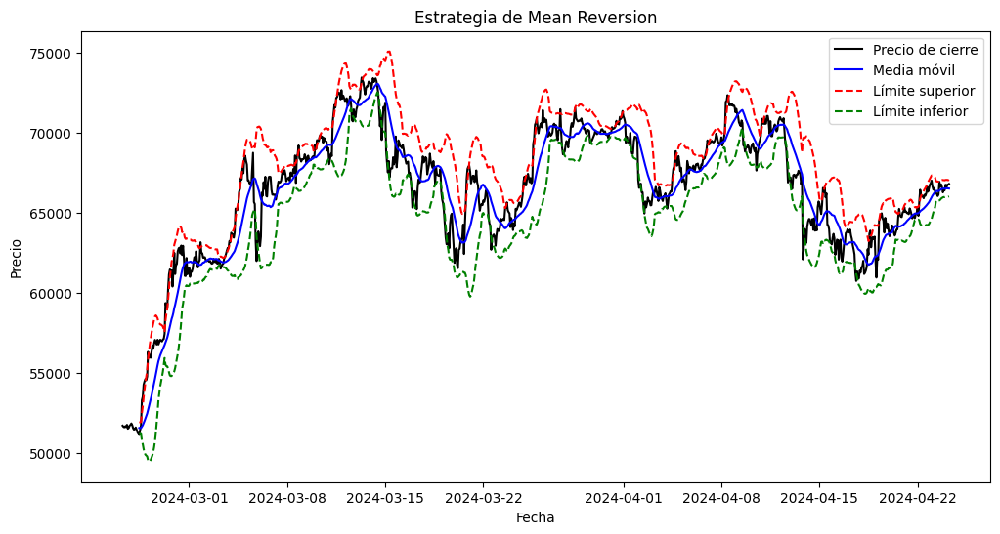

In [18]:
# reversionmedia.py
import pandas as pd
import numpy as np
import yfinance as yf
import talib as ta
from scipy.optimize import brute
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

class ReversionMedia:
    def __init__(self, simbolo, fecha_inicio, fecha_fin, intervalo, dias):
        self.simbolo = simbolo
        self.fecha_inicio = fecha_inicio
        self.fecha_fin = fecha_fin
        self.intervalo = intervalo
        self.dias = dias

    def obtener_datos_historicos(self):
        datos = yf.download(self.simbolo, start=self.fecha_inicio, end=self.fecha_fin, interval=self.intervalo)
        return datos

    def calcular_media_movil(self, datos, ventana):
        datos['SMA'] = ta.SMA(datos['Close'], timeperiod=ventana)
        return datos

    def estrategia_mean_reversion(self, datos, ventana, desviacion):
        datos = self.calcular_media_movil(datos, ventana)
        datos['Desviacion'] = ta.STDDEV(datos['Close'], timeperiod=ventana)
        datos['Upper_band'] = datos['SMA'] + (datos['Desviacion'] * desviacion)
        datos['Lower_band'] = datos['SMA'] - (datos['Desviacion'] * desviacion)
        return datos

    def graficar_datos(self, datos):
        plt.figure(figsize=(12,6))
        plt.plot(datos['Close'], label='Precio de cierre', color='black')
        plt.plot(datos['SMA'], label='Media móvil', color='blue')
        plt.plot(datos['Upper_band'], label='Límite superior', color='red', linestyle='--')
        plt.plot(datos['Lower_band'], label='Límite inferior', color='green', linestyle='--')
        plt.title('Estrategia de Mean Reversion')
        plt.xlabel('Fecha')
        plt.ylabel('Precio')
        plt.legend()
        plt.show()

# Configuración de parámetros
simbolo = "BTC-USD"
dias = 59
intervalo = "90m"

fecha_inicio = datetime.now() - timedelta(days=dias)
fecha_fin = datetime.now()

# Crear instancia de la clase ReversionMedia
reversion_media = ReversionMedia(simbolo, fecha_inicio, fecha_fin, intervalo, dias)

# Obtener datos históricos
datos_historicos = reversion_media.obtener_datos_historicos()

# Ejecutar estrategia de mean reversion
ventana = 20
desviacion = 2
datos_con_estrategia = reversion_media.estrategia_mean_reversion(datos_historicos, ventana, desviacion)

# Graficar datos
reversion_media.graficar_datos(datos_con_estrategia)


In [19]:
# reversionmedia.py
import pandas as pd
import numpy as np
import yfinance as yf
import talib as ta
from scipy.optimize import brute
import plotly.graph_objects as go
from datetime import datetime, timedelta

class ReversionMedia:
    def __init__(self, simbolo, fecha_inicio, fecha_fin, intervalo, dias):
        self.simbolo = simbolo
        self.fecha_inicio = fecha_inicio
        self.fecha_fin = fecha_fin
        self.intervalo = intervalo
        self.dias = dias

    def obtener_datos_historicos(self):
        datos = yf.download(self.simbolo, start=self.fecha_inicio, end=self.fecha_fin, interval=self.intervalo)
        return datos

    def calcular_media_movil(self, datos, ventana):
        datos['SMA'] = ta.SMA(datos['Close'], timeperiod=ventana)
        return datos

    def estrategia_mean_reversion(self, datos, ventana, desviacion):
        datos = self.calcular_media_movil(datos, ventana)
        datos['Desviacion'] = ta.STDDEV(datos['Close'], timeperiod=ventana)
        datos['Upper_band'] = datos['SMA'] + (datos['Desviacion'] * desviacion)
        datos['Lower_band'] = datos['SMA'] - (datos['Desviacion'] * desviacion)
        return datos

    def graficar_datos(self, datos):
        fig = go.Figure()

        fig.add_trace(go.Scatter(x=datos.index, y=datos['Close'], mode='lines', name='Precio de cierre', line=dict(color='black')))
        fig.add_trace(go.Scatter(x=datos.index, y=datos['SMA'], mode='lines', name='Media móvil', line=dict(color='blue')))
        fig.add_trace(go.Scatter(x=datos.index, y=datos['Upper_band'], mode='lines', name='Límite superior', line=dict(color='red', dash='dash')))
        fig.add_trace(go.Scatter(x=datos.index, y=datos['Lower_band'], mode='lines', name='Límite inferior', line=dict(color='green', dash='dash')))

        fig.update_layout(title='Estrategia de Mean Reversion',
                          xaxis_title='Fecha',
                          yaxis_title='Precio')

        fig.show()

# Configuración de parámetros
simbolo = "BTC-USD"
dias = 59
intervalo = "90m"

fecha_inicio = datetime.now() - timedelta(days=dias)
fecha_fin = datetime.now()

# Crear instancia de la clase ReversionMedia
reversion_media = ReversionMedia(simbolo, fecha_inicio, fecha_fin, intervalo, dias)

# Obtener datos históricos
datos_historicos = reversion_media.obtener_datos_historicos()

# Ejecutar estrategia de mean reversion
ventana = 20
desviacion = 2
datos_con_estrategia = reversion_media.estrategia_mean_reversion(datos_historicos, ventana, desviacion)

# Graficar datos
reversion_media.graficar_datos(datos_con_estrategia)


[*********************100%%**********************]  1 of 1 completed


In [23]:
class ReversionMedia:
    def __init__(self, simbolo, fecha_inicio, fecha_fin, intervalo, dias):
        self.simbolo = simbolo
        self.fecha_inicio = fecha_inicio
        self.fecha_fin = fecha_fin
        self.intervalo = intervalo
        self.dias = dias

    def obtener_datos_historicos(self):
        datos = yf.download(self.simbolo, start=self.fecha_inicio, end=self.fecha_fin, interval=self.intervalo)
        return datos

    def calcular_media_movil(self, datos, ventana):
        datos['SMA'] = ta.SMA(datos['Close'], timeperiod=ventana)
        return datos

    def estrategia_mean_reversion(self, datos, ventana, desviacion):
        datos = self.calcular_media_movil(datos, ventana)
        datos['Desviacion'] = ta.STDDEV(datos['Close'], timeperiod=ventana)
        datos['Upper_band'] = datos['SMA'] + (datos['Desviacion'] * desviacion)
        datos['Lower_band'] = datos['SMA'] - (datos['Desviacion'] * desviacion)
        return datos

    def tomar_decision(self, datos):
        ultimo_dato = datos.iloc[-1]
        if ultimo_dato['Close'] > ultimo_dato['Upper_band']:
            return "Vender"
        elif ultimo_dato['Close'] < ultimo_dato['Lower_band']:
            return "Comprar"
        else:
            return "Esperar"

    def graficar_datos(self, datos):
        fig = go.Figure()

        fig.add_trace(go.Scatter(x=datos.index, y=datos['Close'], mode='lines', name='Precio de cierre', line=dict(color='black')))
        fig.add_trace(go.Scatter(x=datos.index, y=datos['SMA'], mode='lines', name='Media móvil', line=dict(color='blue')))
        fig.add_trace(go.Scatter(x=datos.index, y=datos['Upper_band'], mode='lines', name='Límite superior', line=dict(color='red', dash='dash')))
        fig.add_trace(go.Scatter(x=datos.index, y=datos['Lower_band'], mode='lines', name='Límite inferior', line=dict(color='green', dash='dash')))

        fig.update_layout(title='Estrategia de Mean Reversion',
                          xaxis_title='Fecha',
                          yaxis_title='Precio')

        fig.show()


# Configuración de parámetros
simbolo = "BTC-USD" #@param ["BTC-USD", "ETH-USD", "ADA-USD", "SOL-USD", "DOT-USD", "USDT-USD", "DAI-USD", "USDC-USD", "LUNA-USD", "MATIC-USD", "AVAX-USD", "BNB-USD", "MANA-USD", "SAND-USD", "SLP-USD", "AXS-USD", "UNI-USD", "ALGO-USD", "AAVE-USD", "ENS-USD", "NEAR-USD", "FTM-USD", "PAXG-USD", "DOGE-USD", "TRX-USD", "ARB-USD", "LTC-USD", "XLM-USD", "OP-USD", "TRX-USD", "LUNA-USD"]
dias = "7"  #@param ["59", "15", "7", "1"]
intervalo = "5m" #@param ["1m", "5m", "15m", "60m", "90m", "120m", "1d"]

fecha_inicio = datetime.now() - timedelta(days=int(dias))
fecha_fin = datetime.now()

# Crear instancia de la clase ReversionMedia
reversion_media = ReversionMedia(simbolo, fecha_inicio, fecha_fin, intervalo, int(dias))

# Obtener datos históricos
datos_historicos = reversion_media.obtener_datos_historicos()

# Ejecutar estrategia de mean reversion
ventana = 20
desviacion = 2
datos_con_estrategia = reversion_media.estrategia_mean_reversion(datos_historicos, ventana, desviacion)

# Graficar datos
reversion_media.graficar_datos(datos_con_estrategia)

# Tomar decisión basada en la estrategia de reversión a la media
decision = reversion_media.tomar_decision(datos_con_estrategia)
print("Decisión:", decision)


[*********************100%%**********************]  1 of 1 completed


Decisión: Esperar


In [32]:
import yfinance as yf
import talib as ta
import plotly.graph_objects as go
from datetime import datetime, timedelta

class EstrategiaStopLossTakeProfit:
    def __init__(self, simbolo, fecha_inicio, fecha_fin, intervalo, dias, stop_loss, take_profit, apalancamiento):
        """
        Inicializa la clase con los parámetros necesarios.
        """
        self.simbolo = simbolo
        self.fecha_inicio = fecha_inicio
        self.fecha_fin = fecha_fin
        self.intervalo = intervalo
        self.dias = dias
        self.stop_loss = stop_loss
        self.take_profit = take_profit
        self.apalancamiento = apalancamiento

    def obtener_datos_historicos(self):
        """
        Obtiene los datos históricos del símbolo especificado.
        """
        datos = yf.download(self.simbolo, start=self.fecha_inicio, end=self.fecha_fin, interval=self.intervalo)
        return datos

    def calcular_stop_loss_take_profit(self, datos):
        """
        Calcula los niveles de Stop Loss y Take Profit utilizando talib.
        """
        ultimo_precio = datos['Close'].iloc[-1]
        atr = ta.ATR(datos['High'], datos['Low'], datos['Close'], timeperiod=14).iloc[-1]
        stop_loss_price = ultimo_precio - (atr * self.stop_loss)
        take_profit_price = ultimo_precio + (atr * self.take_profit)
        return stop_loss_price, take_profit_price

    def calcular_apalancamiento(self, datos):
        """
        Calcula el apalancamiento basado en los datos históricos.
        """
        ultimo_precio = datos['Close'].iloc[-1]
        margen_requerido = ultimo_precio / self.apalancamiento
        return margen_requerido

    def tomar_decision(self, datos, stop_loss_price, take_profit_price, margen_requerido):
        """
        Toma una decisión basada en los niveles calculados y el apalancamiento.
        """
        ultimo_precio = datos['Close'].iloc[-1]
        if ultimo_precio <= stop_loss_price:
            return "Vender"
        elif ultimo_precio >= take_profit_price:
            return "Comprar"
        elif margen_requerido <= self.stop_loss:
            return "Esperar, Pérdida máxima alcanzada"
        elif margen_requerido >= self.apalancamiento:
            return "Esperar, Margen requerido excede el apalancamiento"
        else:
            return "Esperar"

    def graficar_datos(self, datos, stop_loss_price, take_profit_price):
        """
        Grafica los datos históricos junto con los niveles de Stop Loss y Take Profit.
        """
        fig = go.Figure()

        fig.add_trace(go.Scatter(x=datos.index, y=datos['Close'], mode='lines', name='Precio de cierre', line=dict(color='black')))
        fig.add_trace(go.Scatter(x=datos.index, y=[stop_loss_price] * len(datos.index), mode='lines', name='Stop Loss', line=dict(color='red', dash='dash')))
        fig.add_trace(go.Scatter(x=datos.index, y=[take_profit_price] * len(datos.index), mode='lines', name='Take Profit', line=dict(color='green', dash='dash')))

        fig.update_layout(title='Estrategia de Stop Loss y Take Profit',
                          xaxis_title='Fecha',
                          yaxis_title='Precio')

        fig.show()


# Configuración de parámetros
simbolo = "DOGE-USD"
dias = 3
intervalo = "1m"
stop_loss = 0.05  # 5% de pérdida máxima permitida
take_profit = 0.1  # 10% de ganancia objetivo
apalancamiento = 3  # Apalancamiento de 10x

fecha_inicio = datetime.now() - timedelta(days=dias)
fecha_fin = datetime.now()

# Crear instancia de la clase EstrategiaStopLossTakeProfit
estrategia = EstrategiaStopLossTakeProfit(simbolo, fecha_inicio, fecha_fin, intervalo, dias, stop_loss, take_profit, apalancamiento)

# Obtener datos históricos
datos_historicos = estrategia.obtener_datos_historicos()

# Calcular Stop Loss y Take Profit
stop_loss_price, take_profit_price = estrategia.calcular_stop_loss_take_profit(datos_historicos)

# Calcular apalancamiento
margen_requerido = estrategia.calcular_apalancamiento(datos_historicos)

# Tomar decisión basada en la estrategia
decision = estrategia.tomar_decision(datos_historicos, stop_loss_price, take_profit_price, margen_requerido)
print("Decisión:", decision)

# Graficar datos
estrategia.graficar_datos(datos_historicos, stop_loss_price, take_profit_price)


[*********************100%%**********************]  1 of 1 completed


Decisión: Esperar


In [33]:
import yfinance as yf
import talib as ta
import plotly.graph_objects as go
from datetime import datetime, timedelta

class EstrategiaStopLossTakeProfit:
    def __init__(self, simbolo, fecha_inicio, fecha_fin, intervalo, dias, stop_loss, take_profit, apalancamiento):
        """
        Inicializa la clase con los parámetros necesarios.
        """
        self.simbolo = simbolo
        self.fecha_inicio = fecha_inicio
        self.fecha_fin = fecha_fin
        self.intervalo = intervalo
        self.dias = dias
        self.stop_loss = stop_loss
        self.take_profit = take_profit
        self.apalancamiento = apalancamiento

    def obtener_datos_historicos(self):
        """
        Obtiene los datos históricos del símbolo especificado.
        """
        datos = yf.download(self.simbolo, start=self.fecha_inicio, end=self.fecha_fin, interval=self.intervalo)
        return datos

    def calcular_stop_loss_take_profit(self, datos):
        """
        Calcula los niveles de Stop Loss y Take Profit utilizando talib.
        """
        atr = ta.ATR(datos['High'], datos['Low'], datos['Close'], timeperiod=14).iloc[-1]
        ultimo_precio = datos['Close'].iloc[-1]
        stop_loss_price = ultimo_precio - (atr * self.stop_loss)
        take_profit_price = ultimo_precio + (atr * self.take_profit)
        return stop_loss_price, take_profit_price

    def calcular_apalancamiento(self, datos):
        """
        Calcula el apalancamiento basado en los datos históricos.
        """
        ultimo_precio = datos['Close'].iloc[-1]
        margen_requerido = ultimo_precio / self.apalancamiento
        return margen_requerido

    def tomar_decision(self, datos, stop_loss_price, take_profit_price, margen_requerido):
        """
        Toma una decisión basada en los niveles calculados y el apalancamiento.
        """
        ultimo_precio = datos['Close'].iloc[-1]
        if ultimo_precio <= stop_loss_price:
            return "Vender"
        elif ultimo_precio >= take_profit_price:
            return "Comprar"
        elif margen_requerido >= 1 / self.apalancamiento:
            return "Esperar, Margen requerido excede el apalancamiento"
        else:
            return "Esperar"

    def graficar_datos(self, datos, stop_loss_price, take_profit_price):
        """
        Grafica los datos históricos junto con los niveles de Stop Loss y Take Profit.
        """
        fig = go.Figure()

        fig.add_trace(go.Scatter(x=datos.index, y=datos['Close'], mode='lines', name='Precio de cierre', line=dict(color='black')))
        fig.add_trace(go.Scatter(x=datos.index, y=[stop_loss_price] * len(datos.index), mode='lines', name='Stop Loss', line=dict(color='red', dash='dash')))
        fig.add_trace(go.Scatter(x=datos.index, y=[take_profit_price] * len(datos.index), mode='lines', name='Take Profit', line=dict(color='green', dash='dash')))

        fig.update_layout(title='Estrategia de Stop Loss y Take Profit',
                          xaxis_title='Fecha',
                          yaxis_title='Precio')

        fig.show()


# Configuración de parámetros
simbolo = "DOGE-USD"
dias = 3
intervalo = "1m"
stop_loss = 0.05  # 5% de pérdida máxima permitida
take_profit = 0.1  # 10% de ganancia objetivo
apalancamiento = 3  # Apalancamiento de 3x

fecha_inicio = datetime.now() - timedelta(days=dias)
fecha_fin = datetime.now()

# Crear instancia de la clase EstrategiaStopLossTakeProfit
estrategia = EstrategiaStopLossTakeProfit(simbolo, fecha_inicio, fecha_fin, intervalo, dias, stop_loss, take_profit, apalancamiento)

# Obtener datos históricos
datos_historicos = estrategia.obtener_datos_historicos()

# Calcular Stop Loss y Take Profit
stop_loss_price, take_profit_price = estrategia.calcular_stop_loss_take_profit(datos_historicos)

# Calcular apalancamiento
margen_requerido = estrategia.calcular_apalancamiento(datos_historicos)

# Tomar decisión basada en la estrategia
decision = estrategia.tomar_decision(datos_historicos, stop_loss_price, take_profit_price, margen_requerido)
print("Decisión:", decision)

# Graficar datos
estrategia.graficar_datos(datos_historicos, stop_loss_price, take_profit_price)


[*********************100%%**********************]  1 of 1 completed


Decisión: Esperar


In [39]:
import yfinance as yf
import talib as ta
import plotly.graph_objects as go
from datetime import datetime, timedelta

class EstrategiaStopLossTakeProfit:
    def __init__(self, simbolo, fecha_inicio, fecha_fin, intervalo, dias, stop_loss, take_profit, apalancamiento):
        """
        Inicializa la clase con los parámetros necesarios.
        """
        self.simbolo = simbolo
        self.fecha_inicio = fecha_inicio
        self.fecha_fin = fecha_fin
        self.intervalo = intervalo
        self.dias = dias
        self.stop_loss = stop_loss
        self.take_profit = take_profit
        self.apalancamiento = apalancamiento

    def obtener_datos_historicos(self):
        """
        Obtiene los datos históricos del símbolo especificado.
        """
        datos = yf.download(self.simbolo, start=self.fecha_inicio, end=self.fecha_fin, interval=self.intervalo)
        return datos

    def calcular_stop_loss_take_profit(self, datos):
        """
        Calcula los niveles de Stop Loss y Take Profit utilizando talib.
        """
        atr = ta.ATR(datos['High'], datos['Low'], datos['Close'], timeperiod=14).iloc[-1]
        ultimo_precio = datos['Close'].iloc[-1]
        stop_loss_price = ultimo_precio - (atr * self.stop_loss)
        take_profit_price = ultimo_precio + (atr * self.take_profit)
        return stop_loss_price, take_profit_price

    def calcular_apalancamiento(self, datos):
        """
        Calcula el apalancamiento basado en los datos históricos.
        """
        ultimo_precio = datos['Close'].iloc[-1]
        margen_requerido = ultimo_precio / self.apalancamiento
        return margen_requerido

    def tomar_decision(self, datos, stop_loss_price, take_profit_price, margen_requerido):
        """
        Toma una decisión basada en los niveles calculados y el apalancamiento.
        """
        ultimo_precio = datos['Close'].iloc[-1]
        if ultimo_precio <= stop_loss_price:
            return "Vender"
        elif ultimo_precio >= take_profit_price:
            return "Comprar"
        elif margen_requerido >= 1 / self.apalancamiento:
            return "Esperar, Margen requerido excede el apalancamiento"
        else:
            return "Esperar"

    def graficar_datos(self, datos, stop_loss_price, take_profit_price):
        """
        Grafica los datos históricos junto con los niveles de Stop Loss y Take Profit.
        """
        fig = go.Figure()

        fig.add_trace(go.Scatter(x=datos.index, y=datos['Close'], mode='lines', name='Precio de cierre', line=dict(color='black')))
        fig.add_trace(go.Scatter(x=datos.index, y=[stop_loss_price] * len(datos.index), mode='lines', name='Stop Loss', line=dict(color='red', dash='dash')))
        fig.add_trace(go.Scatter(x=datos.index, y=[take_profit_price] * len(datos.index), mode='lines', name='Take Profit', line=dict(color='green', dash='dash')))

        fig.update_layout(title='Estrategia de Stop Loss y Take Profit',
                          xaxis_title='Fecha',
                          yaxis_title='Precio')

        fig.show()

# Configuración de parámetros
simbolo = "ETH-USD" #@param ["BTC-USD", "ETH-USD", "ADA-USD", "SOL-USD", "DOT-USD", "USDT-USD", "DAI-USD", "USDC-USD", "LUNA-USD", "MATIC-USD", "AVAX-USD", "BNB-USD", "MANA-USD", "SAND-USD", "SLP-USD", "AXS-USD", "UNI-USD", "ALGO-USD", "AAVE-USD", "ENS-USD", "NEAR-USD", "FTM-USD", "PAXG-USD", "DOGE-USD", "TRX-USD", "ARB-USD", "LTC-USD", "XLM-USD", "OP-USD", "TRX-USD", "LUNA-USD"]
dias = "7"  #@param ["59", "45", "30", "20", "15", "7", "6", "5", "4", "3", "2", "1"]
intervalo = "1m" #@param ["1m", "5m", "15m", "60m", "90m", "120m", "1d"]

fecha_inicio = datetime.now() - timedelta(days=int(dias))
fecha_fin = datetime.now()

stop_loss = 0.05  # 5% de pérdida máxima permitida
take_profit = 0.1  # 10% de ganancia objetivo
apalancamiento = 3  # Apalancamiento de 3x


# Crear instancia de la clase EstrategiaStopLossTakeProfit
estrategia = EstrategiaStopLossTakeProfit(simbolo, fecha_inicio, fecha_fin, intervalo, dias, stop_loss, take_profit, apalancamiento)

# Obtener datos históricos
datos_historicos = estrategia.obtener_datos_historicos()

# Calcular Stop Loss y Take Profit
stop_loss_price, take_profit_price = estrategia.calcular_stop_loss_take_profit(datos_historicos)

# Calcular apalancamiento
margen_requerido = estrategia.calcular_apalancamiento(datos_historicos)

# Tomar decisión basada en la estrategia
decision = estrategia.tomar_decision(datos_historicos, stop_loss_price, take_profit_price, margen_requerido)
print("Decisión:", decision)

# Graficar datos
estrategia.graficar_datos(datos_historicos, stop_loss_price, take_profit_price)


[*********************100%%**********************]  1 of 1 completed


Decisión: Esperar, Margen requerido excede el apalancamiento
